In [1]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 STC SAUDI ARABIAN GRAND PRIX 2025
The Saudi Arabian Grand Prix (Arabic: جائزة السعودية الكبرى) is a Formula One motor racing event which took place for the first time in 2021. The inaugural edition of the race was held in Jeddah, in Saudi Arabia. It was the fifth full-night race title on the Formula One calendar, following the Singapore, Bahrain, Sakhir and Qatar Grands Prix.[1] Source: Wikipedia

## Obtain session information

In [2]:
libraryDataF1.obtain_information('sessions',year=2025,country_acronym='KSA')

,session_key,session_name,date_start,date_end,gmt_offset,session_type,meeting_key,location,country_key,country_code,country_name,circuit_key,circuit_short_name,year
0,10015,Practice 1,2025-04-18T13:30:00+00:00,2025-04-18T14:30:00+00:00,03:00:00,Practice,1258,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2025
1,10016,Practice 2,2025-04-18T17:00:00+00:00,2025-04-18T18:00:00+00:00,03:00:00,Practice,1258,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2025
2,10017,Practice 3,2025-04-19T13:30:00+00:00,2025-04-19T14:30:00+00:00,03:00:00,Practice,1258,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2025
3,10018,Qualifying,2025-04-19T17:00:00+00:00,2025-04-19T18:00:00+00:00,03:00:00,Qualifying,1258,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2025
4,10022,Race,2025-04-20T17:00:00+00:00,2025-04-20T19:00:00+00:00,03:00:00,Race,1258,Jeddah,153,KSA,Saudi Arabia,149,Jeddah,2025


req         WARNING 	DEFAULT CACHE ENABLED! (3.61 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Saudi Arabian Grand Prix - Practice 1 [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to ca

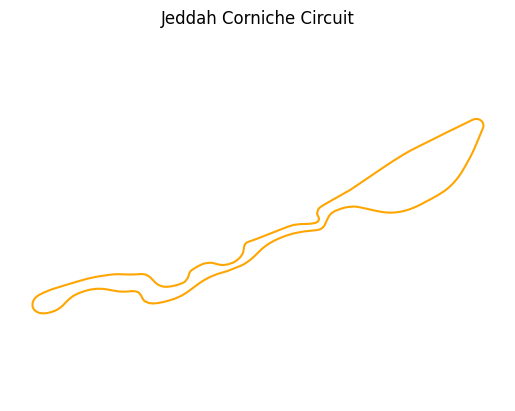

In [5]:
session = ff1.get_session(2025, 5, 'FP1')
session.load()

lap = session.laps.pick_fastest()
pos = lap.get_pos_data()

circuit_info = session.get_circuit_info()
libraryDataF1.draw_track(circuit_info,pos,"Jeddah Corniche Circuit")

## Free Practice 1
### Obtain setup

In [5]:
practice = libraryDataF1.obtain_information('laps',session_key=10015)
stintInformation = libraryDataF1.obtain_information('stints',session_key=10015)
drivers = libraryDataF1.obtain_information('drivers',session_key=10015)

In [6]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap
Sauber and RB centered on straights while Aston and Haas seems that they centered on the technical zone.

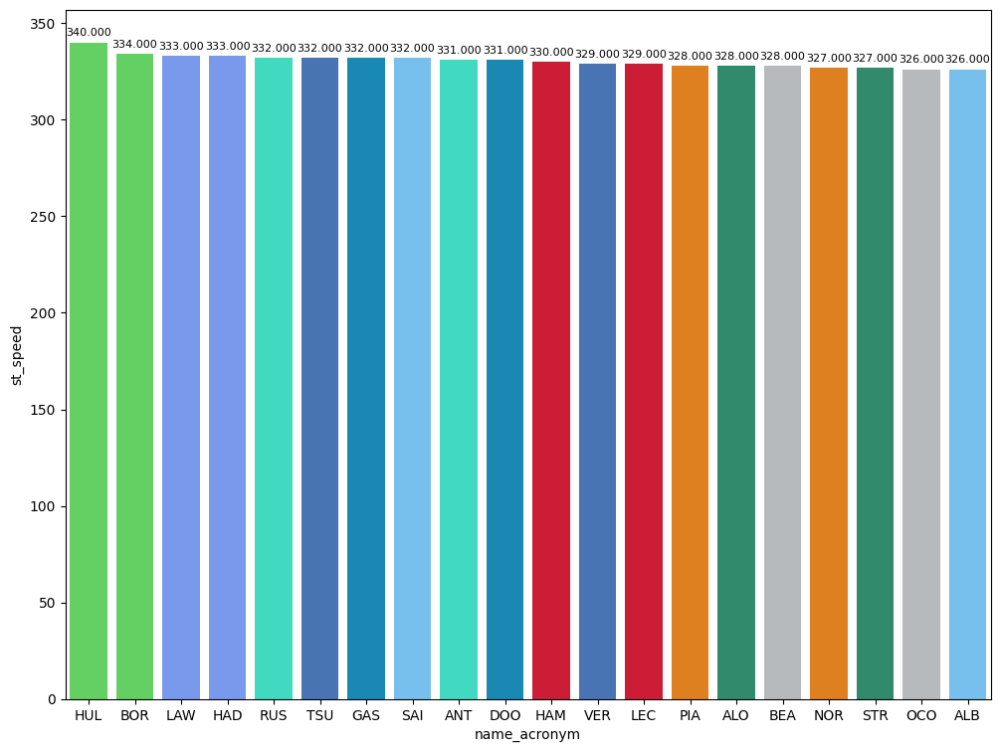

In [7]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

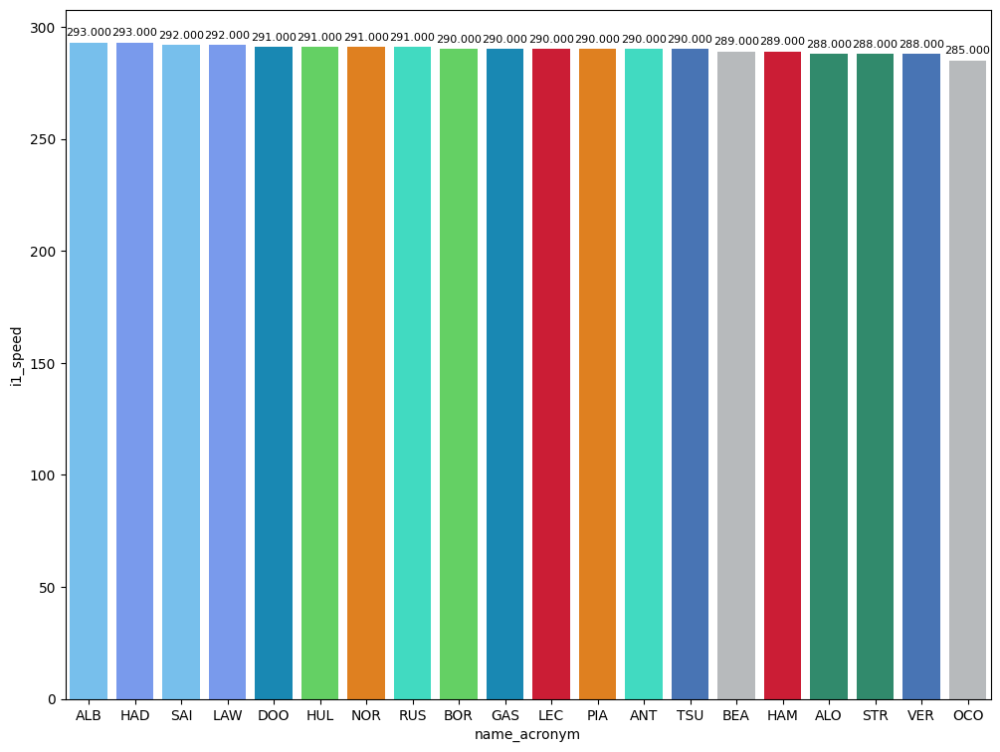

In [8]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

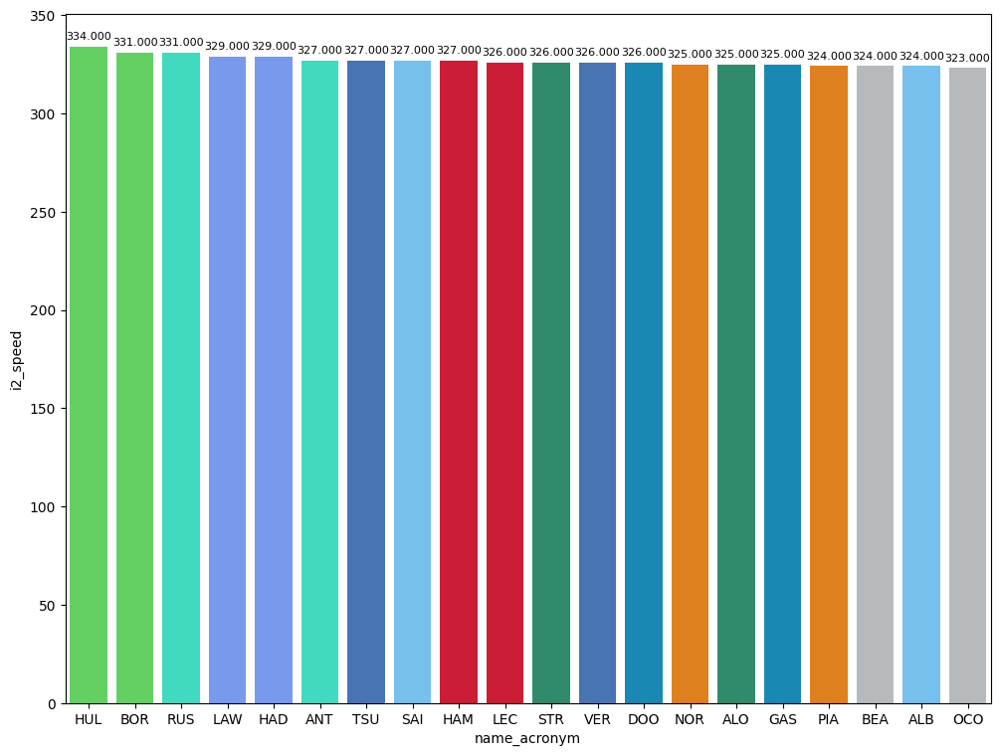

In [9]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [10]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
110,Carlos SAINZ,HARD,32.925,28.474,28.937,90.336
116,George RUSSELL,MEDIUM,32.686,28.200,28.788,89.674
238,Pierre GASLY,SOFT,32.407,28.296,28.536,89.239
176,Jack DOOHAN,UNKNOWN,32.994,28.595,28.936,90.525


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session.
Gasly was the fastest but the differences are so close. 
Aston and Haas suffers in this circuit while Ferrari will be stronger than McLaren to take the pole.
Williams and Red Bull will fight for Q3.

In [11]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


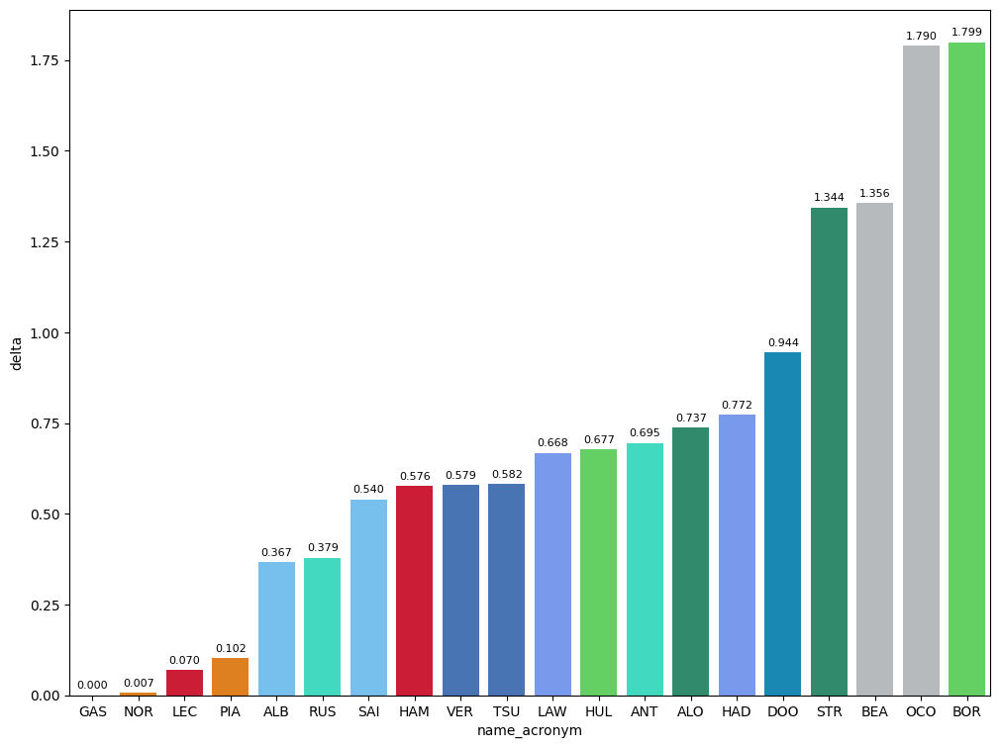

In [12]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.
S1: McLaren is the fastest followed by Gasly. Sauber RB and Haas could suffer here.
S2: It will be a close battle among Ferrari, McLaren and Mercedes. Red Bull and Alpine suffer here.
S3: Gasly was the fastest so Alpine has a potential. AM and Haas suffered here. Red Bull and Ferrari should improve here.

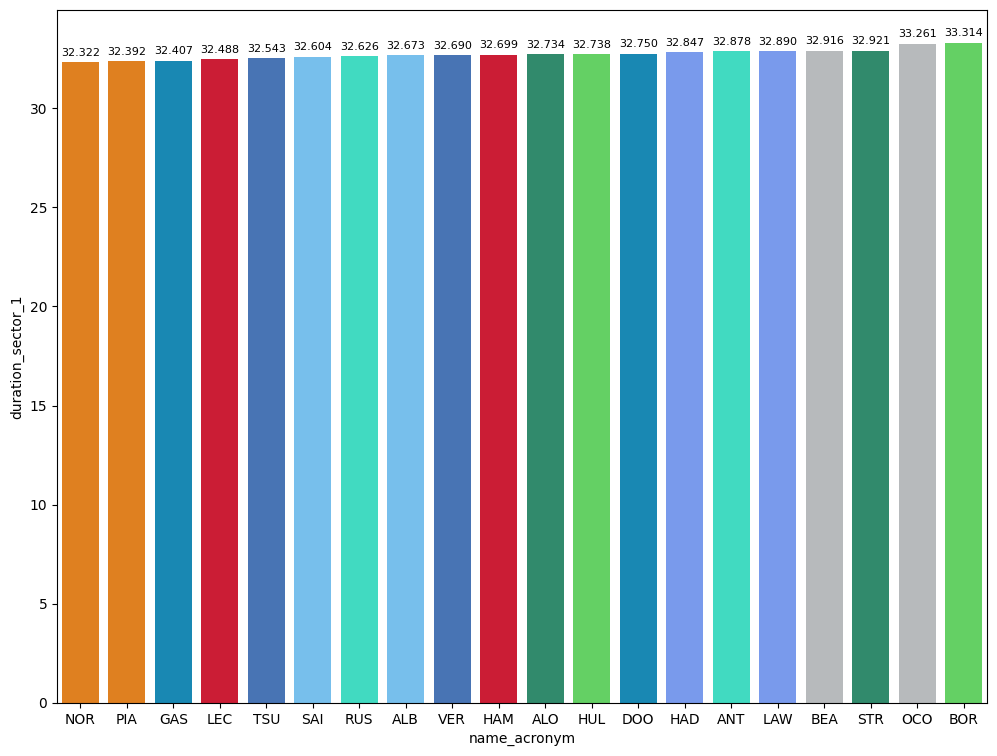

In [13]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

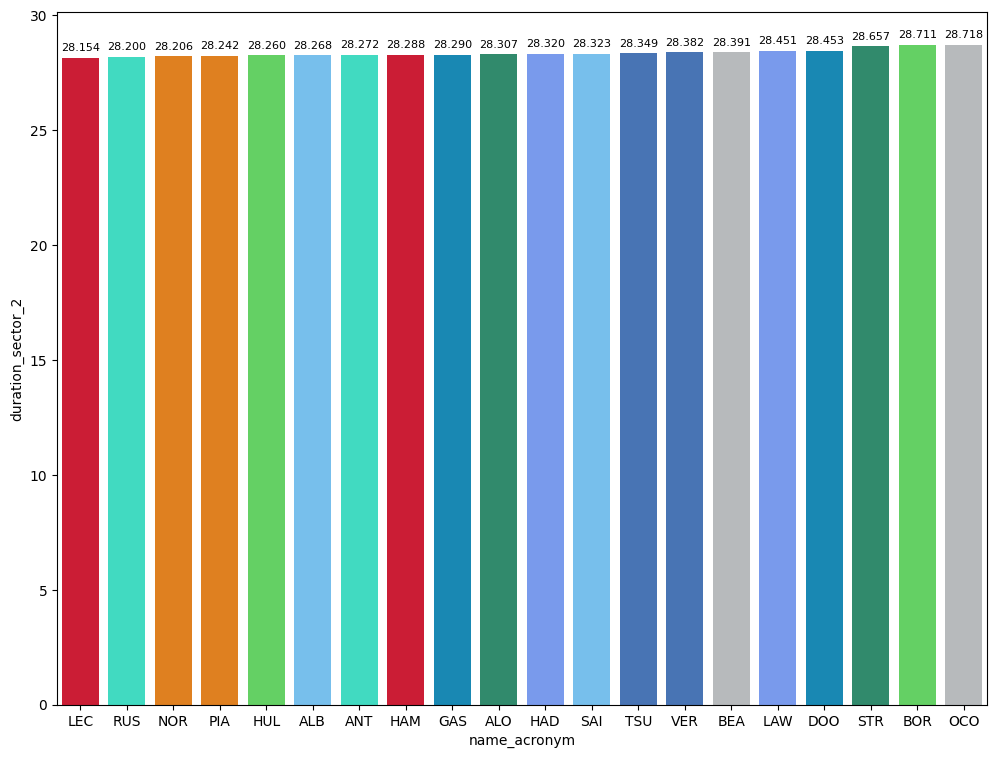

In [14]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

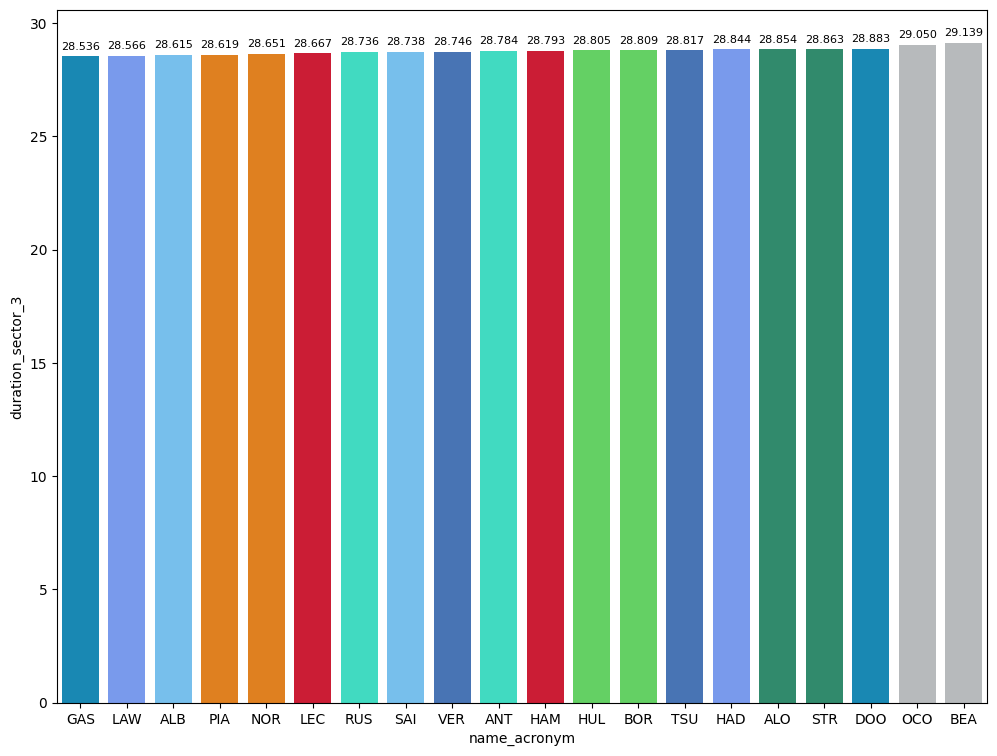

In [15]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [16]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 103").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
UNKNOWN,90.525000
SOFT,92.546629
MEDIUM,93.745538
HARD,93.750938


## Free Practice 2
### Obtain setup

In [3]:
practice = libraryDataF1.obtain_information('laps',session_key=10016)
stintInformation = libraryDataF1.obtain_information('stints',session_key=10016)
drivers = libraryDataF1.obtain_information('drivers',session_key=10016)

In [4]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap
Aston was the worst in top speed. It is supposed that Aston and McLaren are centered on turns.
Ferrari was the fastest as Sauber ccentered on straights.

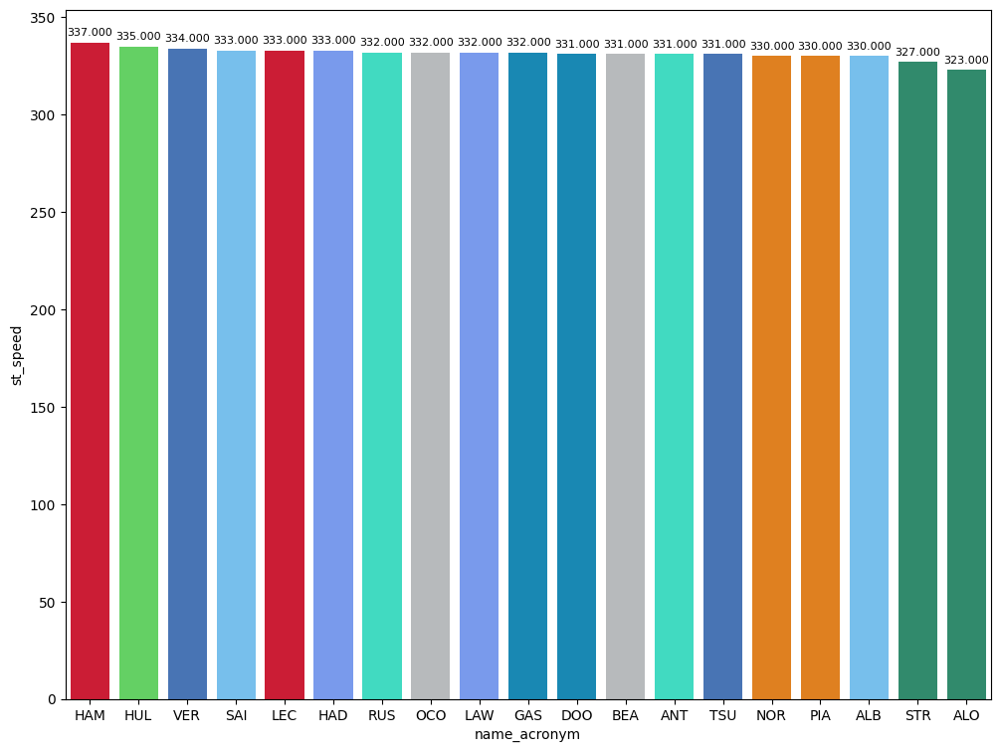

In [5]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

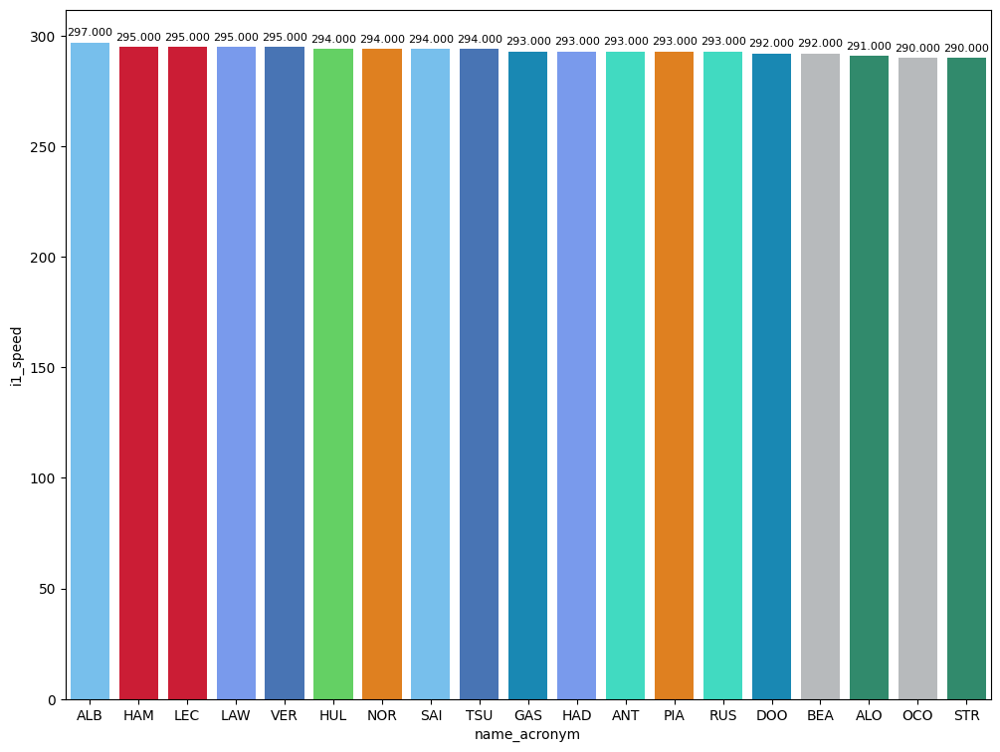

In [6]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

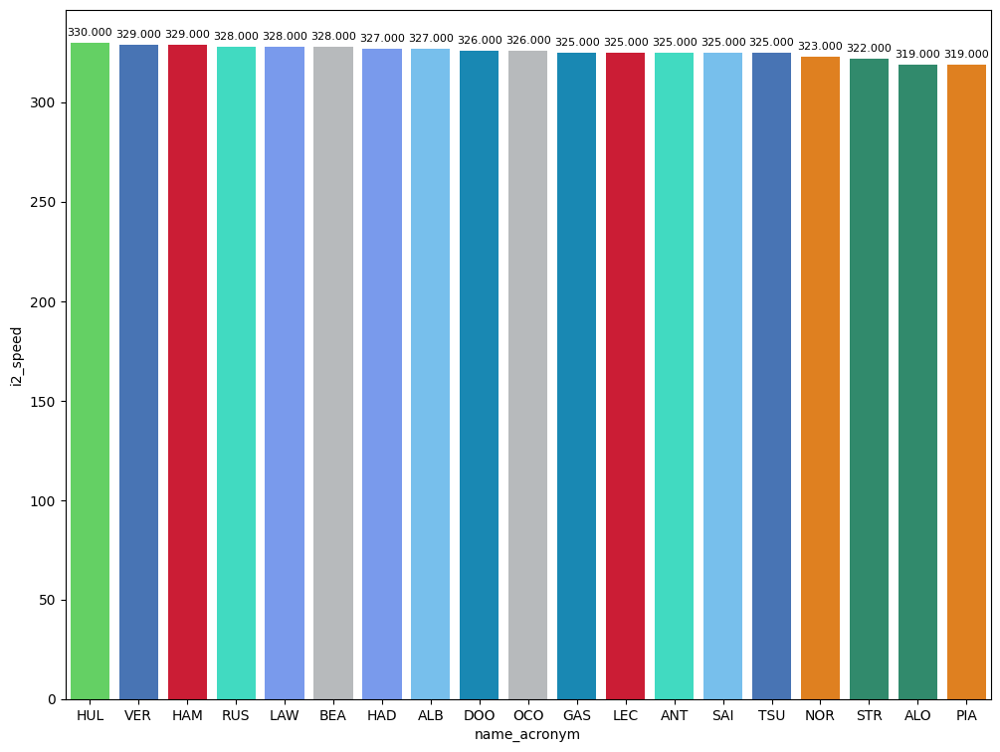

In [7]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [8]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
109,Alexander ALBON,HARD,32.729,28.252,28.741,89.722
134,Charles LECLERC,MEDIUM,32.441,28.161,28.400,89.002
256,Lando NORRIS,SOFT,32.174,27.898,28.195,88.267


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session
Aston and Haas will suffer in this GP. Maybe DOO could be knocked-out. Alpine and Williams could fight for Q3.
Red Bull with both cars could be on the battle for pole.

In [9]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


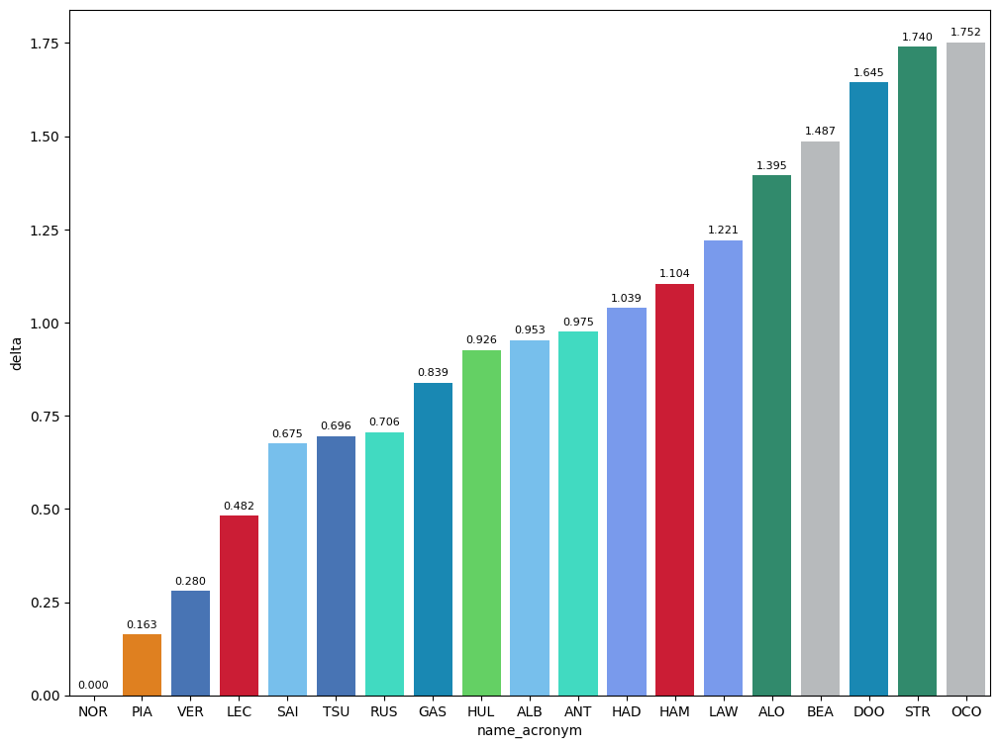

In [10]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.
S1: McLaren was the fastest followed by Red Bull for fighting for being the best of the season. Haas and Sauber could suffer here.
S2: haas could have its opportunity in this sector. Aston is the worst here. Ferrari could gain some positions on Q.
S3: Haas and Sauber can improve if BEA or HUL laptime are taken into account.It is probably that Aston be knocked out.

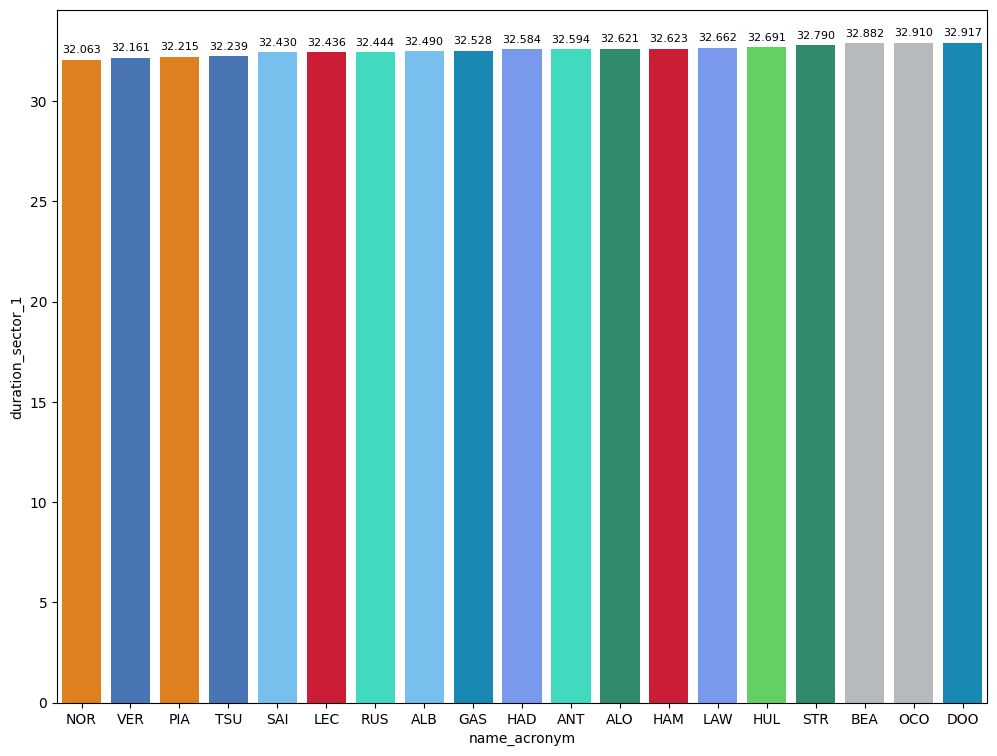

In [11]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

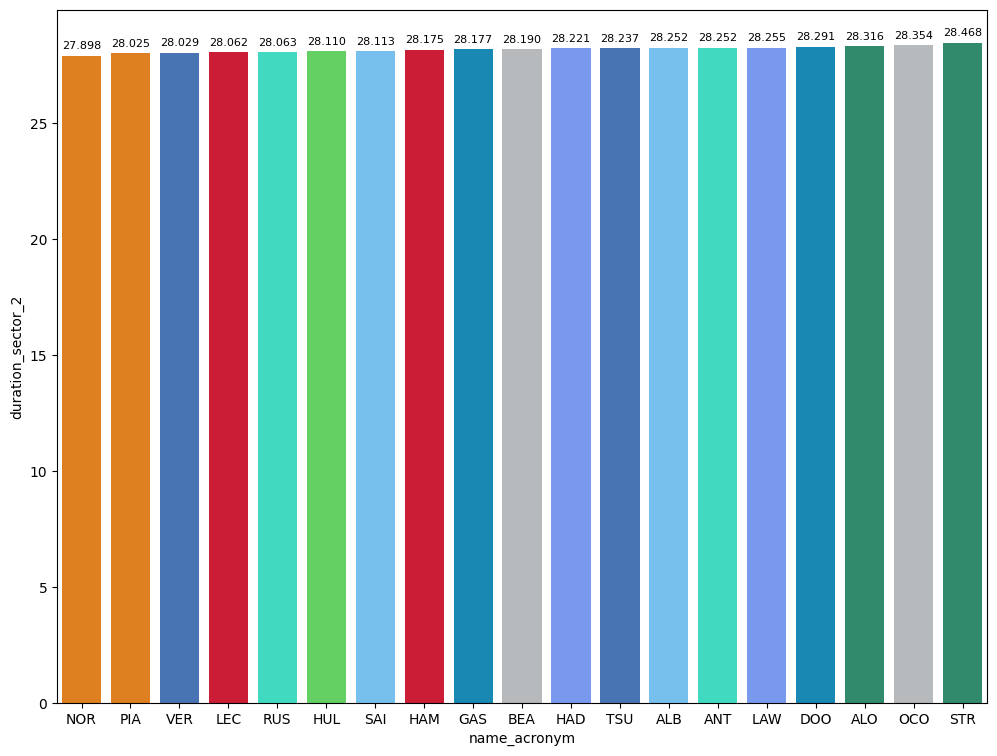

In [12]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

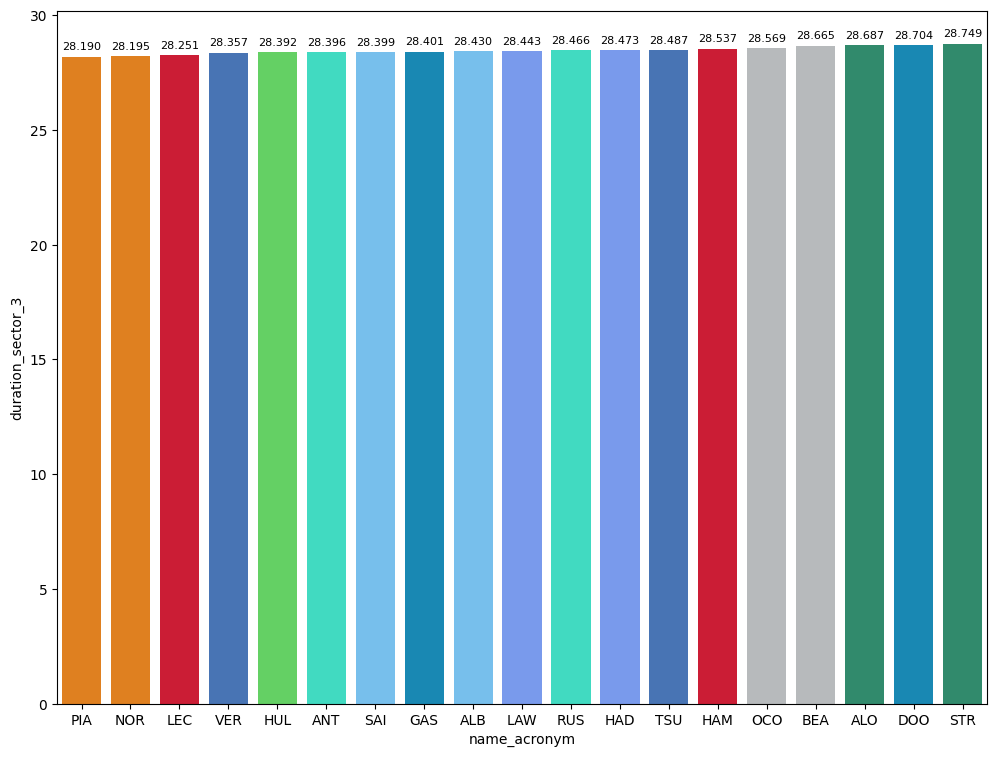

In [13]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [14]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False and lap_duration>93.5 and lap_duration <= 96").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
MEDIUM,94.950382
HARD,94.970000
SOFT,95.428000


### Lap Time Distributions

/home/frank/Escritorio/F1_backup/F1_notebooks/F1_25/F1_library/libraryF1dataNotebook.py:576: UserWarning:

The palette list has more values (20) than needed (14), which may not be intended.



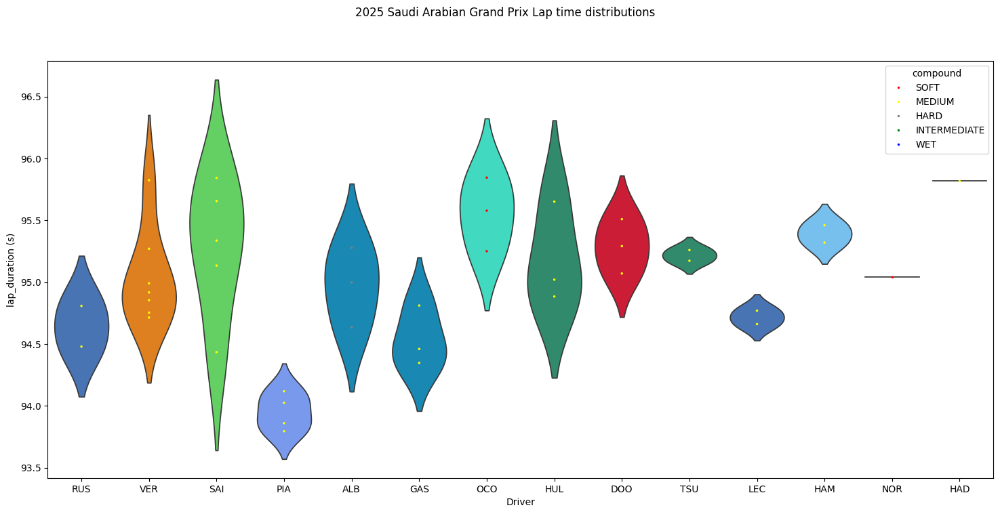

In [109]:
libraryDataF1.lap_time_distributions("2025 Saudi Arabian Grand Prix Lap time distributions",drivers,jointables2.query("lap_duration<96 and lap_duration >= 93"))

### Long runs

In [27]:
MINIMUN_SECONDS = 93
MAXIMUM_SECONDS = 96

#### Red Bull Racing

In [28]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1258,10016,1,22,1,4,MEDIUM,0.0
8,1258,10016,1,1,1,8,MEDIUM,0.0
20,1258,10016,2,22,5,7,MEDIUM,3.0
27,1258,10016,3,22,8,10,MEDIUM,6.0
28,1258,10016,2,1,9,11,SOFT,0.0
44,1258,10016,4,22,11,14,SOFT,0.0
49,1258,10016,3,1,12,22,MEDIUM,7.0
61,1258,10016,5,22,15,16,SOFT,4.0
78,1258,10016,6,22,17,20,MEDIUM,0.0
94,1258,10016,4,1,22,22,SOFT,3.0


In [29]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
257,Max VERSTAPPEN,MEDIUM,2025-04-18T17:37:32.516000+00:00,12,34.966,29.963,29.988,94.917
266,Max VERSTAPPEN,MEDIUM,2025-04-18T17:39:07.358000+00:00,13,34.966,29.827,30.061,94.854
269,Max VERSTAPPEN,MEDIUM,2025-04-18T17:40:42.223000+00:00,14,34.909,29.808,29.997,94.714
272,Max VERSTAPPEN,MEDIUM,2025-04-18T17:42:16.970000+00:00,15,34.881,29.821,30.051,94.753
289,Max VERSTAPPEN,MEDIUM,2025-04-18T17:45:31.846000+00:00,17,35.005,29.901,30.084,94.990
302,Max VERSTAPPEN,MEDIUM,2025-04-18T17:47:06.922000+00:00,18,35.118,29.998,30.154,95.270
318,Max VERSTAPPEN,MEDIUM,2025-04-18T17:48:42.224000+00:00,19,35.303,30.044,30.477,95.824


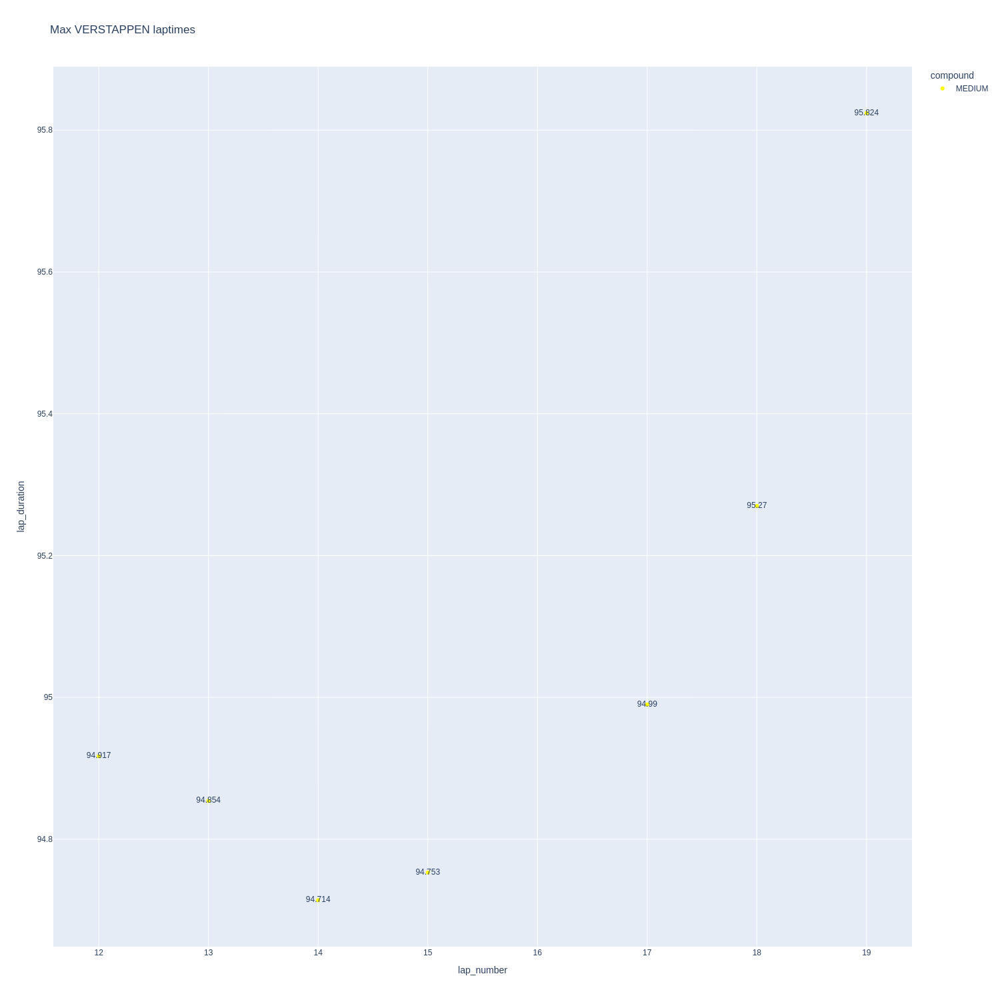

In [30]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

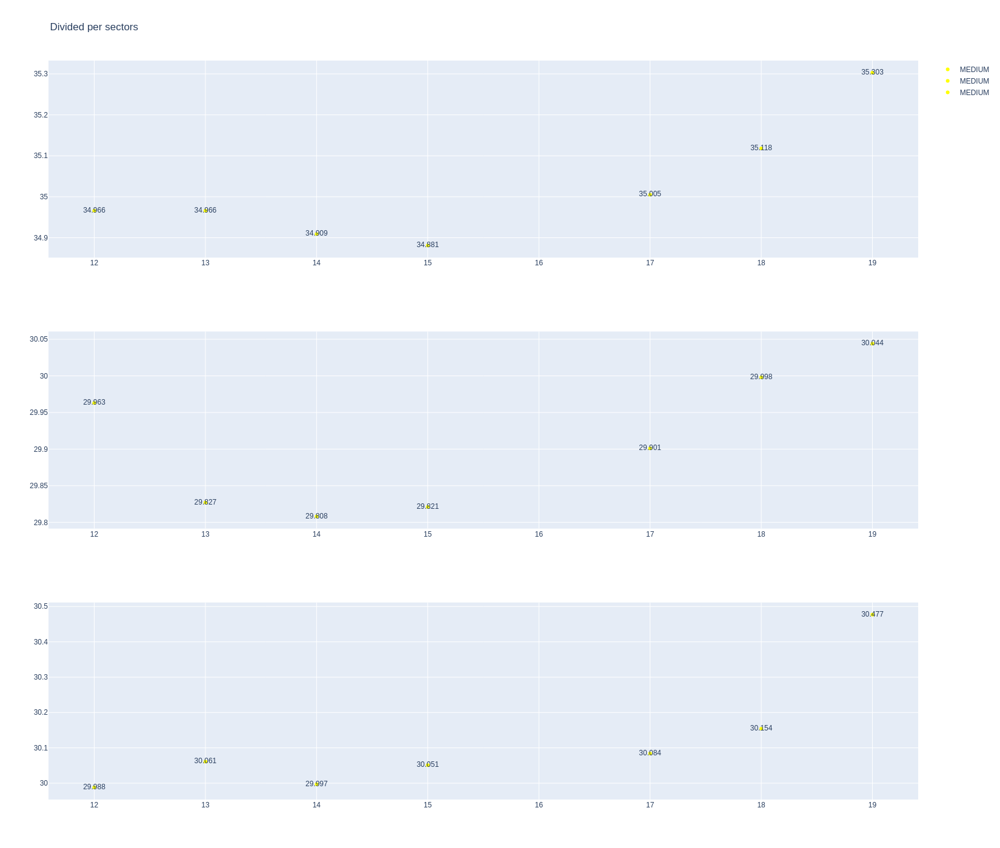

In [31]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [32]:
data = libraryDataF1.getinfolongruns(jointables2,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
298,Yuki TSUNODA,MEDIUM,2025-04-18T17:46:22.300000+00:00,17,35.000,29.958,30.215,95.173
311,Yuki TSUNODA,MEDIUM,2025-04-18T17:47:57.417000+00:00,18,35.197,29.940,30.122,95.259


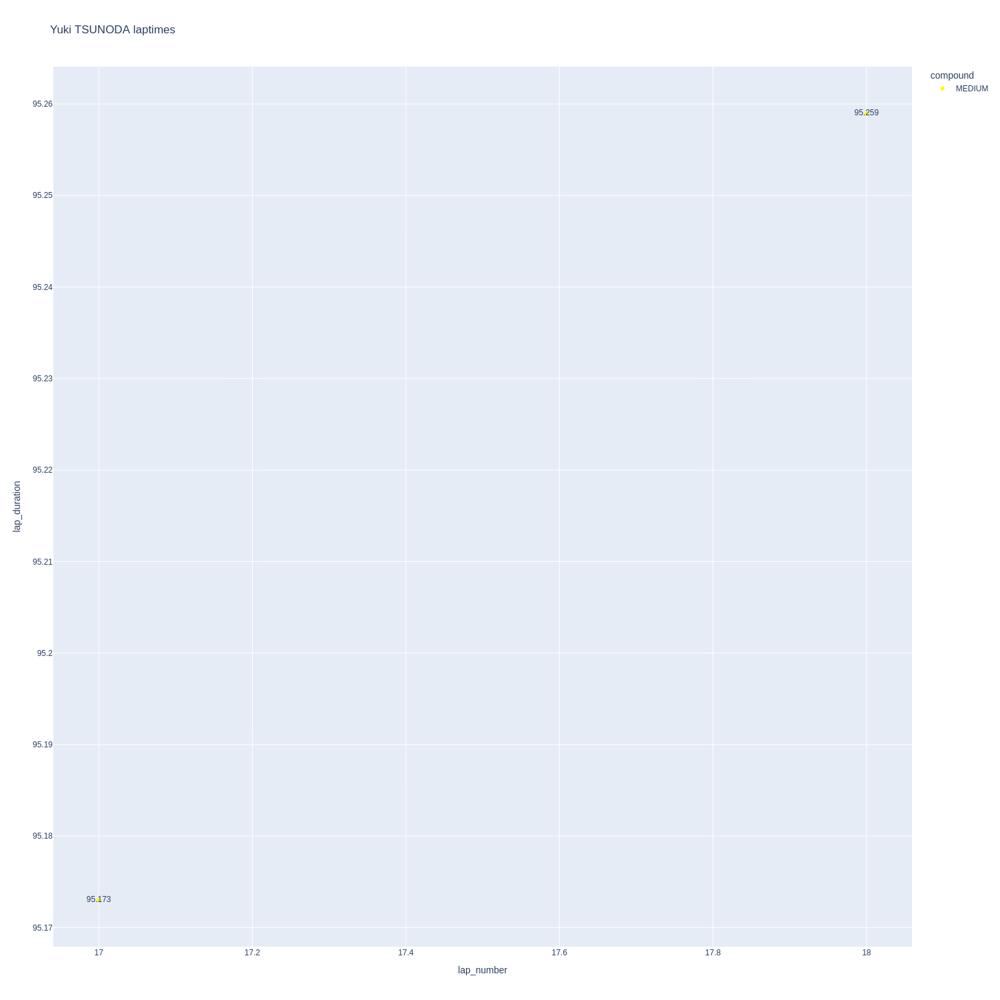

In [33]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

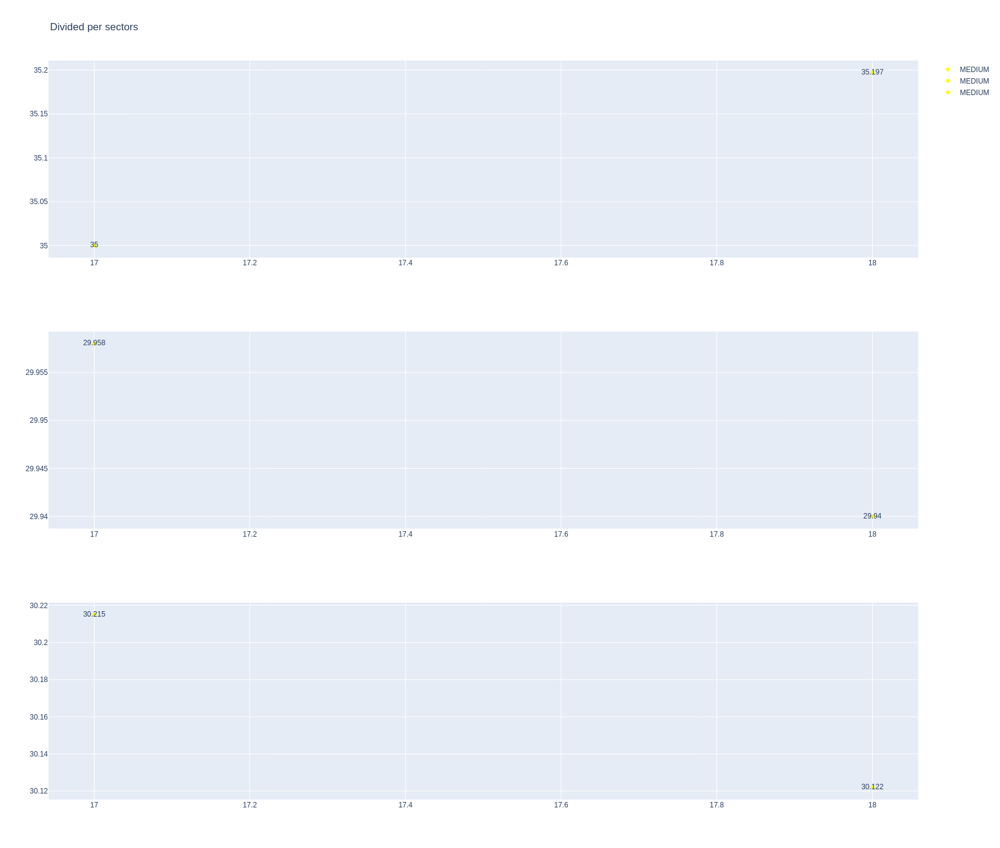

In [34]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [35]:
stintInformation.query('driver_number == 55 or driver_number == 44')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
16,1258,10016,1,55,1,9,MEDIUM,0.0
18,1258,10016,1,44,1,10,MEDIUM,0.0
41,1258,10016,2,55,10,13,SOFT,0.0
45,1258,10016,2,44,11,14,SOFT,0.0
58,1258,10016,3,55,14,15,SOFT,0.0
63,1258,10016,3,44,15,17,SOFT,4.0
75,1258,10016,4,55,16,22,MEDIUM,0.0
84,1258,10016,4,44,18,21,MEDIUM,0.0
96,1258,10016,5,44,22,22,MEDIUM,0.0
97,1258,10016,5,55,23,23,MEDIUM,15.0


In [36]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
307,Charles LECLERC,MEDIUM,2025-04-18T17:47:23.083000+00:00,17,34.852,29.88,30.037,94.769
322,Charles LECLERC,MEDIUM,2025-04-18T17:48:57.883000+00:00,18,34.614,29.97,30.077,94.661


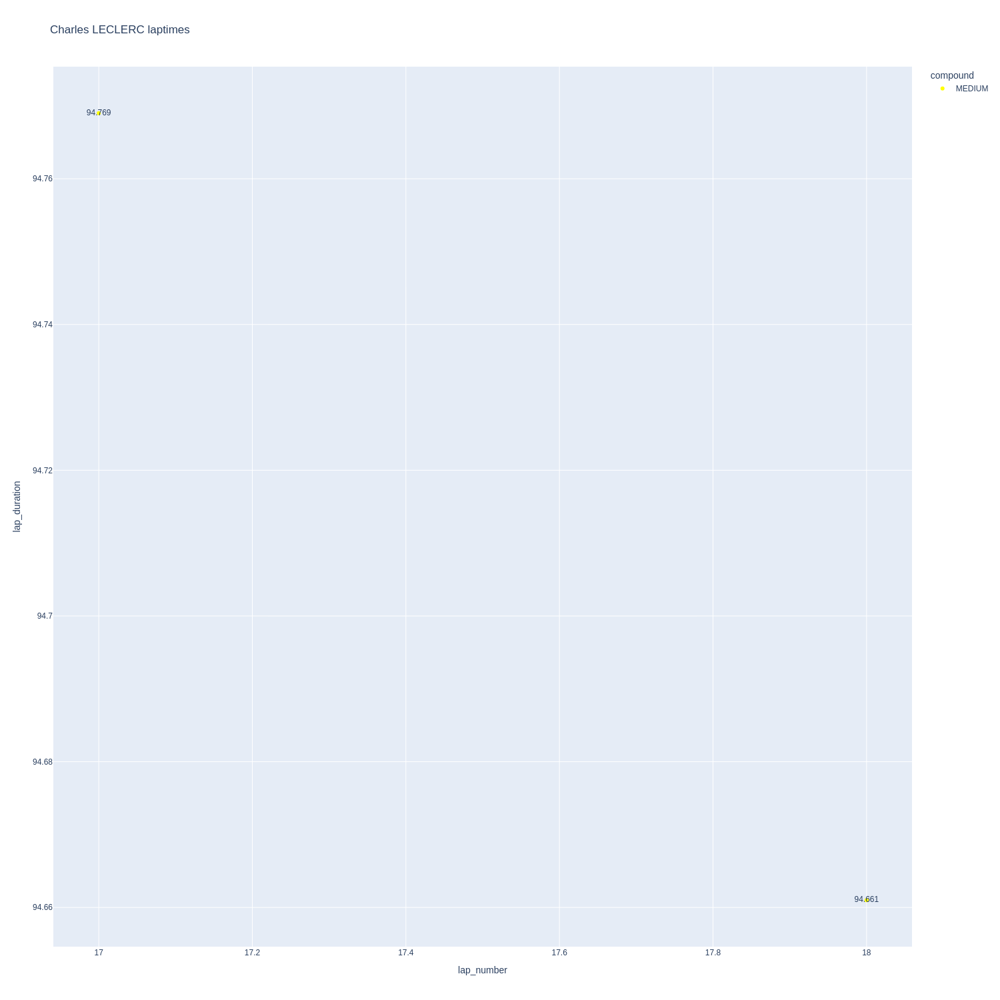

In [37]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

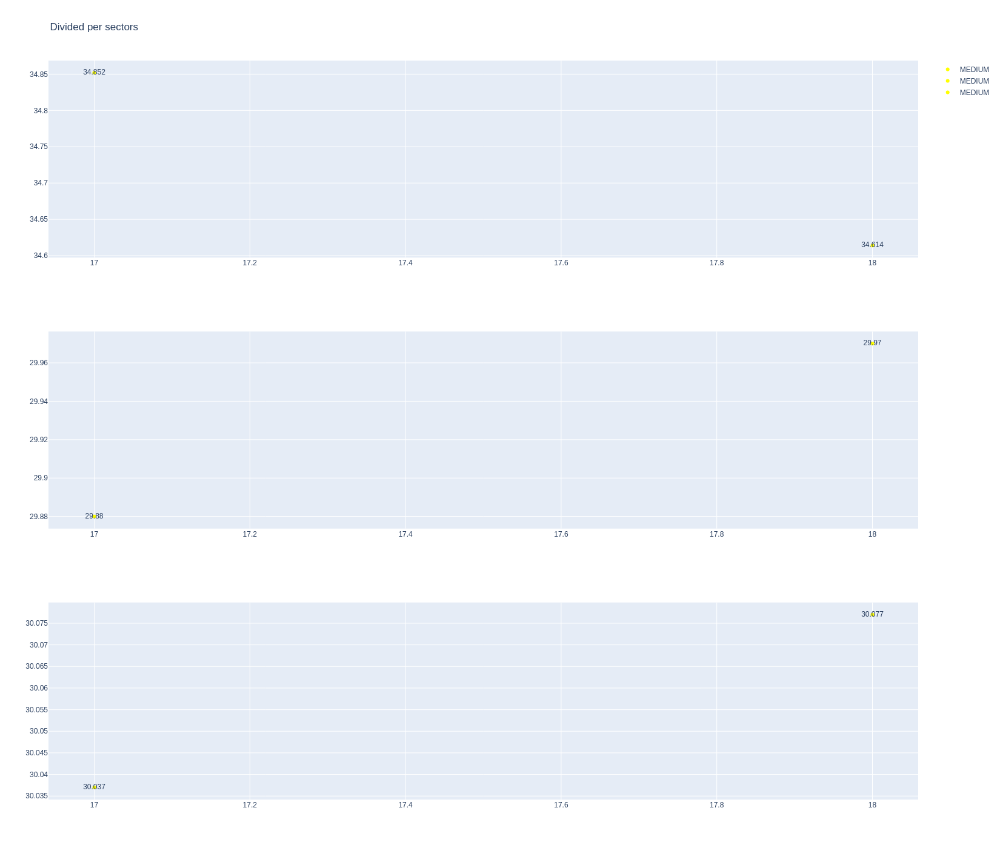

In [38]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [39]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
310,Lewis HAMILTON,MEDIUM,2025-04-18T17:47:44.916000+00:00,18,35.022,30.104,30.194,95.32
326,Lewis HAMILTON,MEDIUM,2025-04-18T17:49:20.195000+00:00,19,35.079,30.138,30.243,95.46


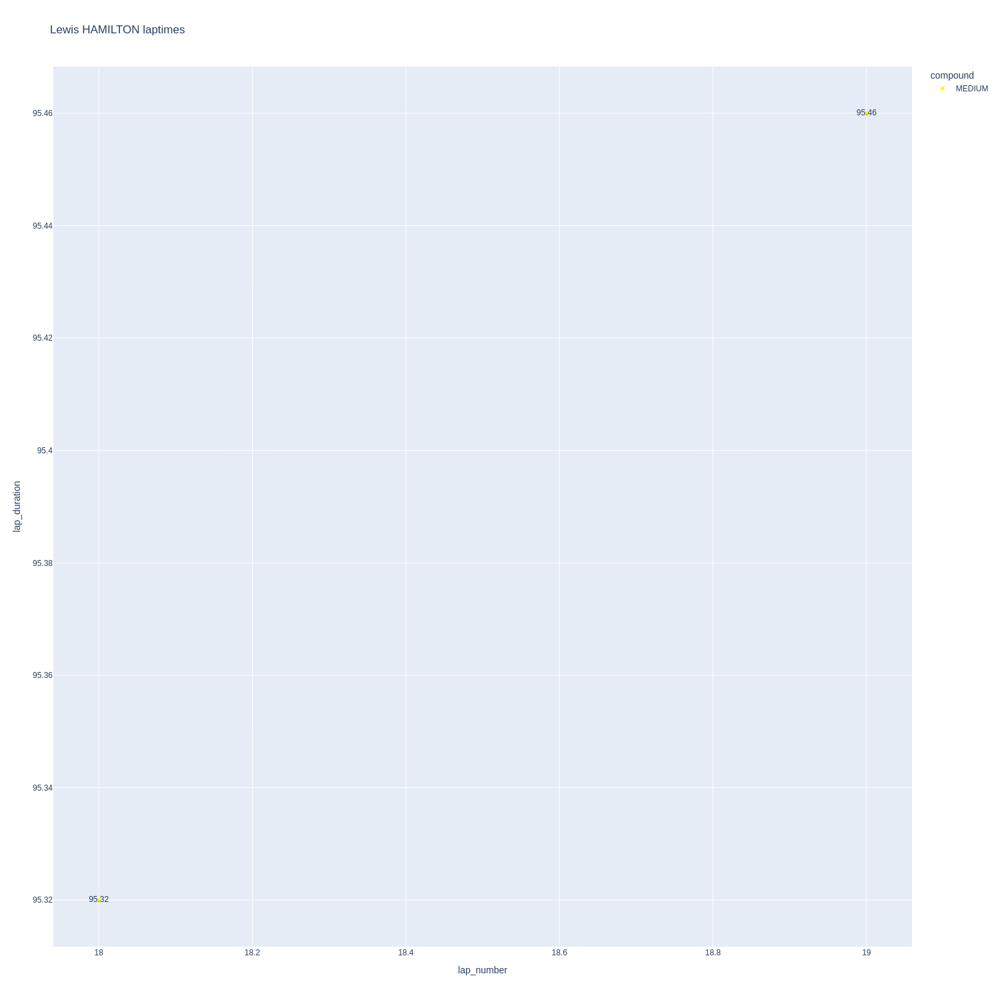

In [40]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

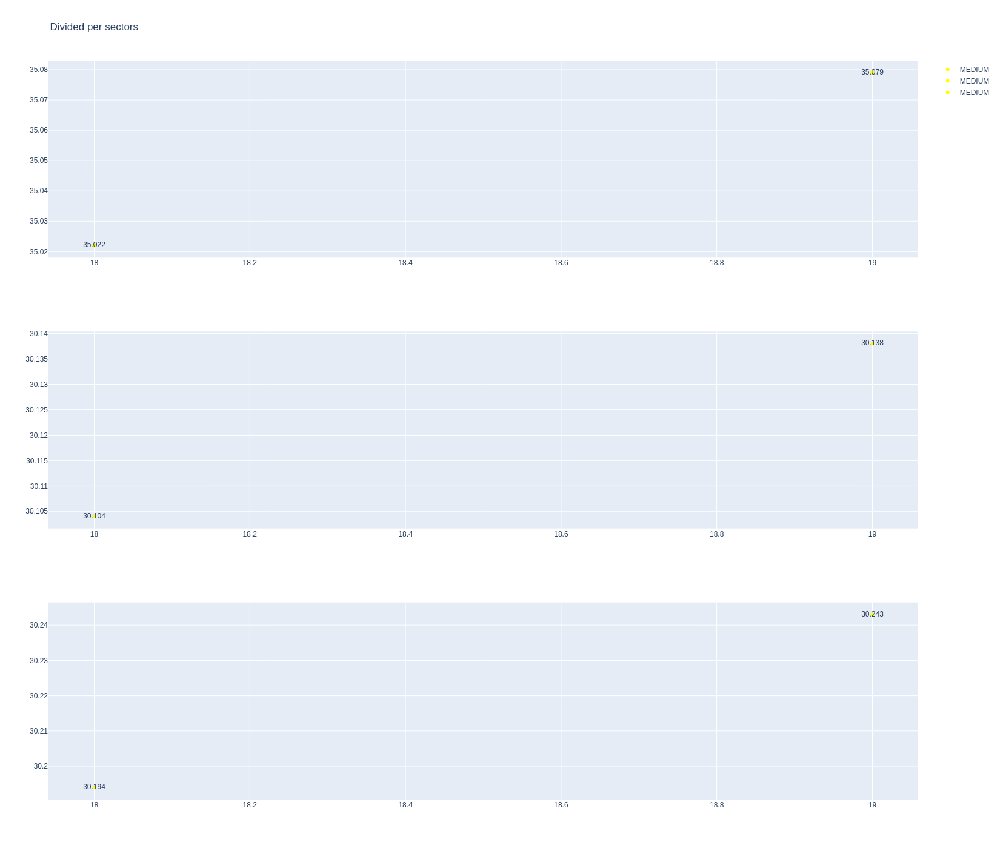

In [41]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [42]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
11,1258,10016,1,63,1,8,MEDIUM,0.0
19,1258,10016,1,12,1,11,MEDIUM,0.0
33,1258,10016,2,63,9,16,SOFT,0.0
48,1258,10016,2,12,12,15,SOFT,0.0
69,1258,10016,3,12,16,17,SOFT,4.0
80,1258,10016,3,63,17,20,MEDIUM,7.0
88,1258,10016,4,63,20,20,MEDIUM,10.0


In [112]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
24,George RUSSELL,MEDIUM,2025-04-18T17:02:44.370000+00:00,2,33.010,28.499,32.970,94.479
323,George RUSSELL,MEDIUM,2025-04-18T17:49:07.070000+00:00,17,34.724,29.890,30.194,94.808


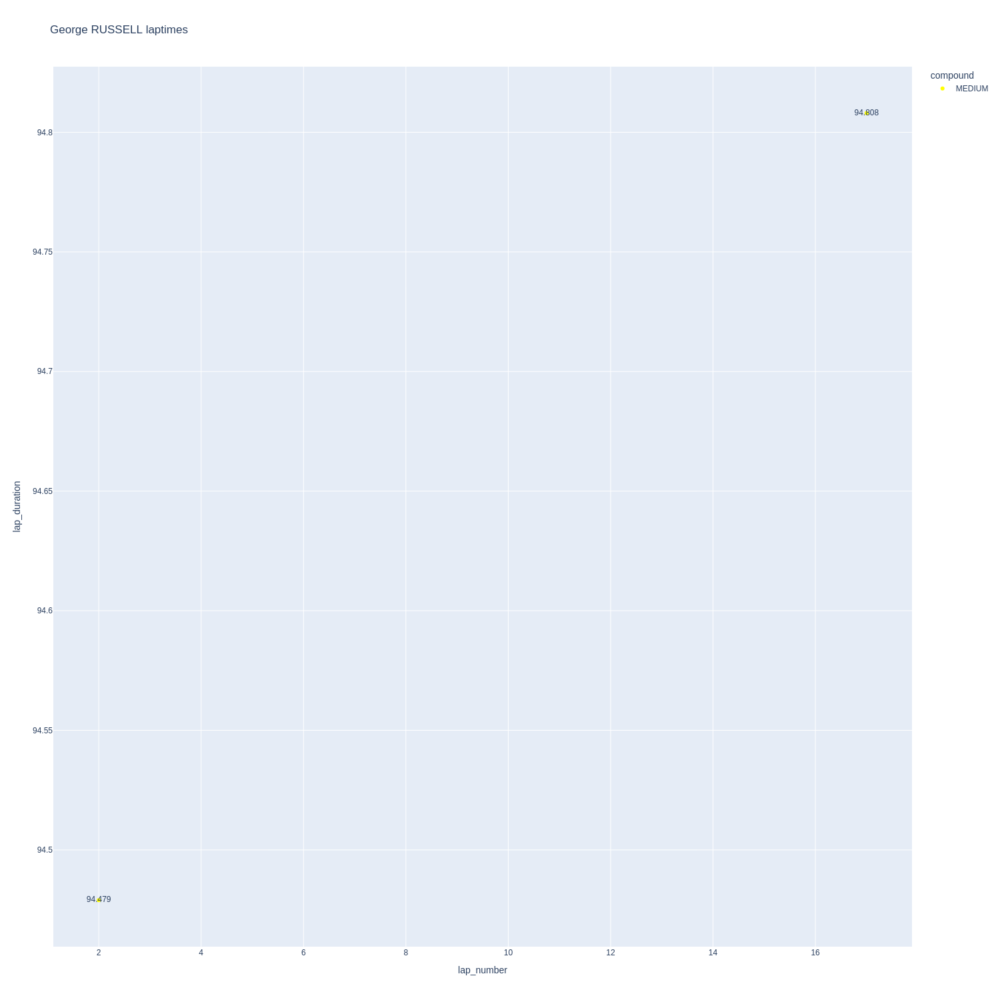

In [113]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

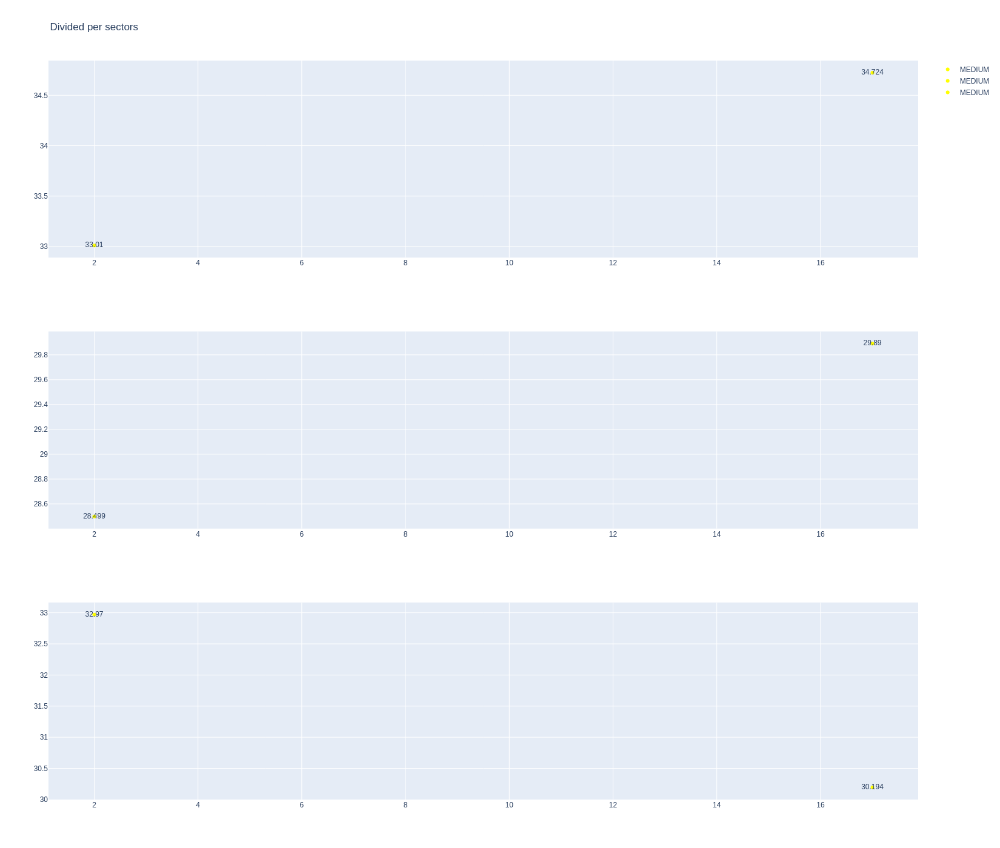

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [46]:
data = libraryDataF1.getinfolongruns(jointables2,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [47]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [48]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [49]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1258,10016,1,4,1,9,MEDIUM,0.0
17,1258,10016,1,81,1,9,MEDIUM,0.0
34,1258,10016,2,4,10,12,SOFT,0.0
37,1258,10016,2,81,10,12,SOFT,0.0
50,1258,10016,3,81,13,14,SOFT,0.0
51,1258,10016,3,4,13,15,SOFT,3.0
66,1258,10016,4,81,15,21,MEDIUM,0.0
72,1258,10016,4,4,16,19,SOFT,8.0
85,1258,10016,5,4,20,20,SOFT,0.0
93,1258,10016,5,81,21,21,SOFT,5.0


In [50]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
312,Lando NORRIS,SOFT,2025-04-18T17:47:58.510000+00:00,16,35.104,29.832,30.103,95.039


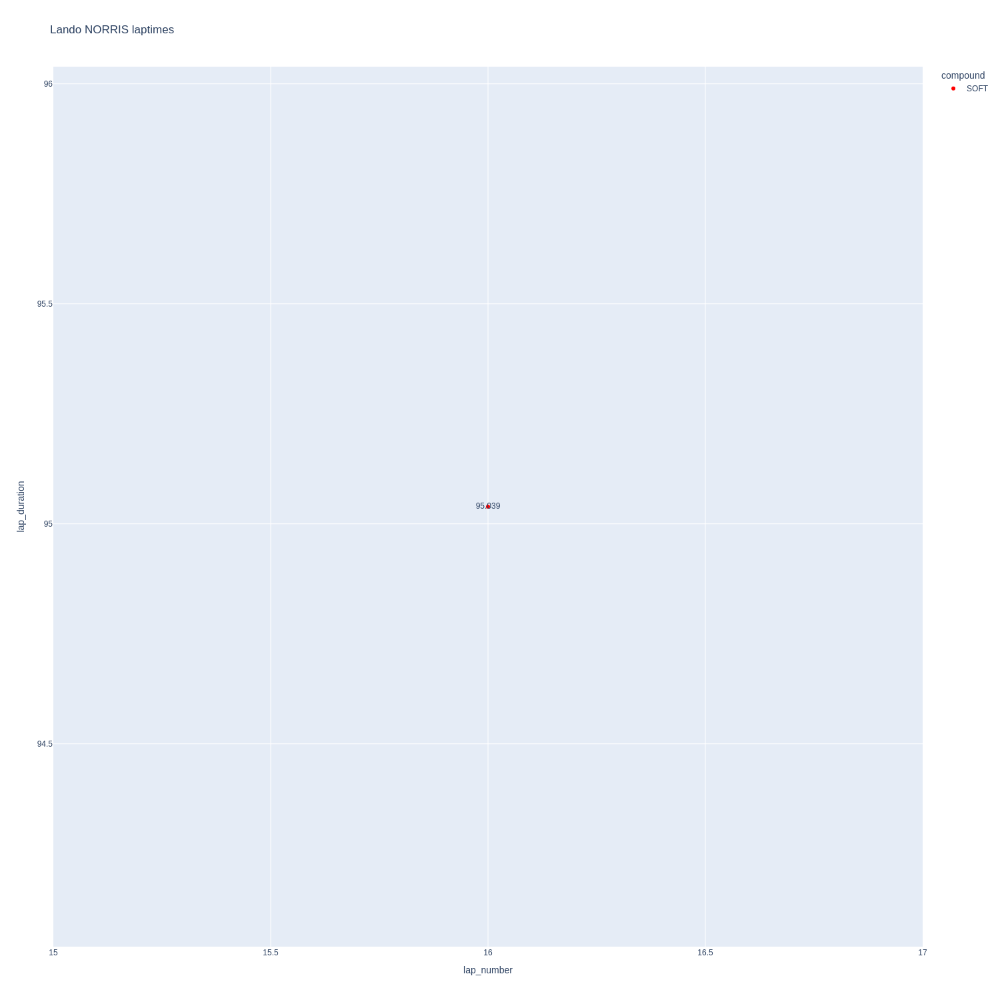

In [51]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

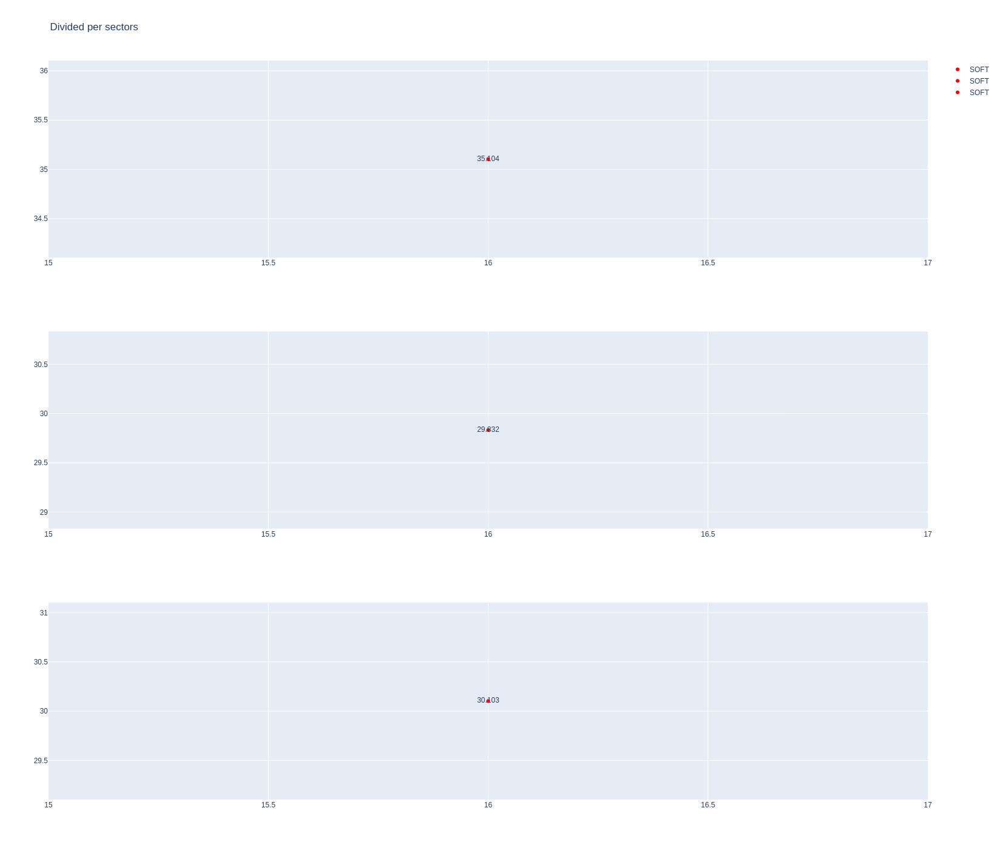

In [52]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [53]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
282,Oscar PIASTRI,MEDIUM,2025-04-18T17:44:09.284000+00:00,15,34.558,29.492,29.810,93.860
292,Oscar PIASTRI,MEDIUM,2025-04-18T17:45:43.079000+00:00,16,34.495,29.560,29.740,93.795
306,Oscar PIASTRI,MEDIUM,2025-04-18T17:47:16.823000+00:00,17,34.643,29.615,29.860,94.118
321,Oscar PIASTRI,MEDIUM,2025-04-18T17:48:51.005000+00:00,18,34.532,29.604,29.888,94.024


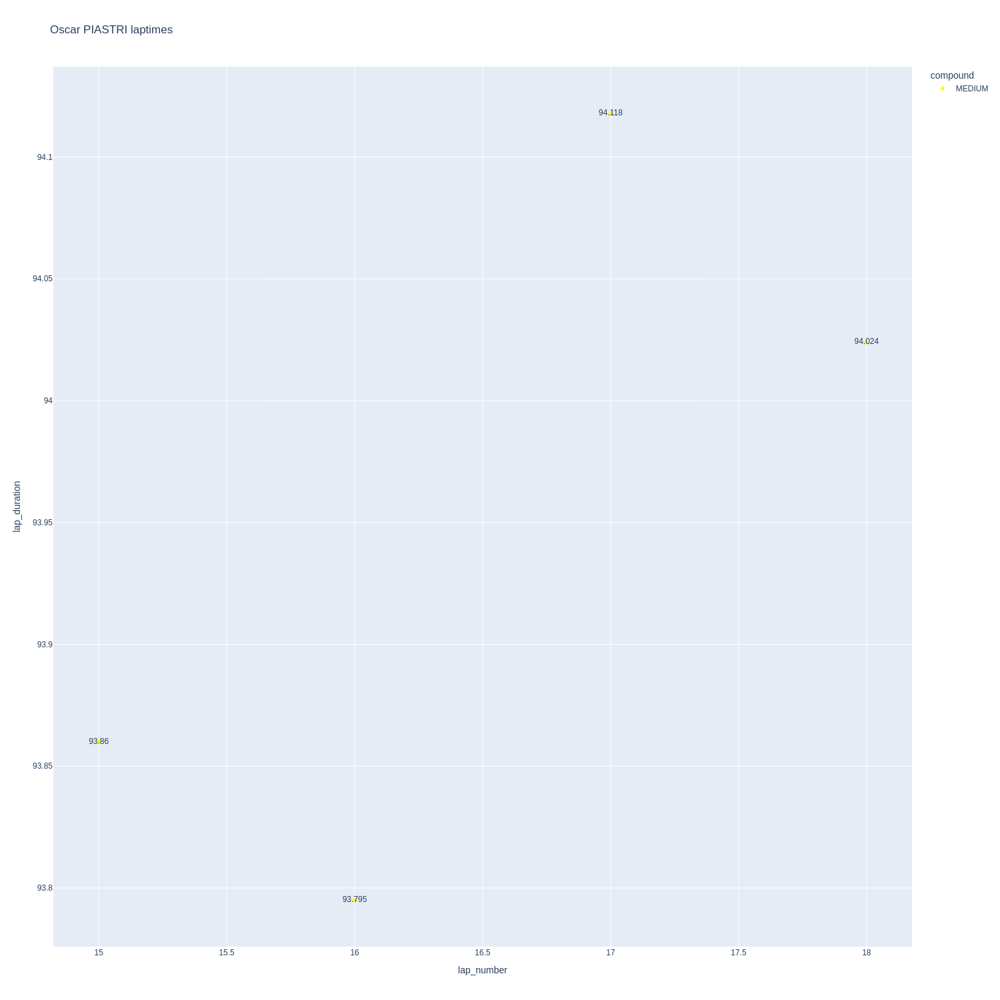

In [54]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

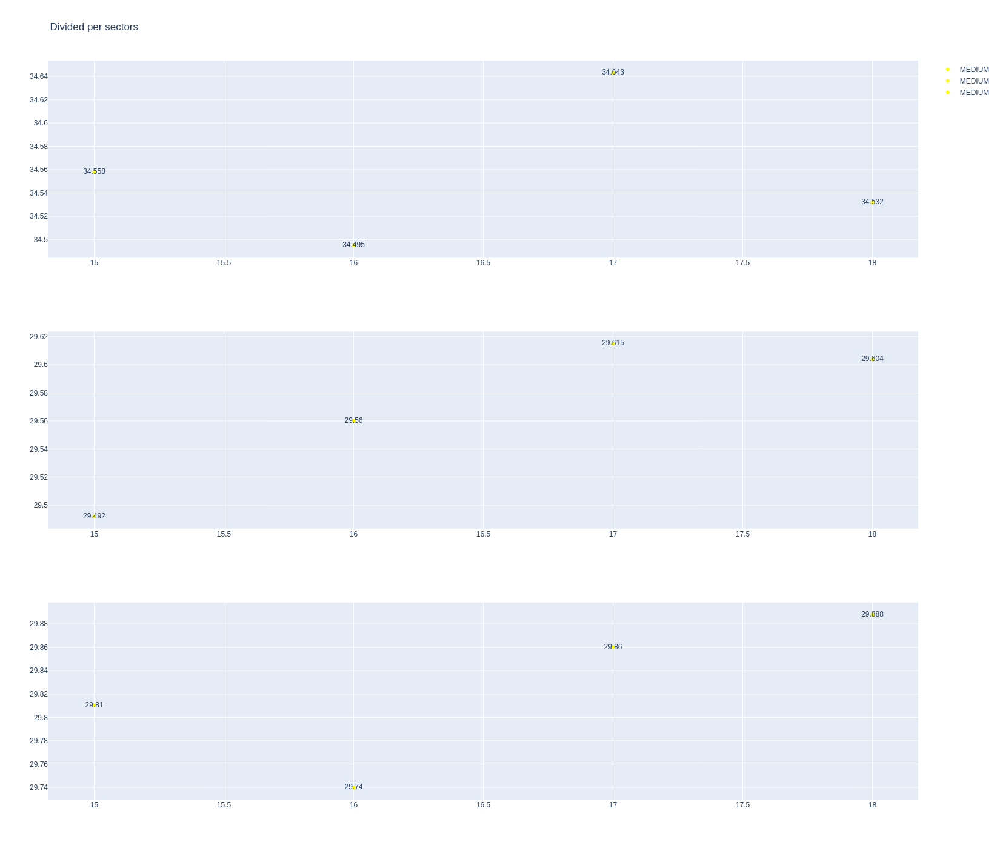

In [55]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [56]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1258,10016,1,18,1,5,MEDIUM,0.0
9,1258,10016,1,14,1,8,MEDIUM,0.0
22,1258,10016,2,18,6,8,SOFT,0.0
31,1258,10016,2,14,9,12,SOFT,0.0
32,1258,10016,3,18,9,12,SOFT,3.0
52,1258,10016,3,14,13,15,SOFT,7.0
53,1258,10016,4,18,13,15,SOFT,7.0
67,1258,10016,4,14,16,16,MEDIUM,7.0
68,1258,10016,5,18,16,16,SOFT,10.0
76,1258,10016,5,14,17,17,MEDIUM,0.0


In [57]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [58]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [59]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [60]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [61]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [62]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [63]:
stintInformation.query('driver_number == 30 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1258,10016,1,22,1,4,MEDIUM,0.0
6,1258,10016,1,30,1,6,MEDIUM,0.0
20,1258,10016,2,22,5,7,MEDIUM,3.0
25,1258,10016,2,30,7,9,SOFT,0.0
27,1258,10016,3,22,8,10,MEDIUM,6.0
35,1258,10016,3,30,10,12,SOFT,3.0
44,1258,10016,4,22,11,14,SOFT,0.0
56,1258,10016,4,30,13,16,SOFT,0.0
61,1258,10016,5,22,15,16,SOFT,4.0
78,1258,10016,6,22,17,20,MEDIUM,0.0


In [64]:
data = libraryDataF1.getinfolongruns(jointables2,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [65]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [66]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [67]:
data = libraryDataF1.getinfolongruns(jointables2,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
315,Isack HADJAR,MEDIUM,2025-04-18T17:48:07.979000+00:00,16,35.434,30.104,30.281,95.819


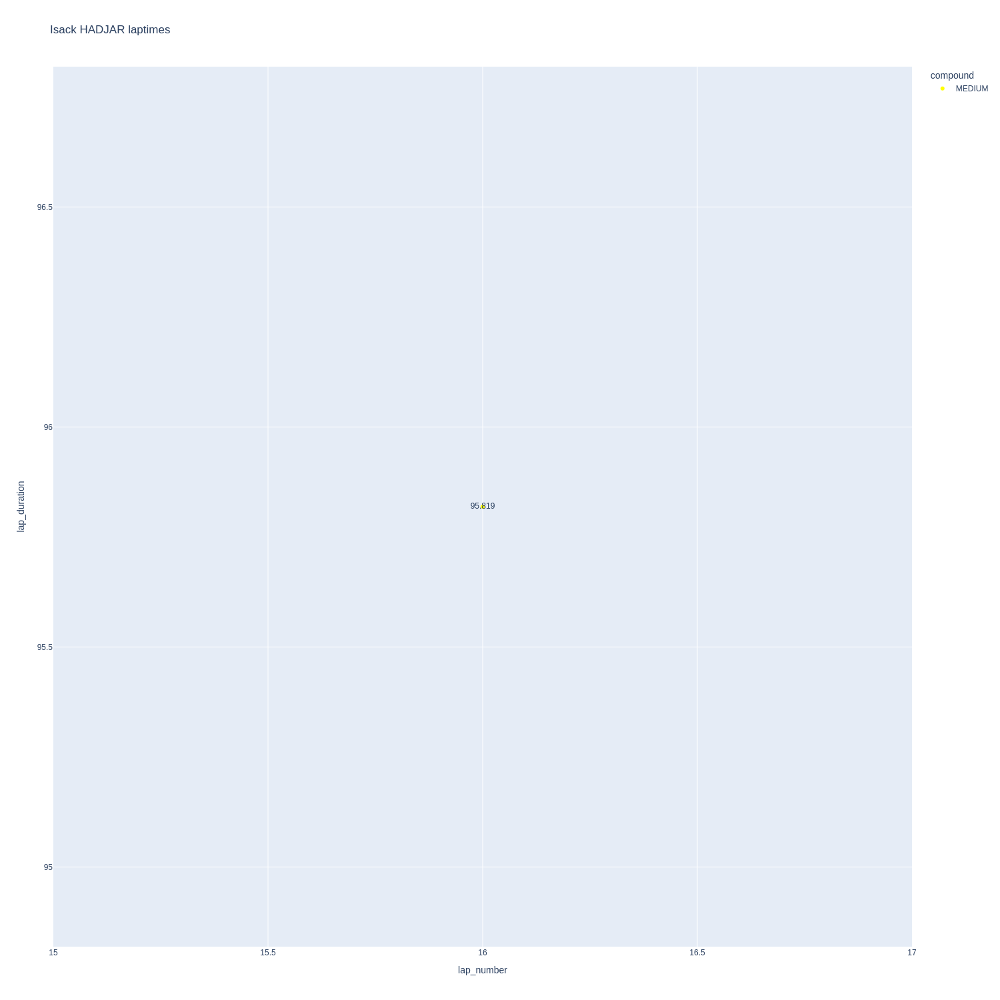

In [68]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

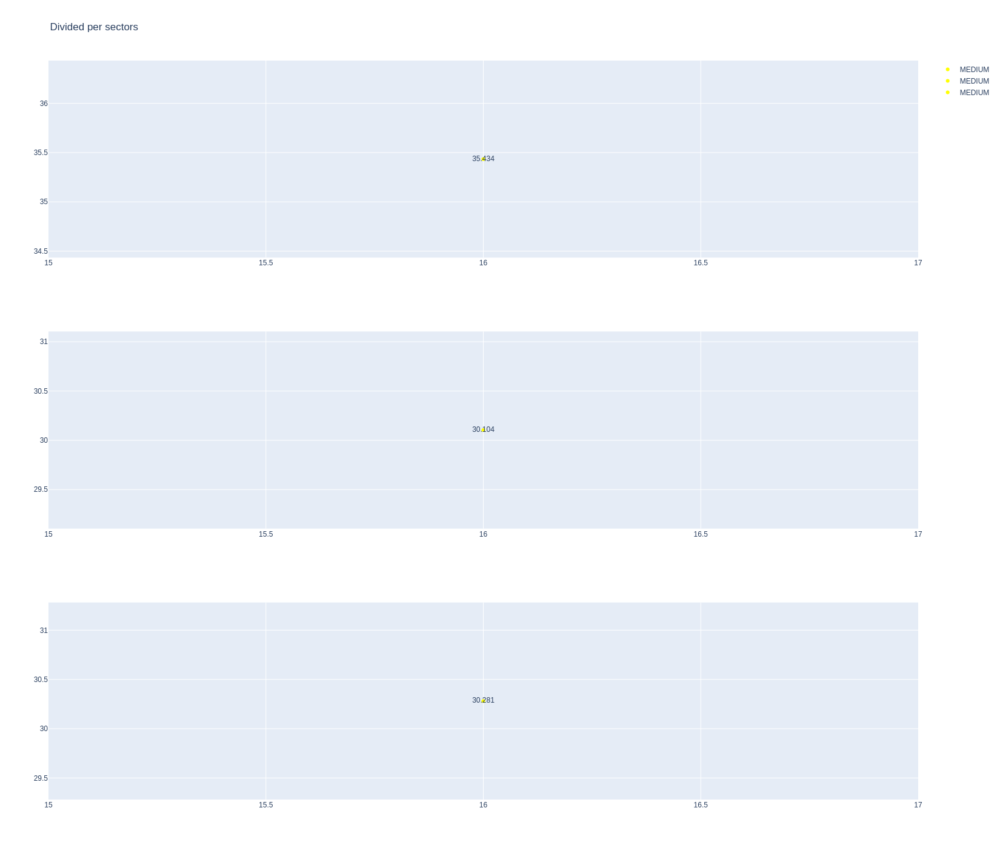

In [69]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [70]:
stintInformation.query('driver_number == 87 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1258,10016,1,87,1,6,MEDIUM,0.0
15,1258,10016,1,31,1,9,MEDIUM,0.0
26,1258,10016,2,87,7,9,MEDIUM,5.0
36,1258,10016,2,31,10,12,SOFT,0.0
38,1258,10016,3,87,10,12,SOFT,0.0
54,1258,10016,3,31,13,15,SOFT,3.0
55,1258,10016,4,87,13,15,SOFT,3.0
70,1258,10016,5,87,16,17,MEDIUM,8.0
74,1258,10016,4,31,16,21,SOFT,6.0
83,1258,10016,6,87,18,18,MEDIUM,10.0


In [71]:
data = libraryDataF1.getinfolongruns(jointables2,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [72]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [73]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [74]:
data = libraryDataF1.getinfolongruns(jointables2,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
288,Esteban OCON,SOFT,2025-04-18T17:45:25.709000+00:00,16,34.829,30.173,30.248,95.250
301,Esteban OCON,SOFT,2025-04-18T17:47:00.985000+00:00,17,35.158,30.076,30.344,95.578
317,Esteban OCON,SOFT,2025-04-18T17:48:36.443000+00:00,18,35.298,30.241,30.306,95.845


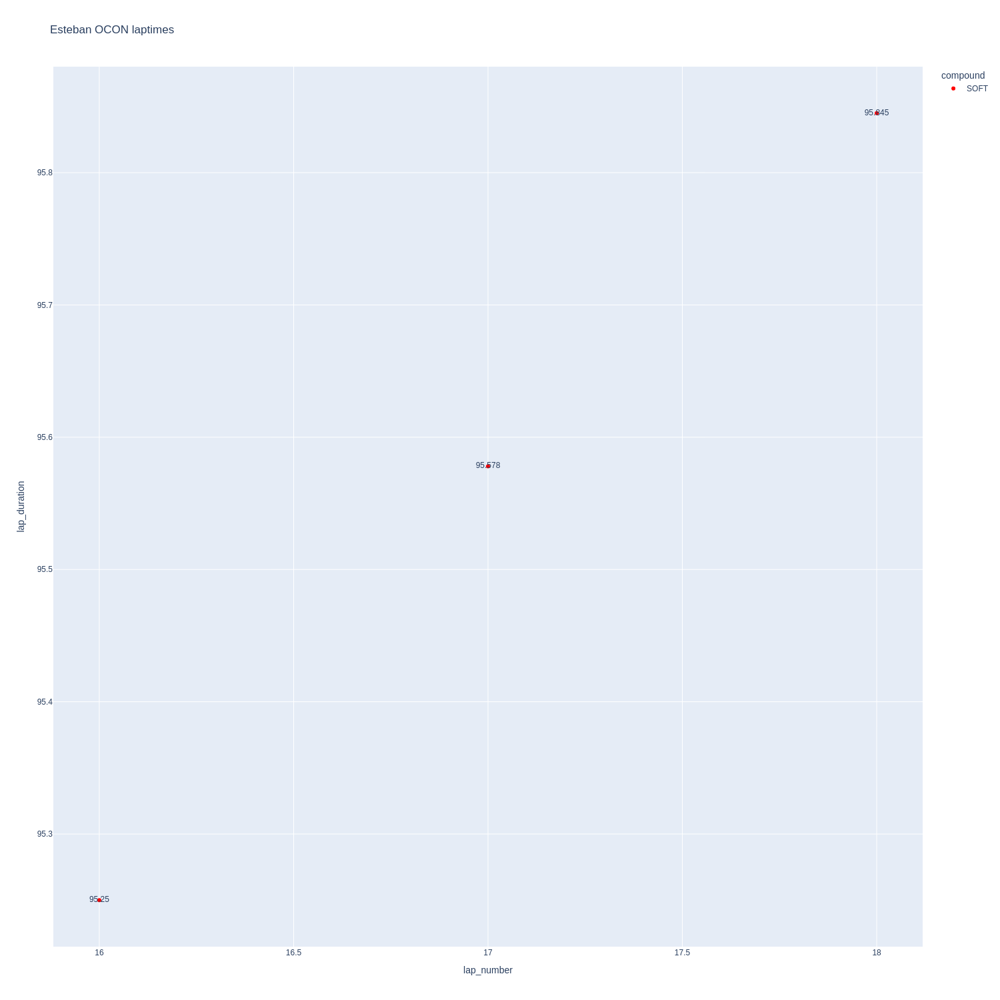

In [75]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

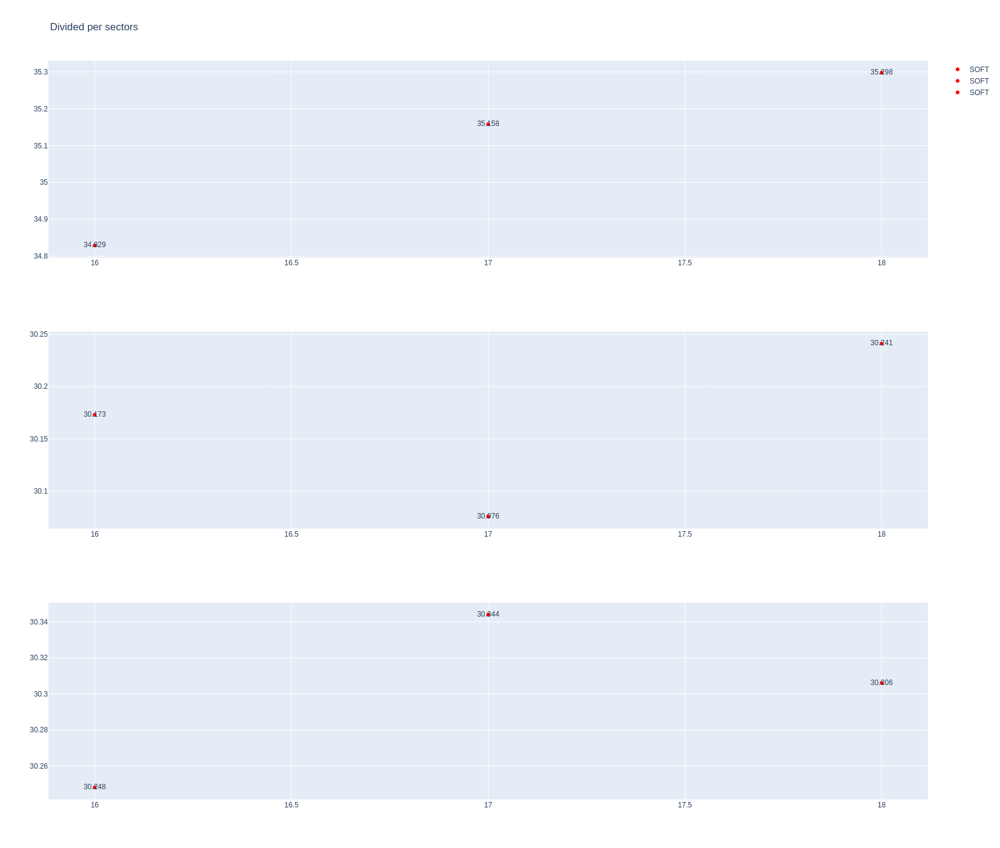

In [76]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [77]:
stintInformation.query('driver_number == 10 or driver_number == 7')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1258,10016,1,7,1,6,MEDIUM,0.0
13,1258,10016,1,10,1,9,MEDIUM,0.0
24,1258,10016,2,7,7,9,MEDIUM,5.0
39,1258,10016,2,10,10,13,SOFT,0.0
42,1258,10016,3,7,10,14,SOFT,0.0
57,1258,10016,3,10,14,15,SOFT,4.0
64,1258,10016,4,7,15,19,MEDIUM,8.0
73,1258,10016,4,10,16,21,MEDIUM,8.0
86,1258,10016,5,7,20,20,MEDIUM,0.0
89,1258,10016,5,10,21,21,MEDIUM,13.0


In [78]:
data =libraryDataF1.getinfolongruns(jointables2,7,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
295,Jack DOOHAN,MEDIUM,2025-04-18T17:46:03.898000+00:00,15,35.060,30.133,30.098,95.291
309,Jack DOOHAN,MEDIUM,2025-04-18T17:47:39.188000+00:00,16,34.974,29.892,30.204,95.070
325,Jack DOOHAN,MEDIUM,2025-04-18T17:49:14.398000+00:00,17,35.209,29.913,30.387,95.509


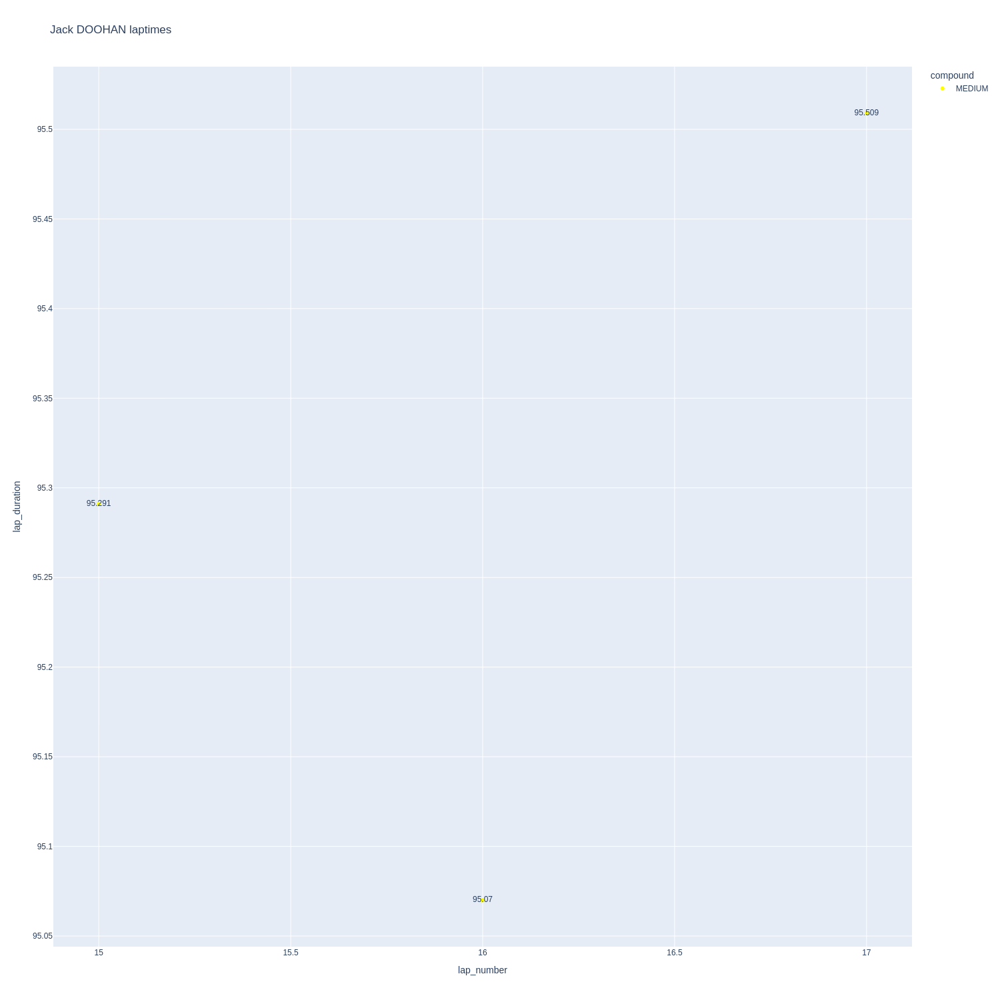

In [79]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

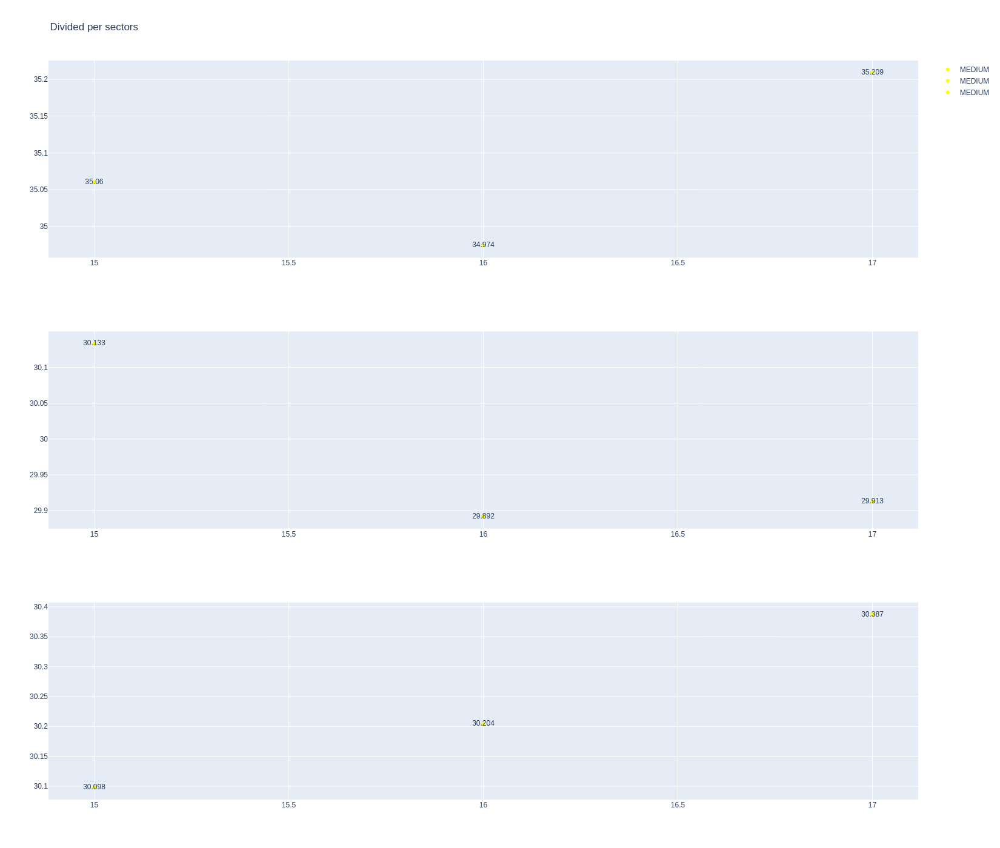

In [80]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [81]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
286,Pierre GASLY,MEDIUM,2025-04-18T17:45:19.504000+00:00,16,34.794,29.743,29.810,94.347
300,Pierre GASLY,MEDIUM,2025-04-18T17:46:53.766000+00:00,17,34.783,29.813,29.864,94.460
316,Pierre GASLY,MEDIUM,2025-04-18T17:48:28.271000+00:00,18,35.026,29.910,29.875,94.811


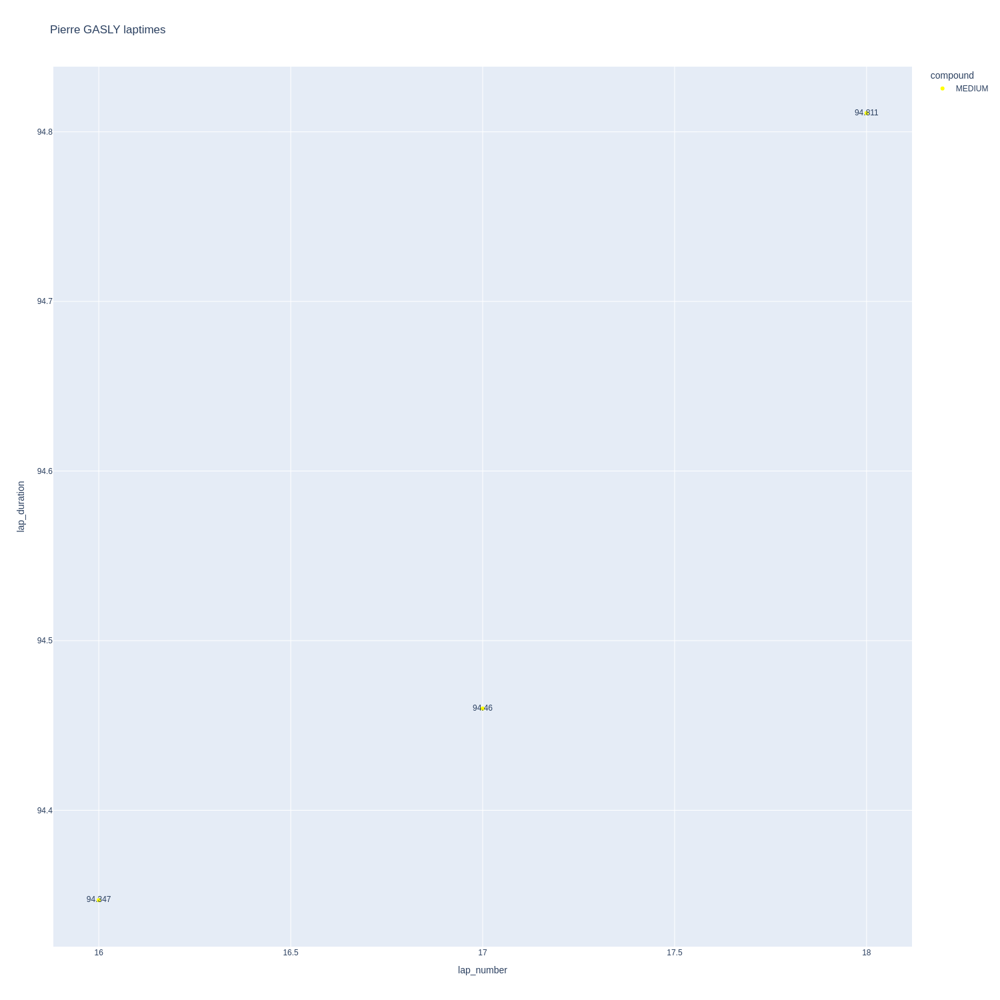

In [82]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

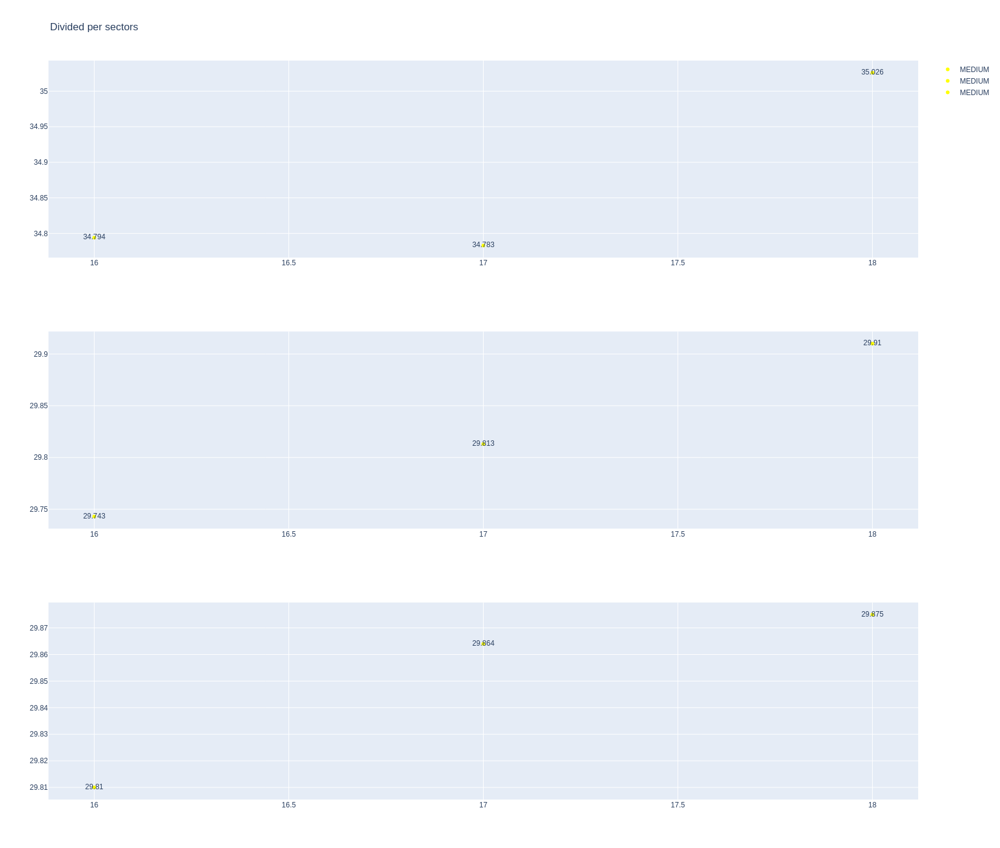

In [83]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [84]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
14,1258,10016,1,23,1,9,HARD,0.0
16,1258,10016,1,55,1,9,MEDIUM,0.0
41,1258,10016,2,55,10,13,SOFT,0.0
43,1258,10016,2,23,10,14,SOFT,0.0
58,1258,10016,3,55,14,15,SOFT,0.0
62,1258,10016,3,23,15,16,SOFT,0.0
75,1258,10016,4,55,16,22,MEDIUM,0.0
82,1258,10016,4,23,17,21,HARD,8.0
95,1258,10016,5,23,22,22,HARD,0.0
97,1258,10016,5,55,23,23,MEDIUM,15.0


In [85]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
285,Alexander ALBON,HARD,2025-04-18T17:44:52.828000+00:00,17,35.019,29.709,29.906,94.634
299,Alexander ALBON,HARD,2025-04-18T17:46:27.425000+00:00,18,34.996,29.873,30.129,94.998
314,Alexander ALBON,HARD,2025-04-18T17:48:02.401000+00:00,19,35.127,30.117,30.034,95.278


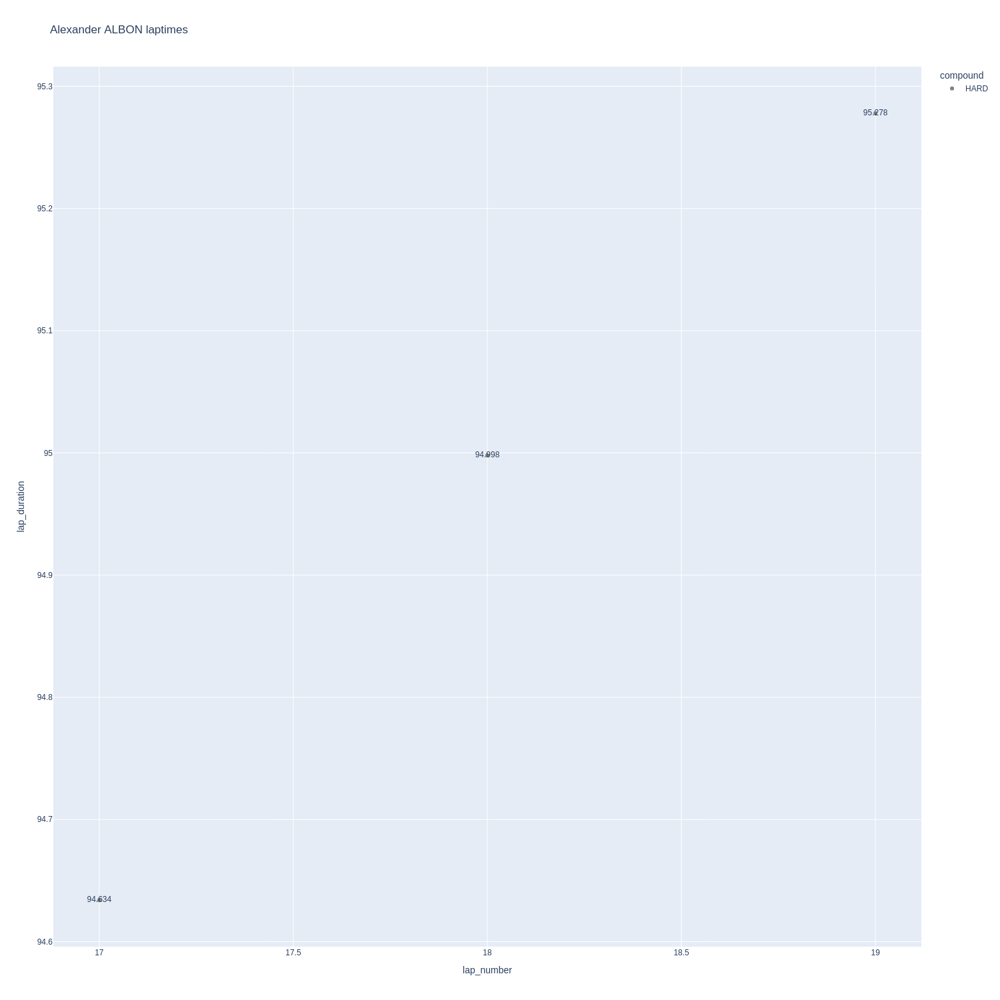

In [86]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

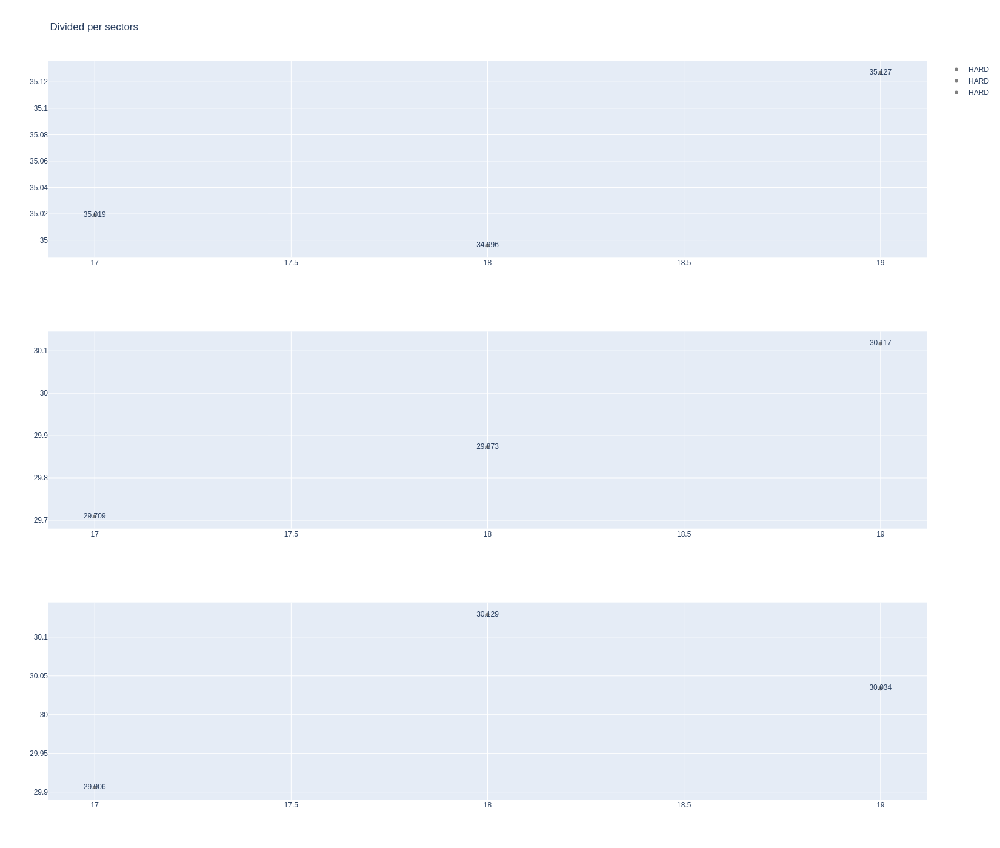

In [87]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [88]:
data= libraryDataF1.getinfolongruns(jointables2,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
274,Carlos SAINZ,MEDIUM,2025-04-18T17:42:23.942000+00:00,16,34.848,29.658,29.928,94.434
281,Carlos SAINZ,MEDIUM,2025-04-18T17:43:58.393000+00:00,17,35.105,29.914,30.115,95.134
290,Carlos SAINZ,MEDIUM,2025-04-18T17:45:33.542000+00:00,18,35.392,29.900,30.044,95.336
303,Carlos SAINZ,MEDIUM,2025-04-18T17:47:08.829000+00:00,19,35.568,30.145,30.130,95.843
319,Carlos SAINZ,MEDIUM,2025-04-18T17:48:44.708000+00:00,20,35.468,30.029,30.159,95.656


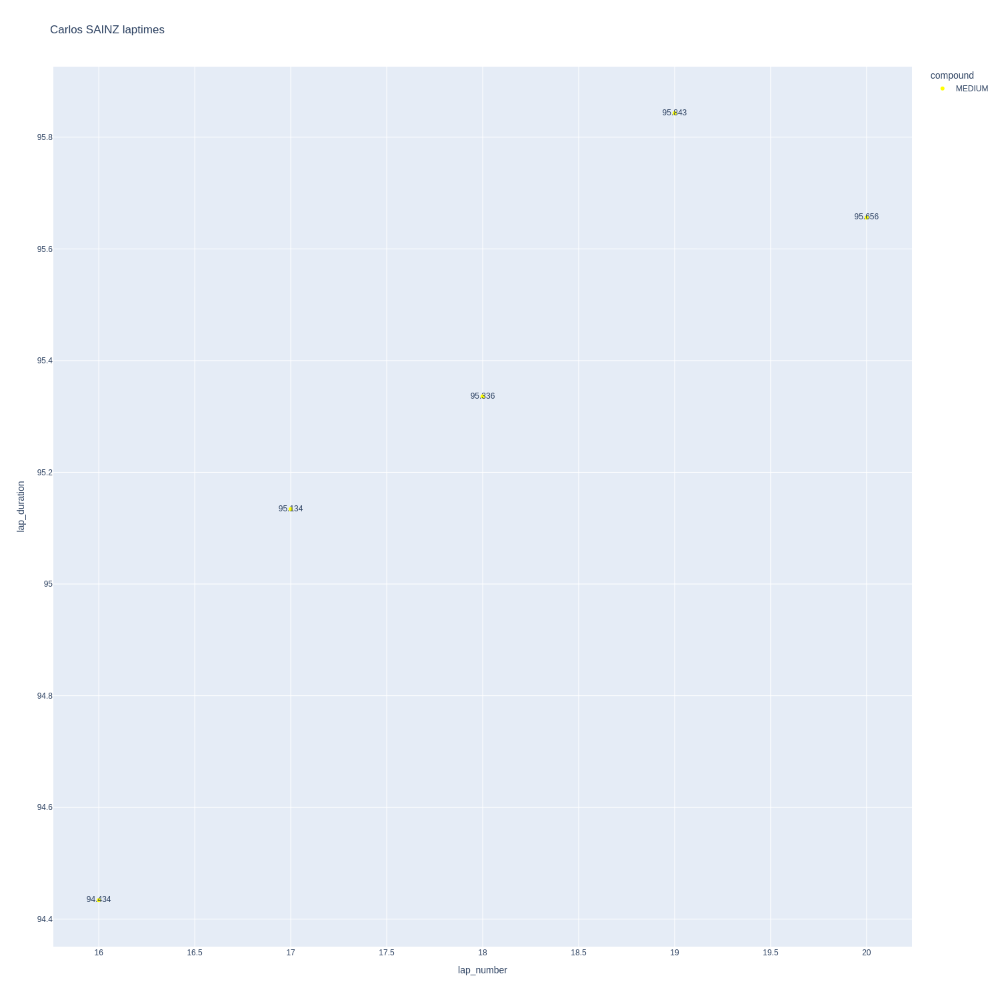

In [89]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

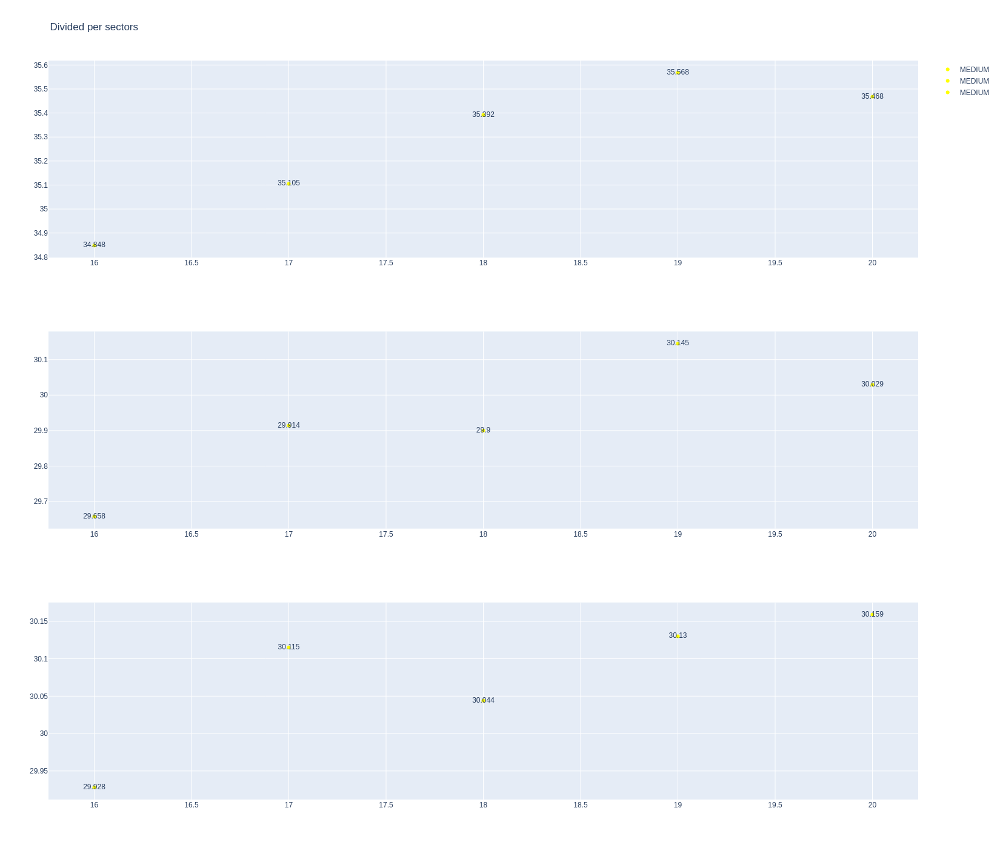

In [90]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [91]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1258,10016,1,5,1,1,None,NaN
10,1258,10016,1,27,1,8,MEDIUM,0.0
30,1258,10016,2,27,9,11,SOFT,0.0
47,1258,10016,3,27,12,14,SOFT,0.0
65,1258,10016,4,27,15,19,MEDIUM,7.0
87,1258,10016,5,27,20,20,SOFT,6.0


In [92]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
291,Nico HULKENBERG,MEDIUM,2025-04-18T17:45:36.588000+00:00,15,34.972,29.848,30.064,94.884
305,Nico HULKENBERG,MEDIUM,2025-04-18T17:47:11.422000+00:00,16,34.990,29.973,30.057,95.020
320,Nico HULKENBERG,MEDIUM,2025-04-18T17:48:46.365000+00:00,17,35.295,30.160,30.196,95.651


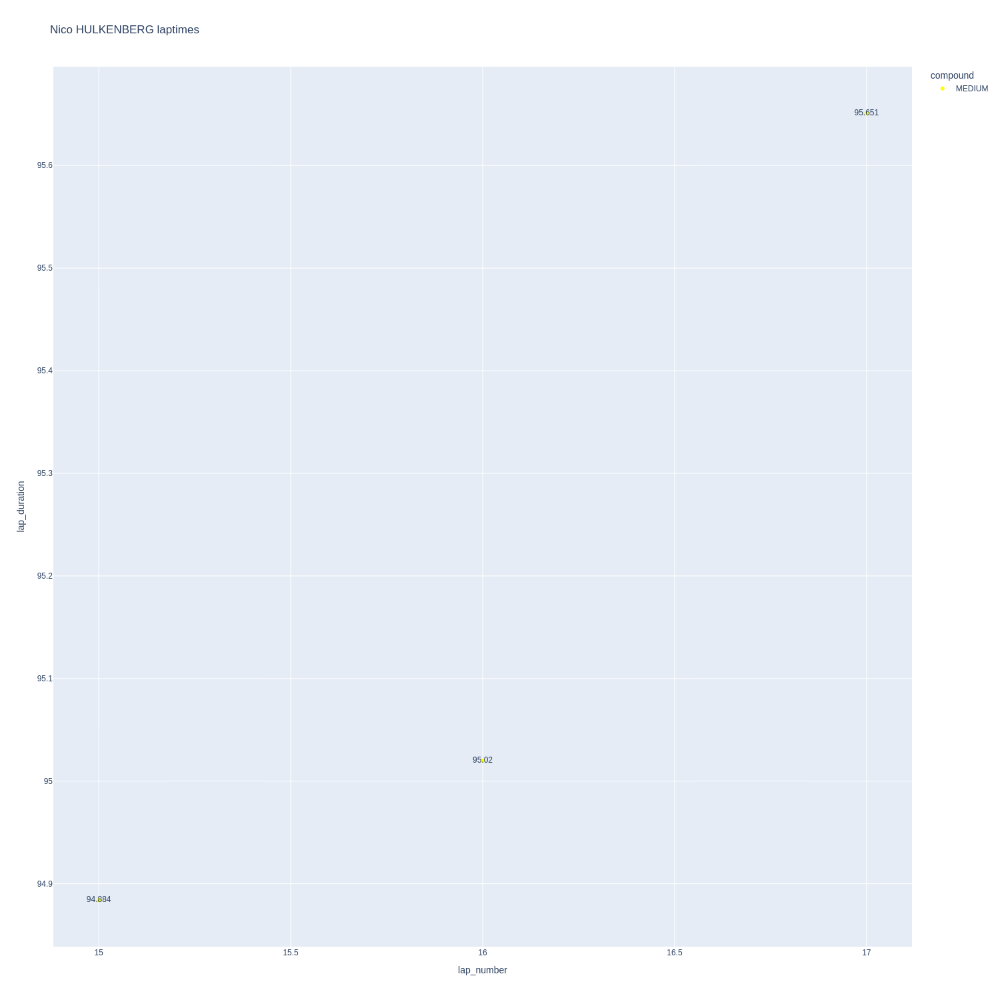

In [93]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

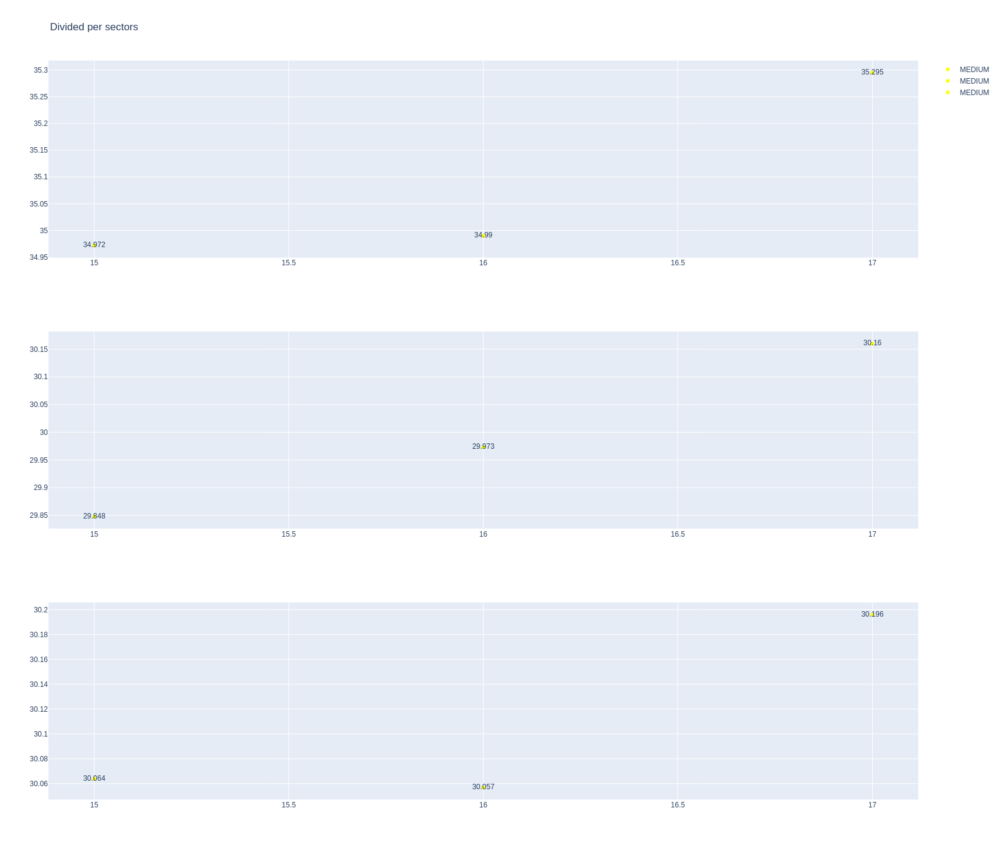

In [94]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [95]:
data = libraryDataF1.getinfolongruns(jointables2,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [96]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [97]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [98]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration

In [99]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [100]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
13,Oscar PIASTRI,MEDIUM,93.949250,34.557000,29.567750,29.824500
4,Pierre GASLY,MEDIUM,94.539333,34.867667,29.822000,29.849667
12,George RUSSELL,MEDIUM,94.643500,33.867000,29.194500,31.582000
5,Charles LECLERC,MEDIUM,94.715000,34.733000,29.925000,30.057000
7,Alexander ALBON,HARD,94.970000,35.047333,29.899667,30.023000
1,Lando NORRIS,SOFT,95.039000,35.104000,29.832000,30.103000
0,Max VERSTAPPEN,MEDIUM,95.046000,35.021143,29.908857,30.116000
8,Nico HULKENBERG,MEDIUM,95.185000,35.085667,29.993667,30.105667
6,Yuki TSUNODA,MEDIUM,95.216000,35.098500,29.949000,30.168500
11,Carlos SAINZ,MEDIUM,95.280600,35.276200,29.929200,30.075200


##### Sorted by sector 1

In [101]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
12,George RUSSELL,MEDIUM,33.867000
13,Oscar PIASTRI,MEDIUM,34.557000
5,Charles LECLERC,MEDIUM,34.733000
4,Pierre GASLY,MEDIUM,34.867667
0,Max VERSTAPPEN,MEDIUM,35.021143
7,Alexander ALBON,HARD,35.047333
10,Lewis HAMILTON,MEDIUM,35.050500
3,Jack DOOHAN,MEDIUM,35.081000
8,Nico HULKENBERG,MEDIUM,35.085667
9,Esteban OCON,SOFT,35.095000


##### Sorted by sector 2

In [102]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
12,George RUSSELL,MEDIUM,29.194500
13,Oscar PIASTRI,MEDIUM,29.567750
4,Pierre GASLY,MEDIUM,29.822000
1,Lando NORRIS,SOFT,29.832000
7,Alexander ALBON,HARD,29.899667
0,Max VERSTAPPEN,MEDIUM,29.908857
5,Charles LECLERC,MEDIUM,29.925000
11,Carlos SAINZ,MEDIUM,29.929200
6,Yuki TSUNODA,MEDIUM,29.949000
3,Jack DOOHAN,MEDIUM,29.979333


##### Sorted by sector 3

In [103]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
13,Oscar PIASTRI,MEDIUM,29.824500
4,Pierre GASLY,MEDIUM,29.849667
7,Alexander ALBON,HARD,30.023000
5,Charles LECLERC,MEDIUM,30.057000
11,Carlos SAINZ,MEDIUM,30.075200
1,Lando NORRIS,SOFT,30.103000
8,Nico HULKENBERG,MEDIUM,30.105667
0,Max VERSTAPPEN,MEDIUM,30.116000
6,Yuki TSUNODA,MEDIUM,30.168500
10,Lewis HAMILTON,MEDIUM,30.218500


#### Long runs mean

In [104]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [105]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
13,O PIASTRI,93.949
4,P GASLY,94.539
12,G RUSSELL,94.644
5,C LECLERC,94.715
0,M VERSTAPPEN,95.046
8,N HULKENBERG,95.185
6,Y TSUNODA,95.216
11,C SAINZ,95.281
3,J DOOHAN,95.290
10,L HAMILTON,95.390


In [106]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
1,L NORRIS,95.039
9,E OCON,95.558


In [107]:
libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
7,A ALBON,94.97


## Free Practice 3
### Obtain setup

In [3]:
practice = libraryDataF1.obtain_information('laps',session_key=10017)
stintInformation = libraryDataF1.obtain_information('stints',session_key=10017)
drivers = libraryDataF1.obtain_information('drivers',session_key=10017)

In [4]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [5]:
session = ff1.get_session(2025, 5, 'FP3')
session.load();

req         WARNING 	DEFAULT CACHE ENABLED! (3.72 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Saudi Arabian Grand Prix - Practice 3 [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '5', '6', '7', '

### Speed trap
Sauber and Aston are centered on the straights and McLaren centered on turns.

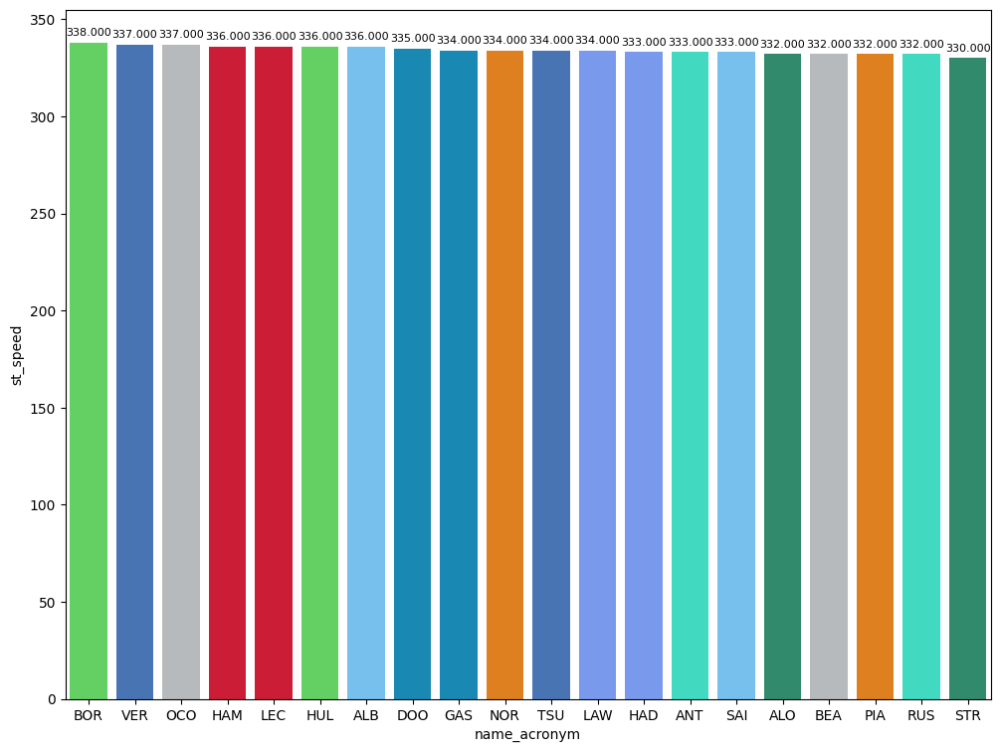

In [6]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

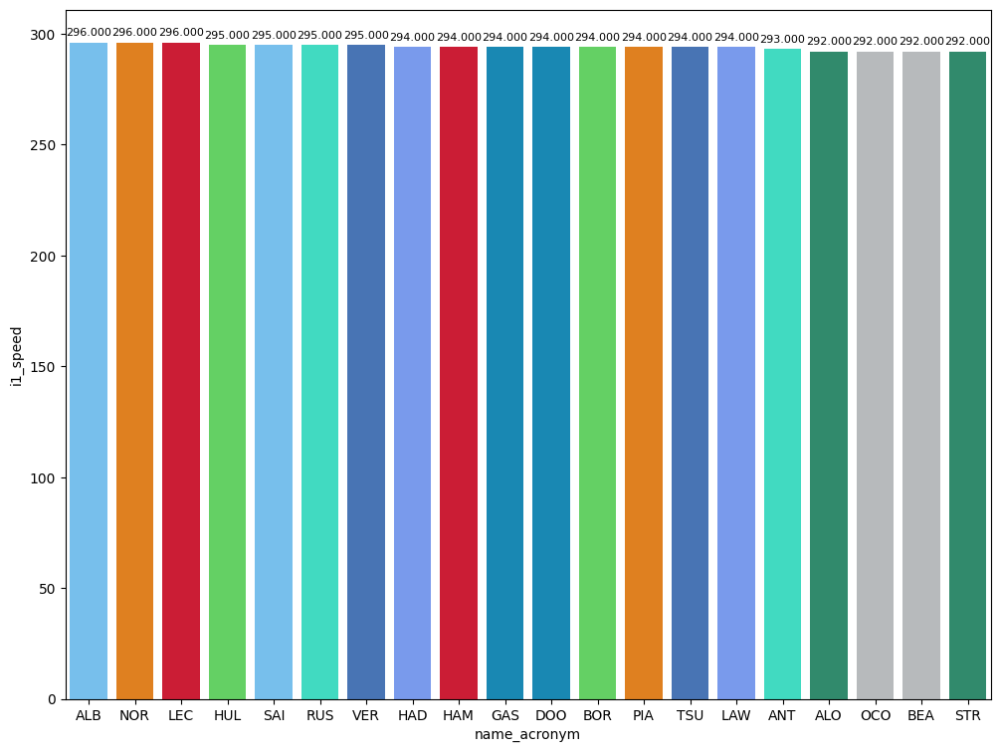

In [7]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

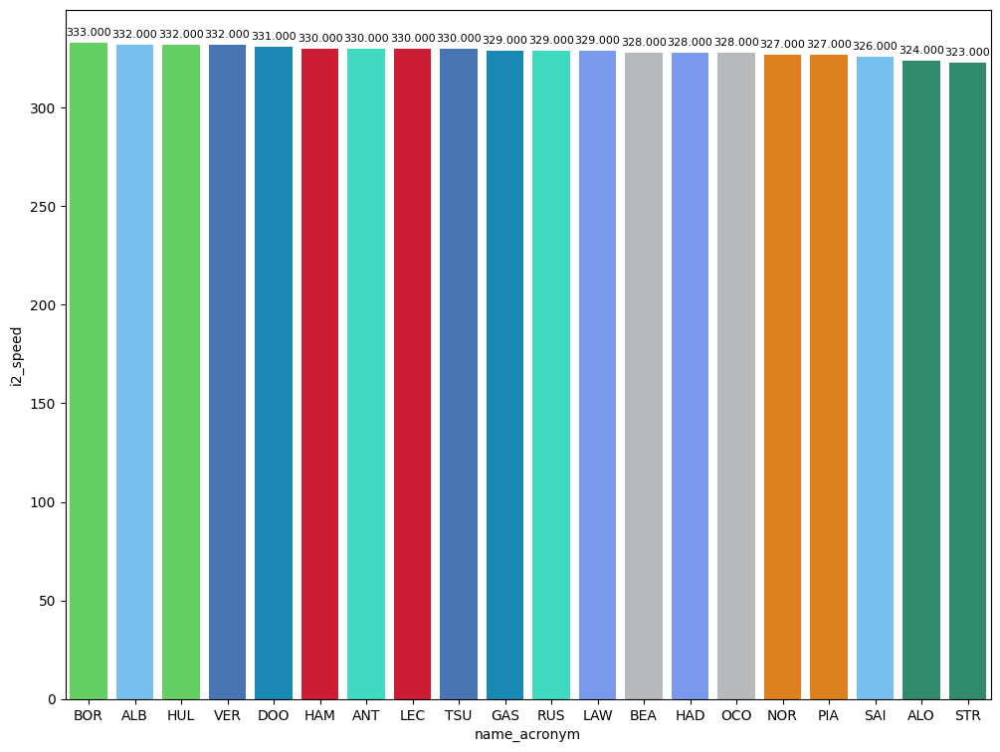

In [8]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

In [9]:
from matplotlib import pyplot as plt
competitiveLaps = jointables2.query("is_pit_out_lap == False and lap_duration < 95.406")
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])
maximumDate = "date_start <'2025-04-19T16:25:00+00:00'"


### Lap Time vs Max Speed
Fast: Left/ Slow:Right
Up: Low drag/ Down: High drag

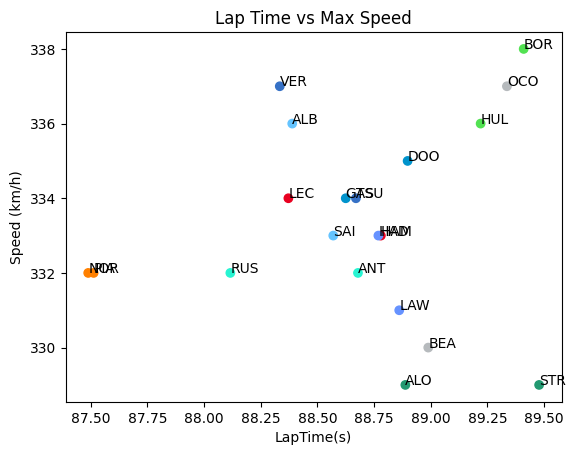

In [24]:
qSimulationData = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDate).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=False)
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.scatter(qSimulationData.lap_duration,qSimulationData.st_speed,c=list("#"+qSimulationData.team_colour))
plt.title("Lap Time vs Max Speed")
plt.xlabel("LapTime(s)")
plt.ylabel("Speed (km/h)")
for i, txt in enumerate(qSimulationData.name_acronym_x):
    ax.annotate(txt, (list(qSimulationData.lap_duration)[i], list(qSimulationData.st_speed)[i]))

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [25]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
6,Fernando ALONSO,HARD,58.920,33.270,40.919,133.109
14,Gabriel BORTOLETO,MEDIUM,33.293,28.515,29.198,91.006
246,Lando NORRIS,SOFT,31.769,27.670,28.050,87.489


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [26]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


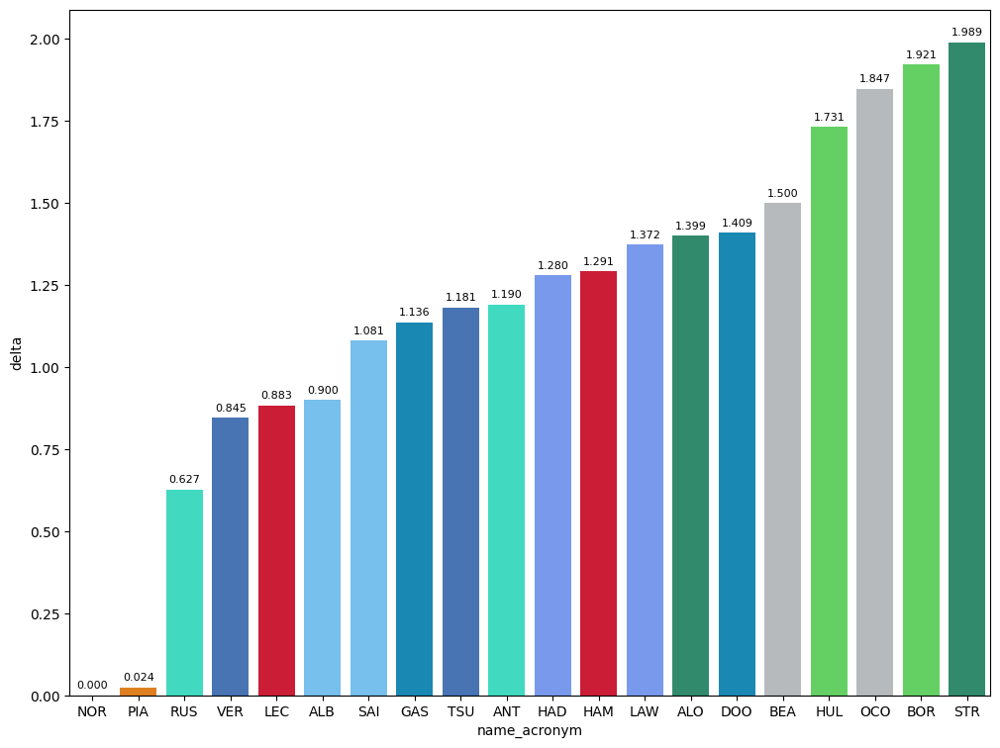

In [27]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.
S1: McLaren was dominant here and ALO should take advantage of this sector to pass Q2.
S2: Alpine and Ferrari suffered here . MER and WIL are strong here.
S3: Haas is strong here and they can pass to Q2 thanks to this sector. Williams, Gasly and  VER are strong.

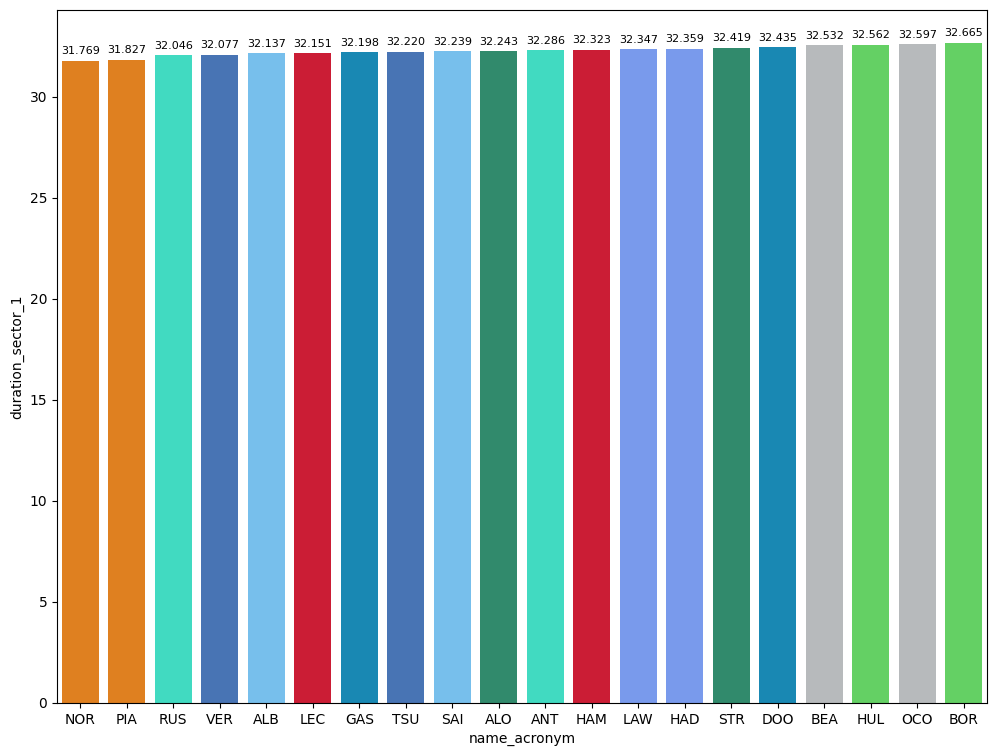

In [28]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

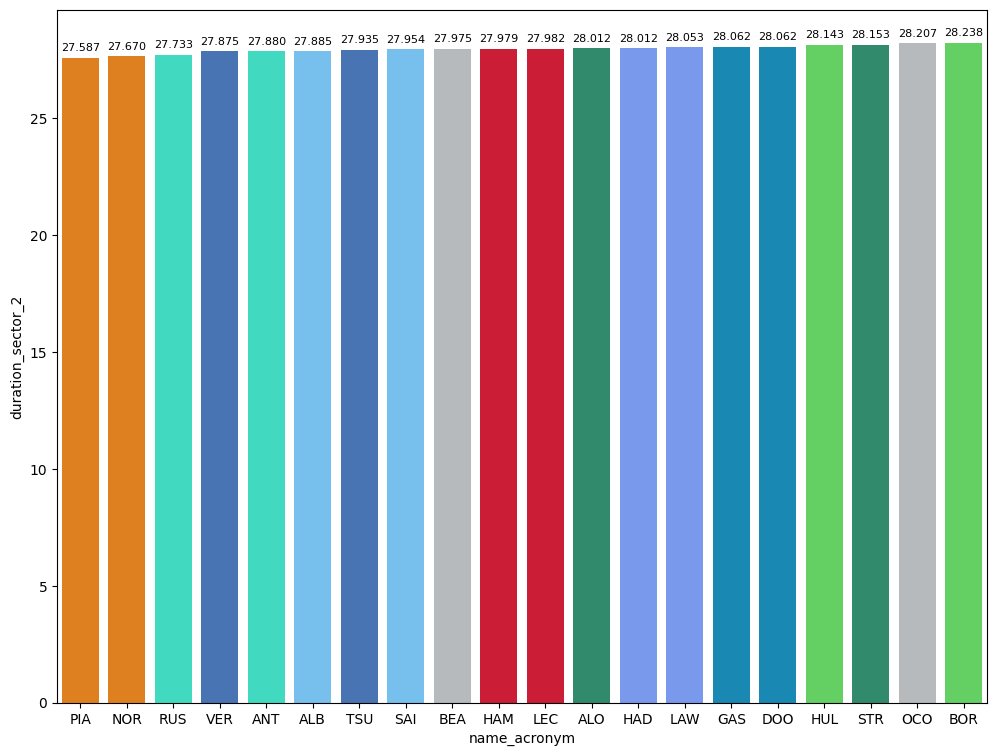

In [29]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

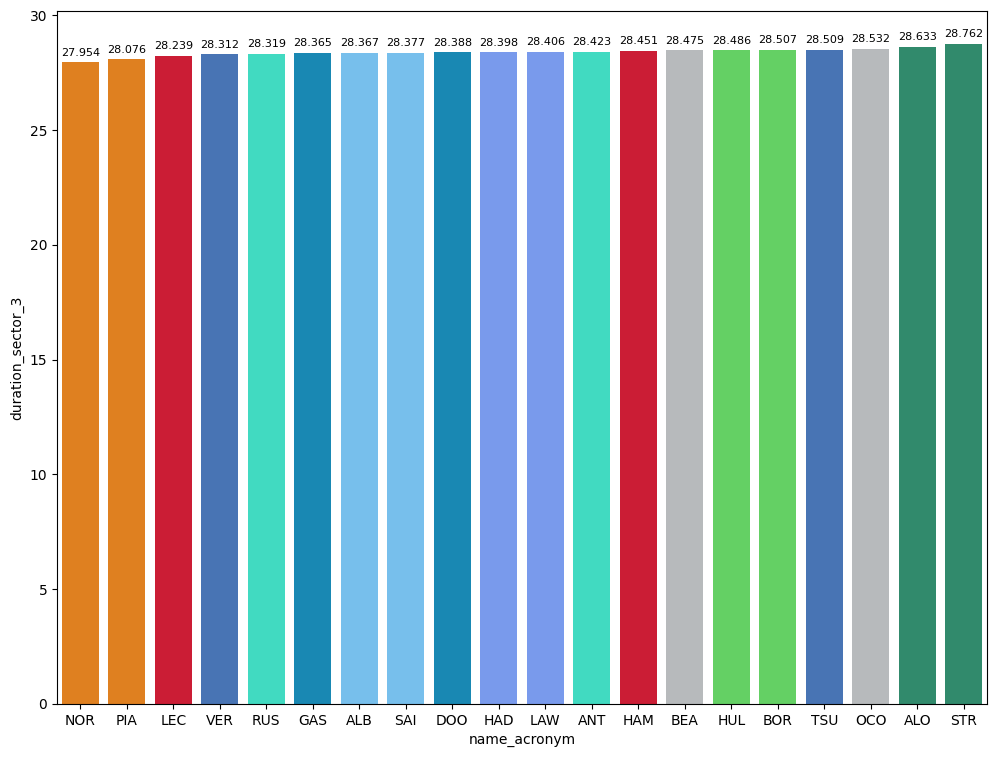

In [30]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [31]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 108").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,91.143990
MEDIUM,94.161545


### Gear shifts of the poleman

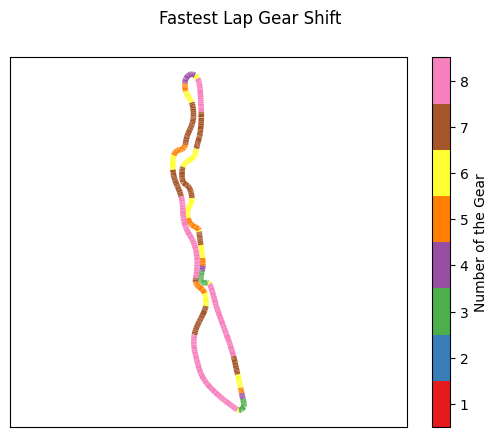

In [32]:
libraryDataF1.show_shifts_poleman(session)

### Comparaison between the poleman and the second

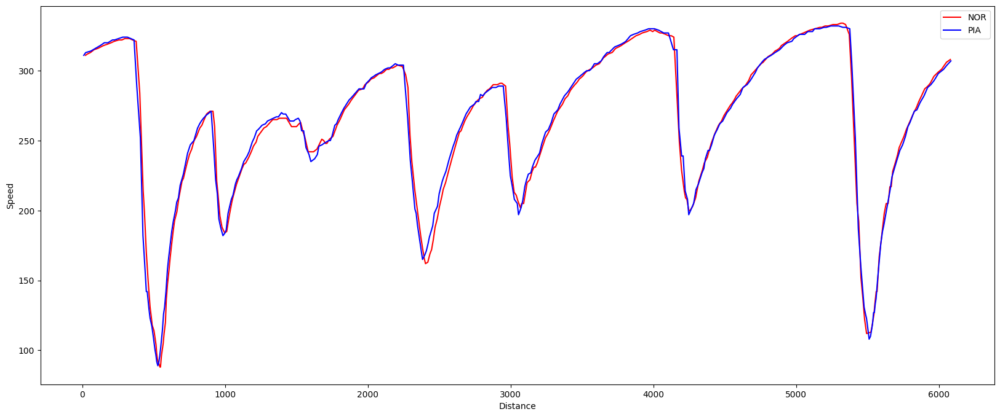

In [33]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

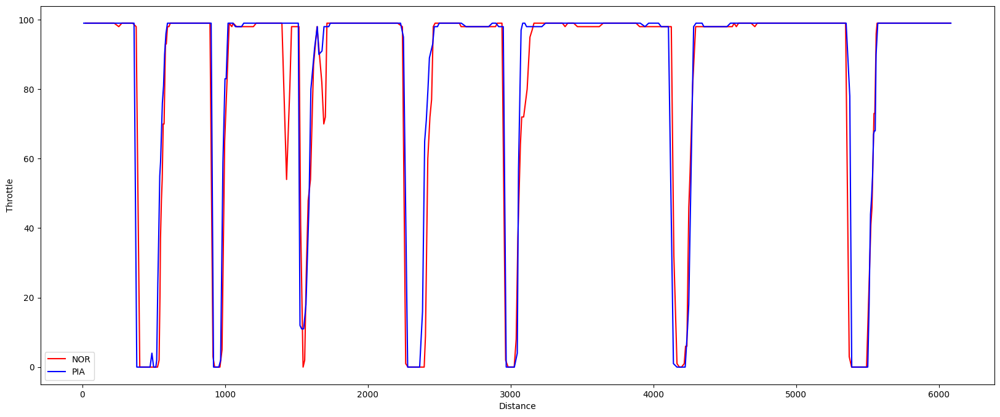

In [34]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

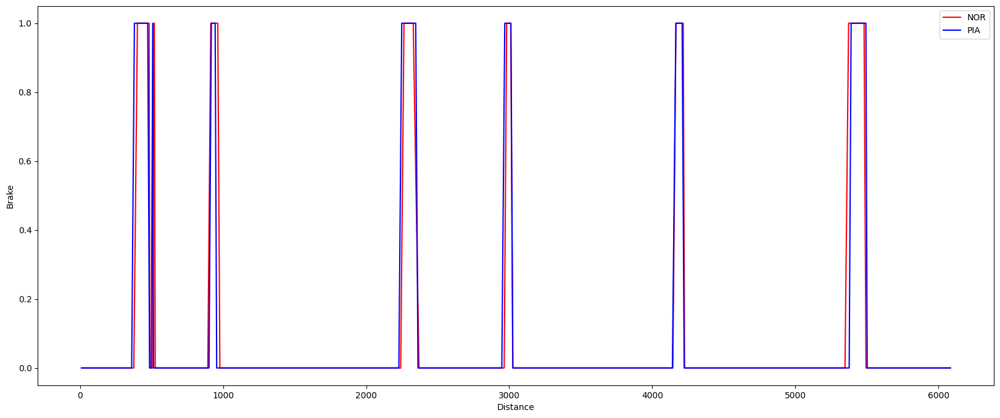

In [35]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

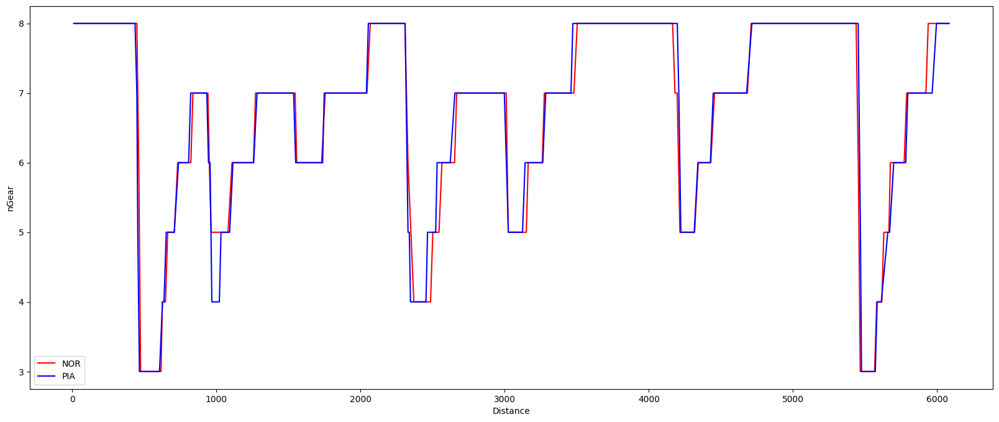

In [36]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session.

In [3]:
libraryDataF1.obtain_information('race_control',session_key=10018)

,session_key,meeting_key,date,category,flag,lap_number,message,driver_number,scope,sector
0,10018,1258,2025-04-19T16:47:46+00:00,Other,None,None,CORRECTION - BLUE HEAD PADDING MATERIAL MUST B...,None,None,NaN
1,10018,1258,2025-04-19T17:00:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,NaN
2,10018,1258,2025-04-19T17:06:00+00:00,Other,None,None,CAR 7 (DOO) TIME 1:58.947 DELETED - TRACK LIMI...,None,None,NaN
3,10018,1258,2025-04-19T17:07:23+00:00,Other,None,None,CAR 7 (DOO) TIME 1:58.947 DELETED - TRACK LIMI...,None,None,NaN
4,10018,1258,2025-04-19T17:09:48+00:00,Other,None,None,CAR 23 (ALB) LAP DELETED - TRACK LIMITS AT TUR...,None,None,NaN
5,10018,1258,2025-04-19T17:09:53+00:00,Other,None,None,CAR 5 (BOR) TIME 1:29.636 DELETED - TRACK LIMI...,None,None,NaN
6,10018,1258,2025-04-19T17:11:14+00:00,Other,None,None,CAR 7 (DOO) LAP DELETED - TRACK LIMITS AT TURN...,None,None,NaN
7,10018,1258,2025-04-19T17:13:06+00:00,Other,None,None,CAR 7 (DOO) LAP DELETED - TRACK LIMITS AT TURN...,None,None,NaN
8,10018,1258,2025-04-19T17:17:17+00:00,Flag,YELLOW,None,YELLOW IN TRACK SECTOR 2,None,Sector,2.0
9,10018,1258,2025-04-19T17:17:20+00:00,Flag,CLEAR,None,CLEAR IN TRACK SECTOR 2,None,Sector,2.0


### Obtain setup

In [4]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=10018)
stintInformation = libraryDataF1.obtain_information('stints',session_key=10018)
drivers = libraryDataF1.obtain_information('drivers',session_key=10018)
libraryDataF1.obtain_drivers_colours(drivers)

In [7]:
session = ff1.get_session(2025, 5, 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

core           INFO 	Loading data for Saudi Arabian Grand Prix - Qualifying [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for _extended_timing_data. Loadin

To obtain a better analysis, those laptimes deleted will be removed from this analysis in order to obtain the data with valid values. So that,taking into account the race control table, it will be neccesary to consult the qualyfing data to obtain the ids. 

In [ ]:
laptimes_deleted = [118.947,89.636]
driver_number_lap_deleted = [7,5]

for ltime_deleted, dn_time_deleted in zip(laptimes_deleted,driver_number_lap_deleted):
    try:
        id_deleted = qualyfing.query("driver_number == @dn_time_deleted and lap_duration == @ltime_deleted").index[0]
        qualyfing = qualyfing.drop(id_deleted)
    except:
        print("Laptime deleted associated with the selected driver does not exist. Please, check again the order of the arrays")

In [8]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)
bestlap[0:1]

,meeting_key,session_key,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,duration_sector_2,duration_sector_3,segments_sector_1,segments_sector_2,segments_sector_3,lap_number
281,1258,10018,1,296.0,329.0,332.0,2025-04-19T18:08:31.365000+00:00,87.294,False,31.507,27.756,28.031,"[2051, 2049, 2049, 2049, 2049, 2049, 2049, 205...","[2048, 2049, 2049, 2048, 2048, 2048, 2048]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 204...",18


In this case, the fastest lap is 87.294 seconds (1.27.294= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (93.404 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [9]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 93.404")

In [10]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
Bearman and Alonso were able to pass Q2 and DOO was the driver that was knocked-out. Hamilton was able to pass thanks to 7 militenths

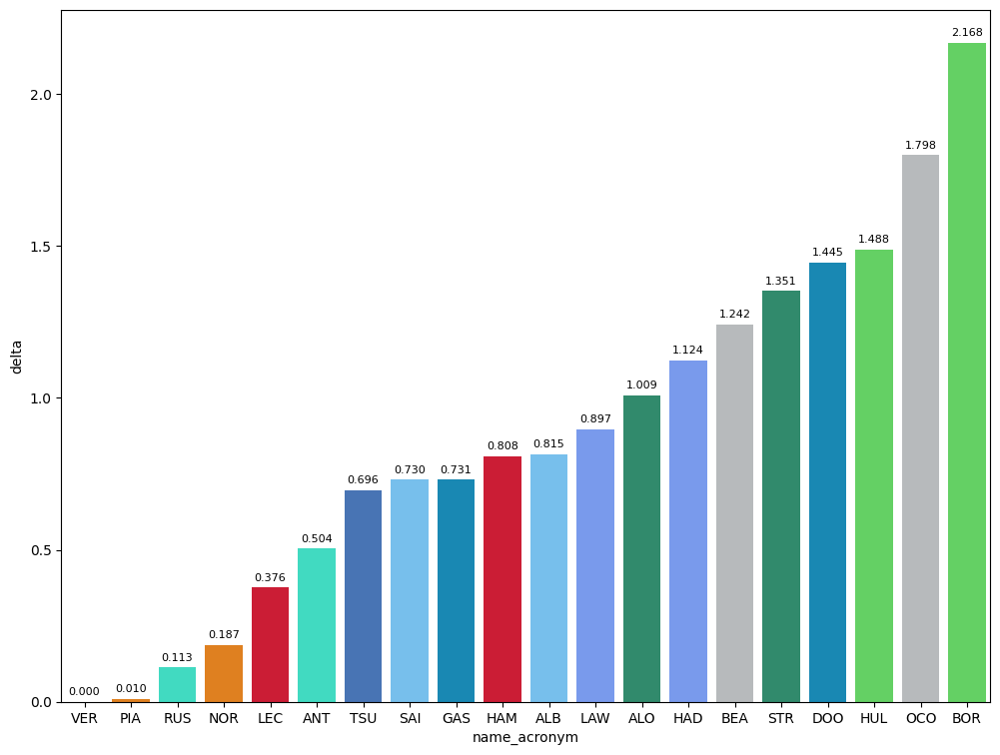

In [11]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

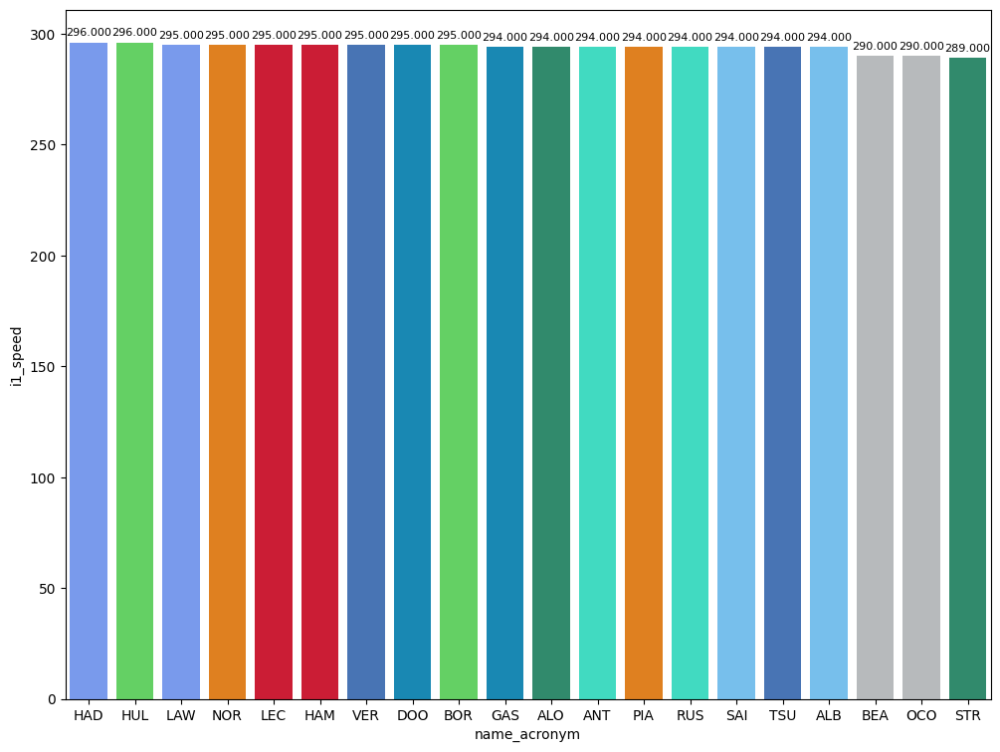

In [12]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

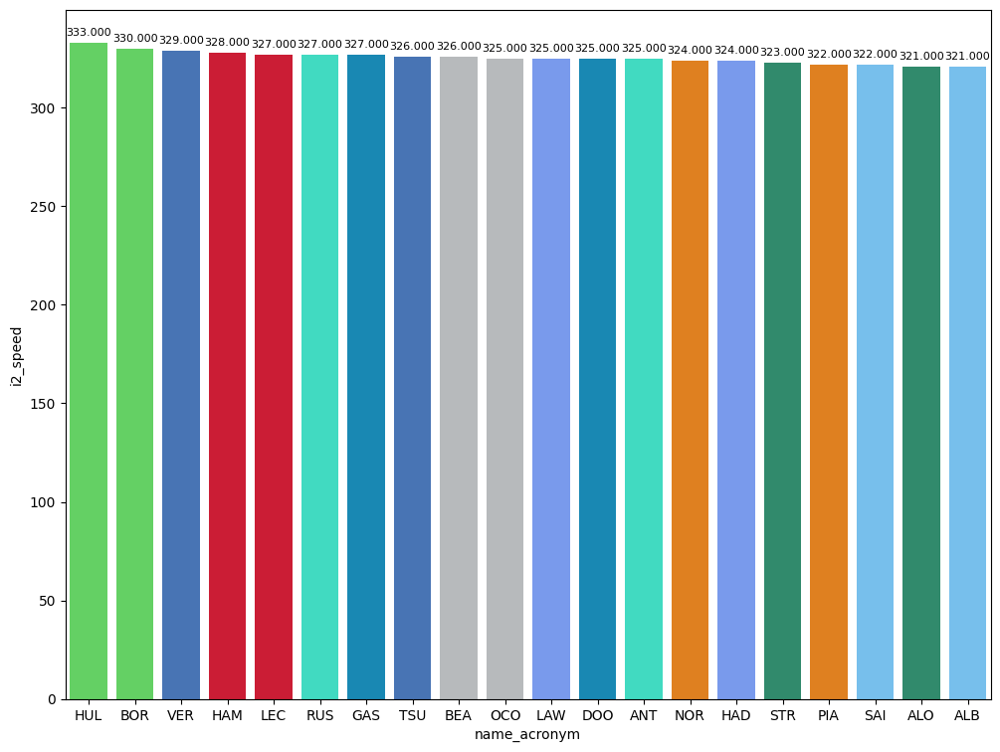

In [13]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

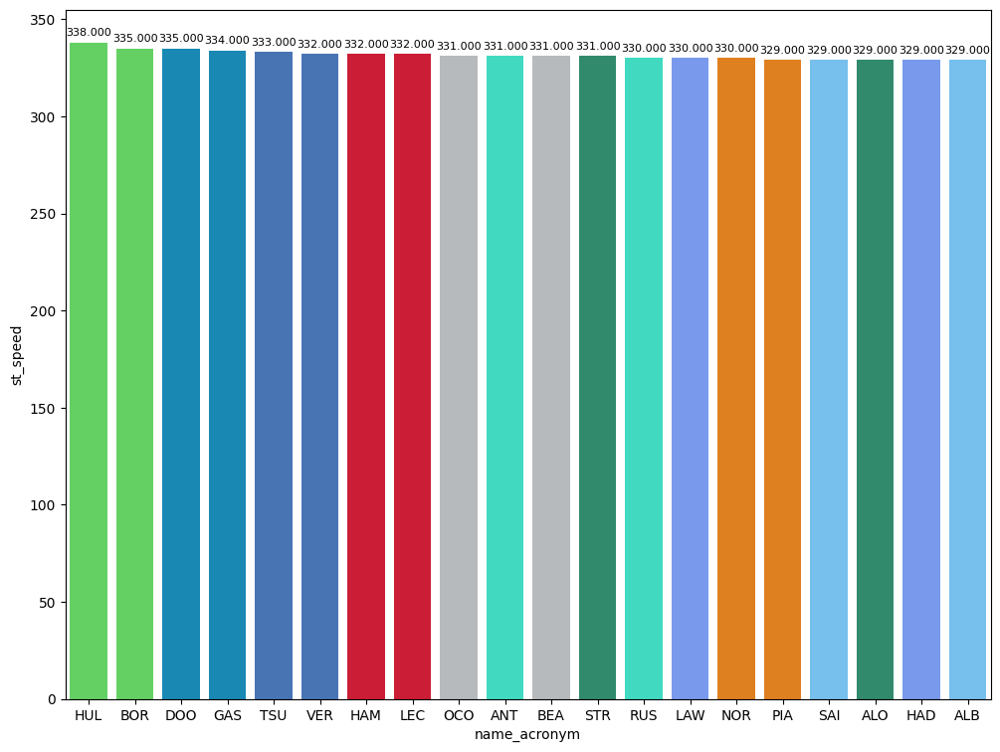

In [14]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

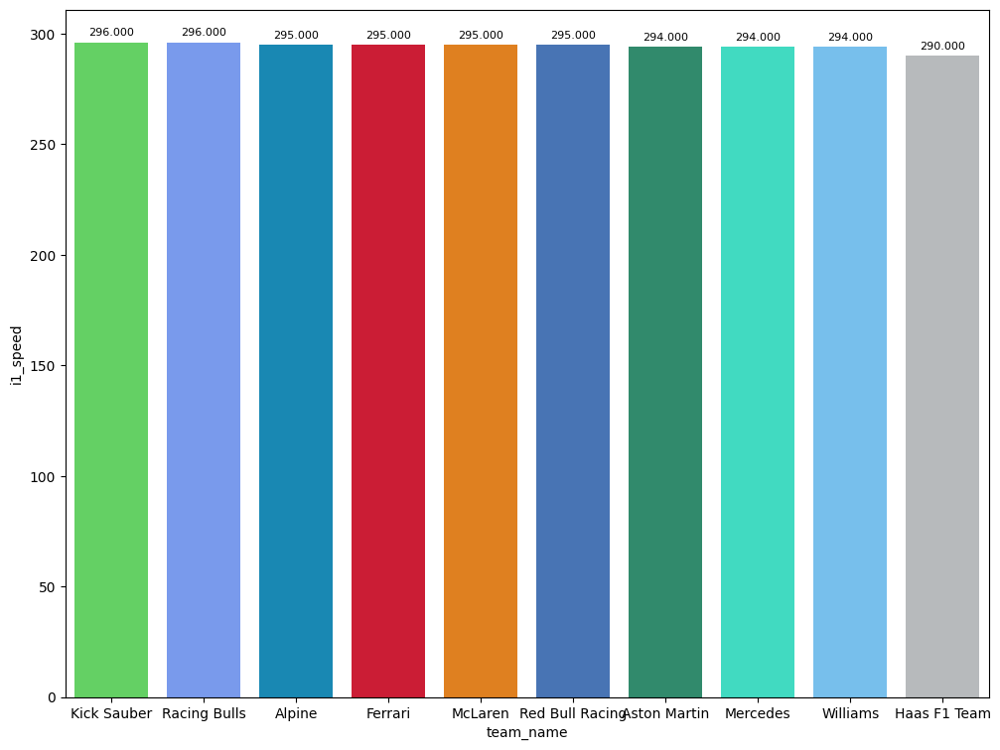

In [15]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

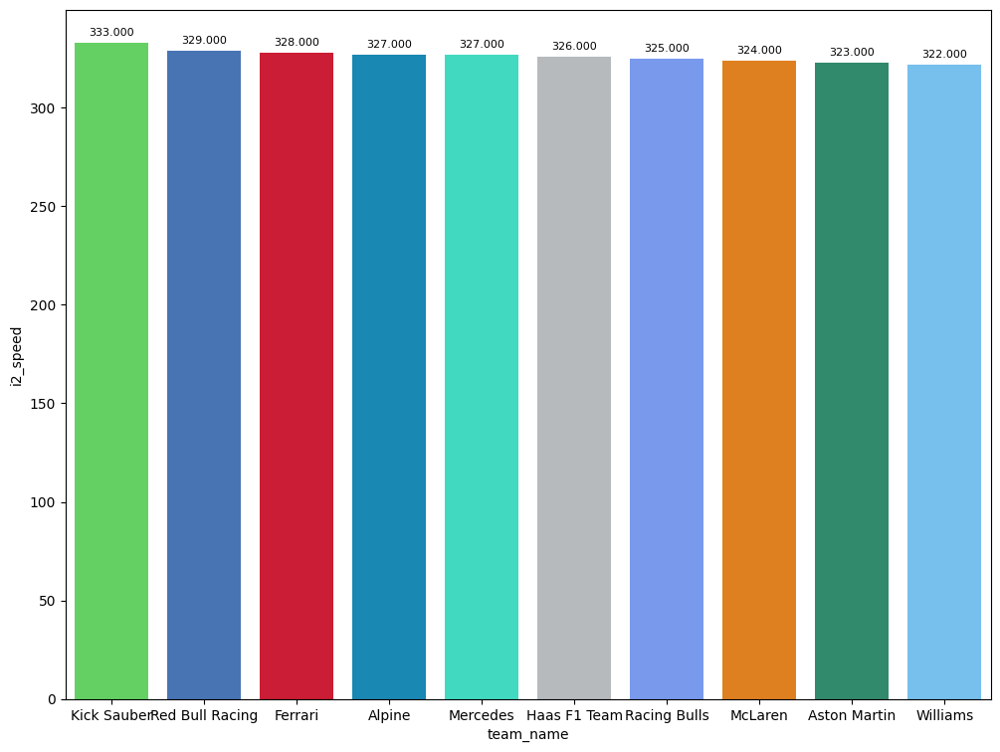

In [16]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

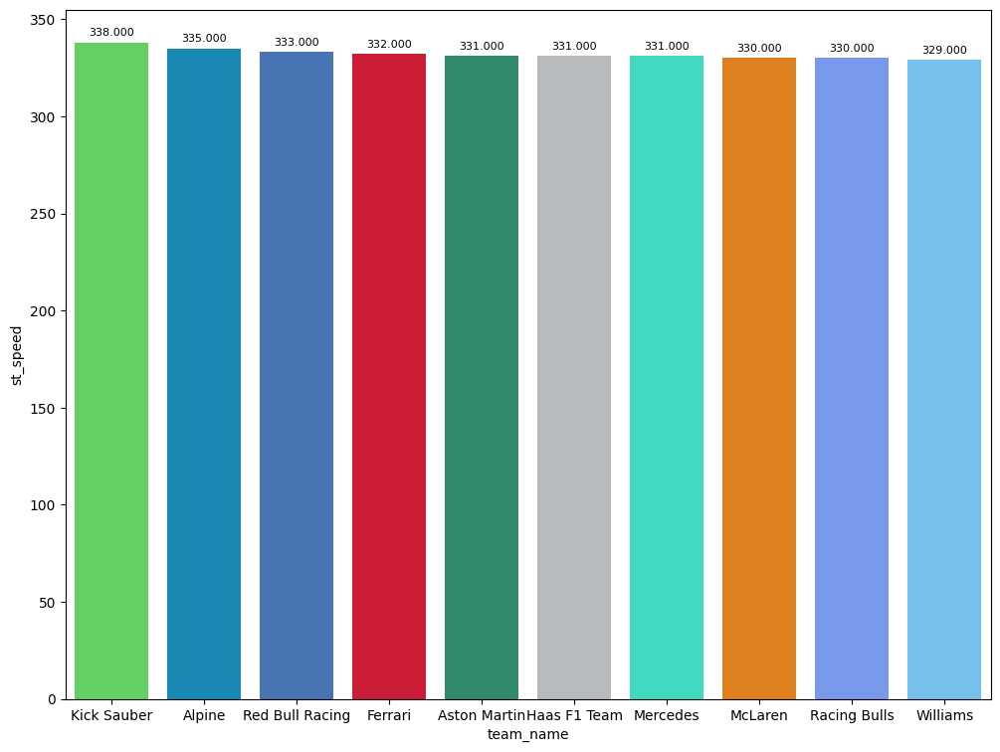

In [17]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [18]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [20]:
maximumDateQ1 = "date_start <'2025-04-19T17:25:01+00:00'"
maximumDateQ2 = "date_start <'2025-04-19T17:48:00+00:00' and date_start >'2025-04-19T17:25:01+00:00'"
maximumDateQ3 = "date_start >'2025-04-19T17:48:00+00:00'"

### Qualyfing 1


In [21]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
Hadjar qualified thanks to the second and third sector. STR was faster than him in the first sector but Aston struggled in the last two sectors. In case of DOO, his weakness was the second sector.

In [22]:
#Reference
P15 = q1Data[14:15]

In [23]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Isack HADJAR Sector 1:  32.225 Sector 2:  27.994 Sector 3:  28.352


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
In the first sector we can see that none of the eliminated drivers were close to pass to Q2.

In [24]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,18,0.074,-0.153,0.060,0.167,STR
1,7,0.168,-0.002,0.129,0.041,DOO
2,27,0.211,0.252,-0.012,-0.029,HUL
3,31,0.521,0.493,0.048,-0.020,OCO
4,5,0.891,0.428,0.270,0.193,BOR


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_ti

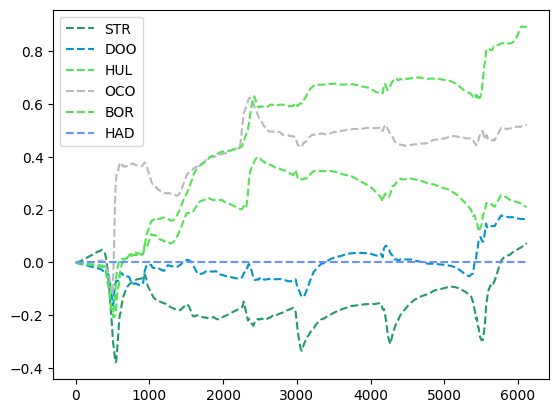

In [25]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
LAW was close to HAD but the third sector made the difference.

In [26]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,1,-0.793,-0.351,-0.181,-0.261,VER
1,4,-0.766,-0.424,-0.163,-0.179,NOR
2,81,-0.670,-0.324,-0.284,-0.062,PIA
3,12,-0.443,0.007,-0.251,-0.199,ANT
4,22,-0.345,-0.197,-0.103,-0.045,TSU
5,23,-0.292,-0.261,0.012,-0.043,ALB
6,63,-0.289,0.070,-0.270,-0.089,RUS
7,55,-0.217,-0.129,-0.042,-0.046,SAI
8,44,-0.199,0.011,-0.105,-0.105,HAM
9,10,-0.150,-0.089,0.033,-0.094,GAS


#### Best sector per driver
In this section we can see the best sector of the session

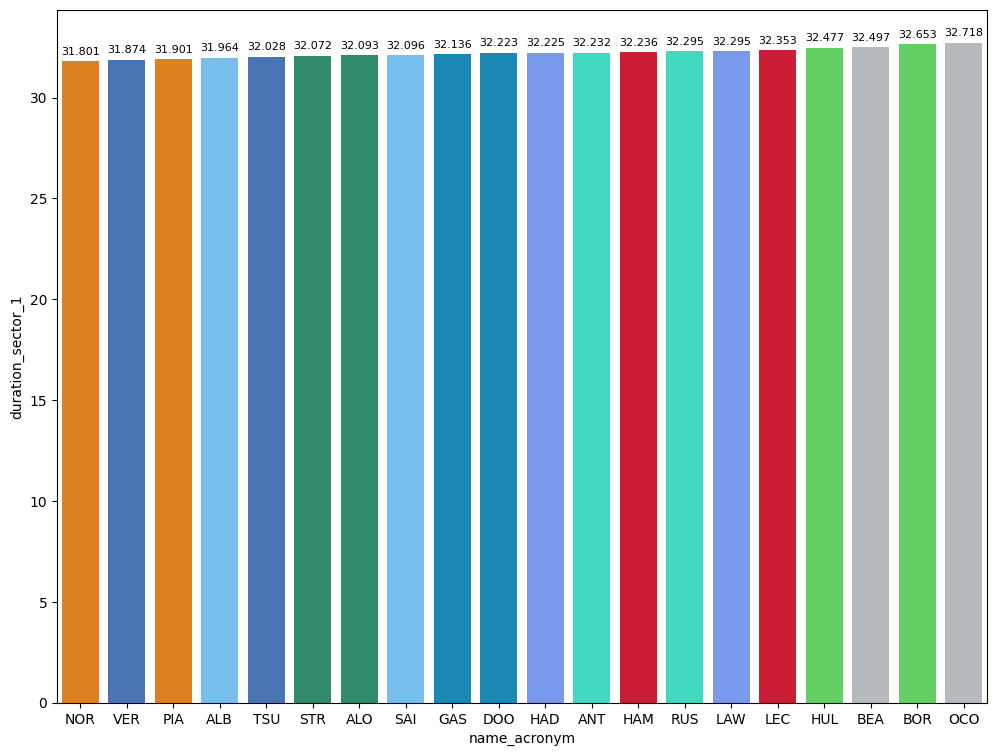

In [27]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

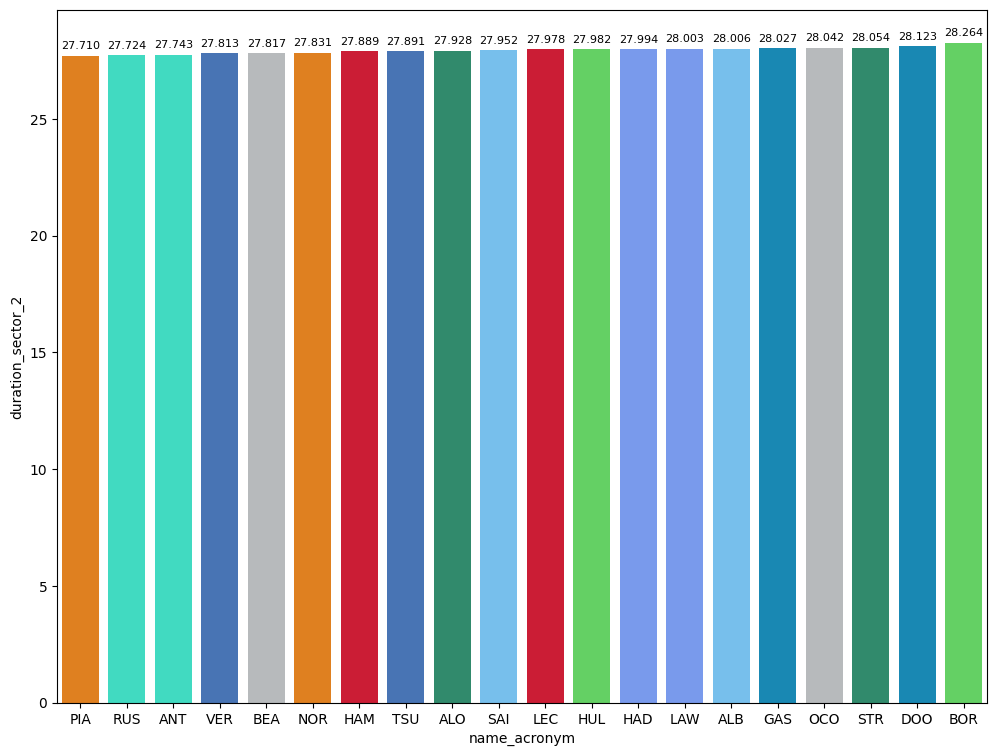

In [28]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

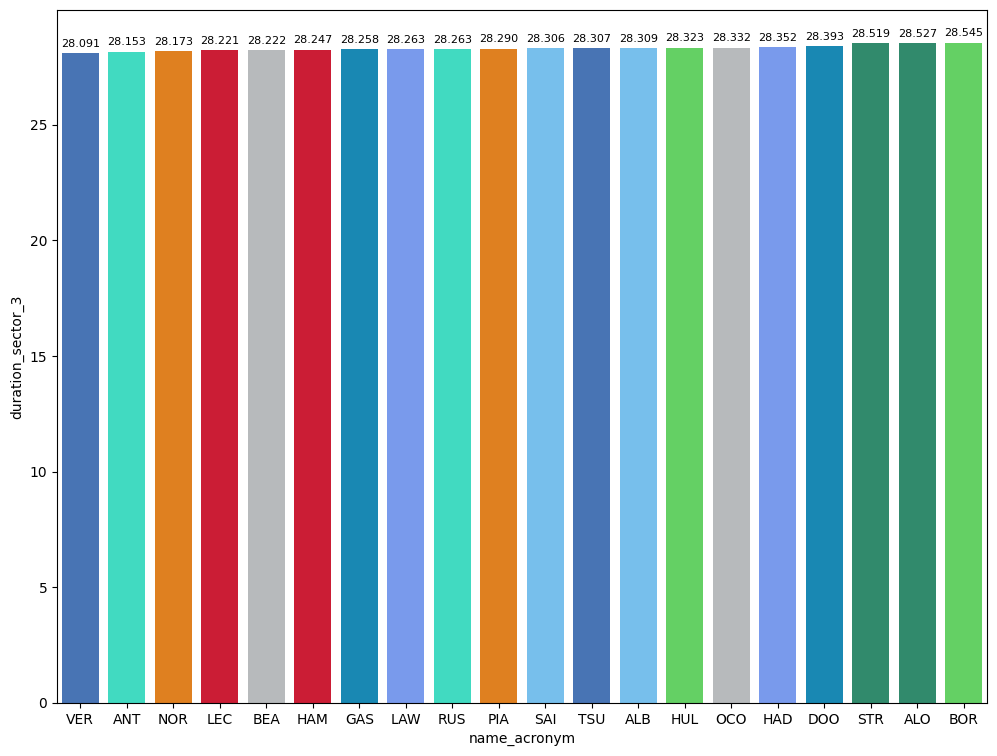

In [29]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2
Albon could have passed but in the last sector he lost his opportunity not improving compared to his last attemp. In case of Lawson, his first sector was bad. In case of Alonso, Aston was the slowest in 3ºth sector and this costed his attemp to pass.

In [30]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [31]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Lewis HAMILTON Sector 1:  31.972 Sector 2:  27.922 Sector 3:  28.208


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
In the first sector we can see that Bearman and Albon were faster than Hamilton, being Bearman chances to make it through Q3.
But the rookie was not able to improve in the second and third sector to pass to Q3

In [32]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,23,0.007,-0.071,-0.116,0.194,ALB
1,30,0.089,0.115,-0.032,0.006,LAW
2,14,0.201,0.049,-0.070,0.222,ALO
3,6,0.316,0.237,-0.035,0.114,HAD
4,87,0.546,0.517,-0.051,0.080,BEA


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_ti

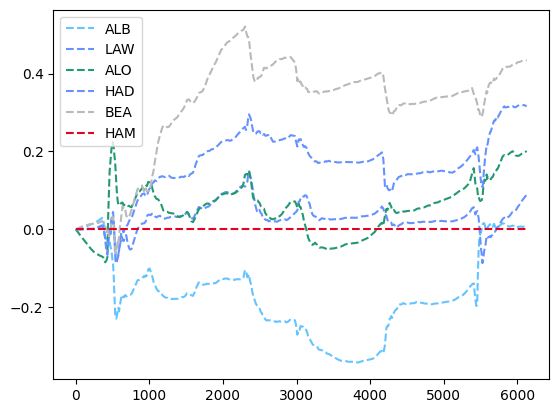

In [33]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk


In [34]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,4,-0.621,-0.227,-0.238,-0.156,NOR
1,1,-0.573,-0.262,-0.196,-0.115,VER
2,81,-0.557,-0.171,-0.209,-0.177,PIA
3,63,-0.503,-0.235,-0.161,-0.107,RUS
4,12,-0.304,-0.052,-0.138,-0.114,ANT
5,16,-0.236,0.047,-0.169,-0.114,LEC
6,22,-0.112,-0.053,-0.081,0.022,TSU
7,55,-0.078,0.090,-0.100,-0.068,SAI
8,10,-0.077,0.164,-0.106,-0.135,GAS


#### Best sector per driver
In this section we can see the best sector of the session

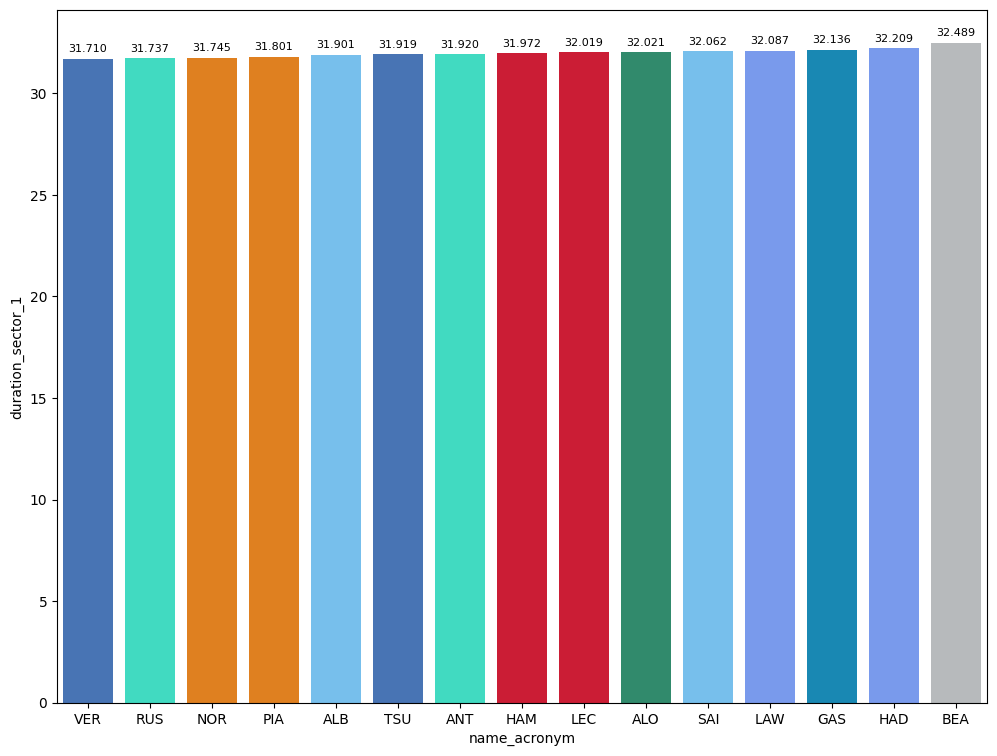

In [35]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

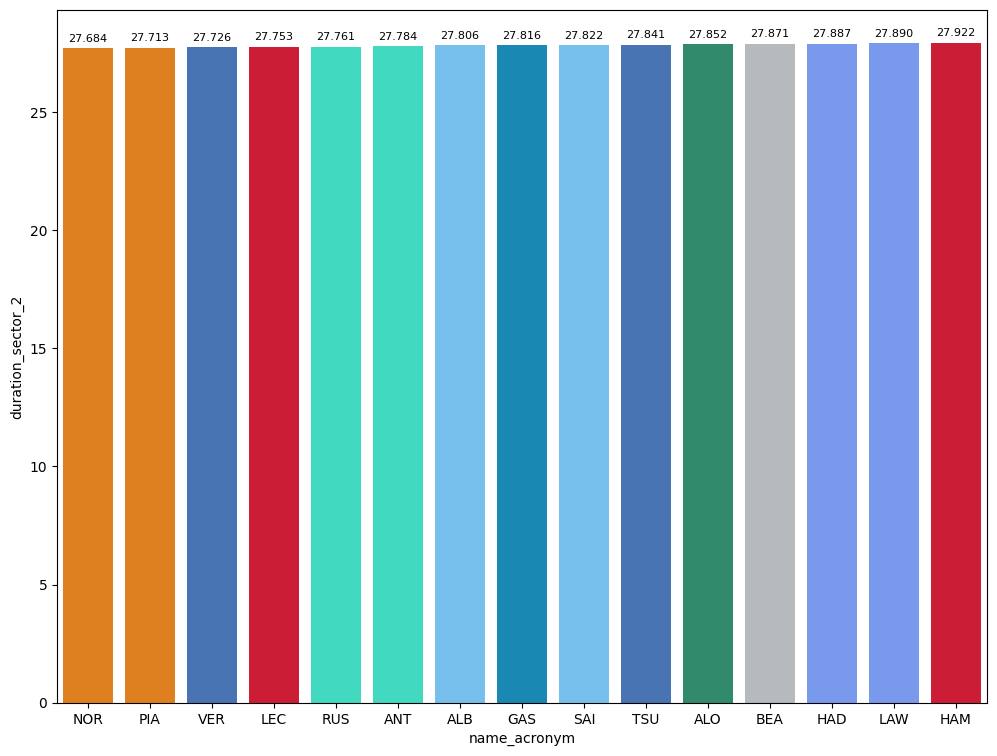

In [36]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

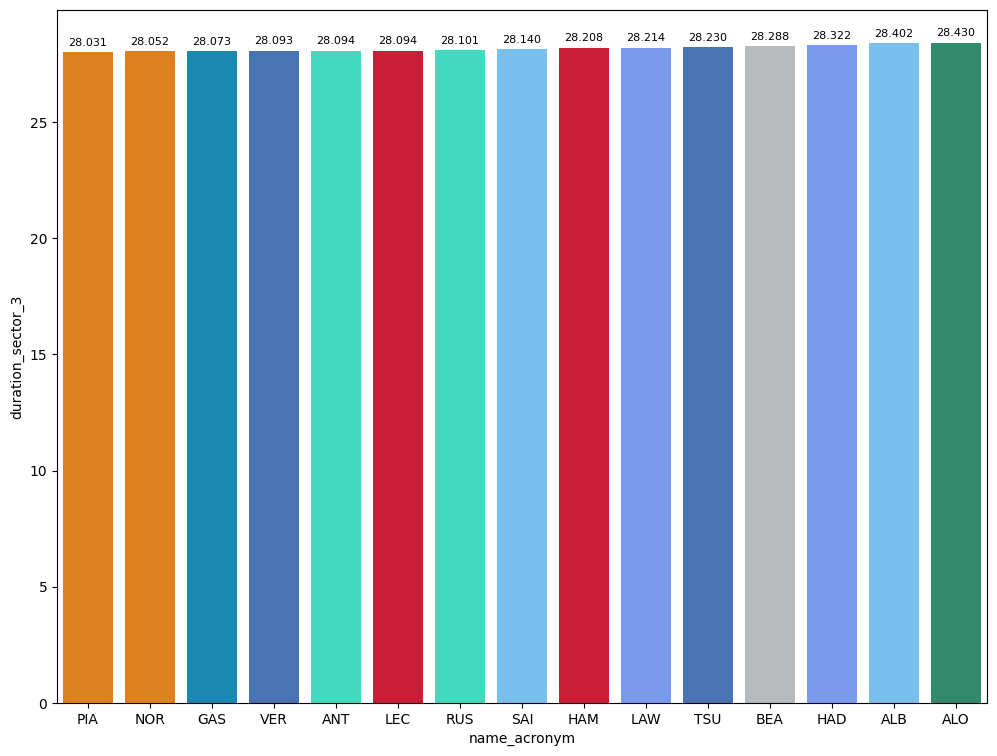

In [37]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [38]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [39]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Max VERSTAPPEN Sector 1:  31.507 Sector 2:  27.756 Sector 3:  28.031


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Guess the poleman was very difficult.Max did it again being better than Piastri in the first sector and it was enough to take the pole.

In [40]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,81,0.010,0.123,-0.071,-0.042,PIA
1,63,0.113,0.177,-0.179,0.115,RUS
2,16,0.376,0.350,0.040,-0.014,LEC
3,12,0.572,0.657,-0.074,-0.011,ANT
4,55,0.870,0.577,0.166,0.127,SAI
5,44,0.907,0.630,0.077,0.200,HAM
6,22,0.910,0.632,0.106,0.172,TSU
7,10,1.073,0.644,0.162,0.267,GAS


#### Best sector per driver
In this section we can see the best sector of the session

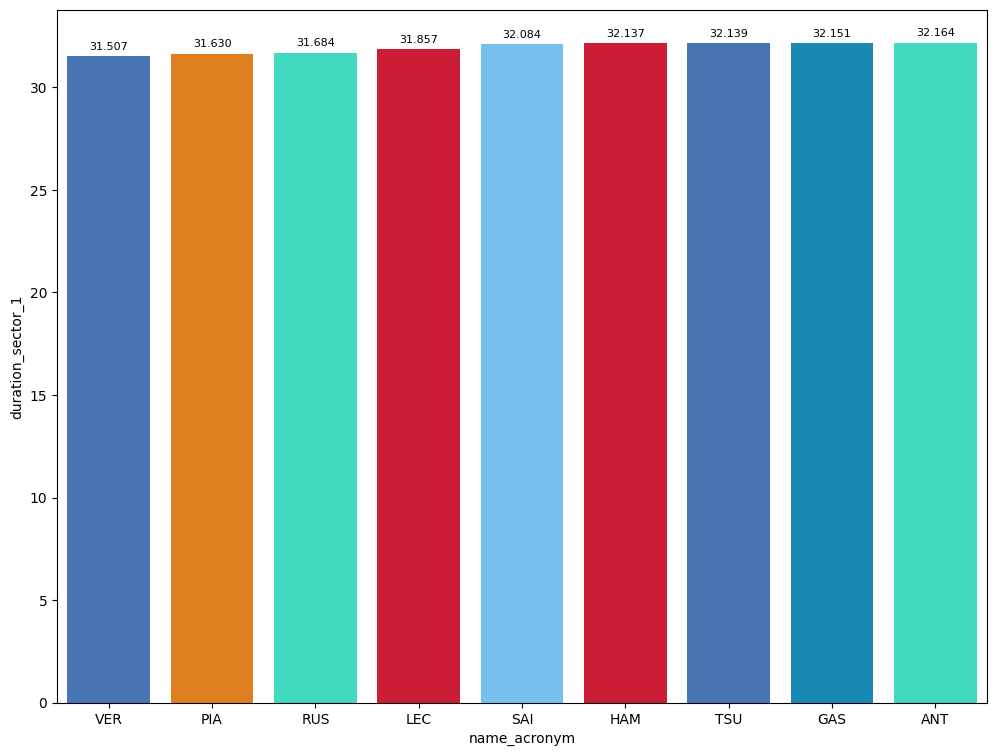

In [41]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

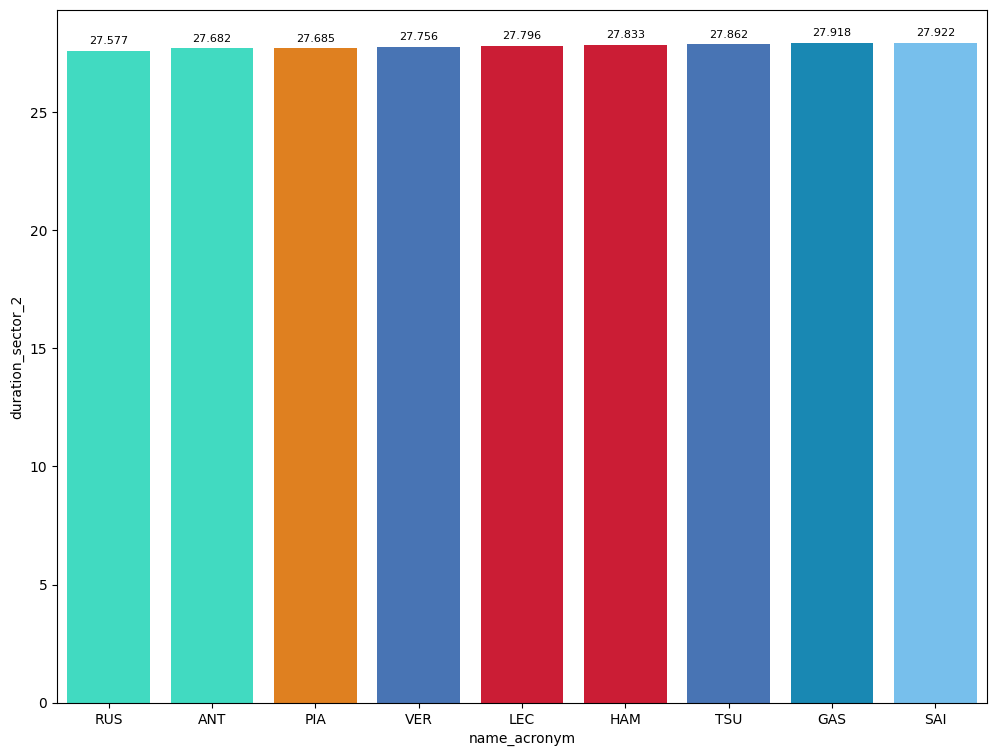

In [42]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

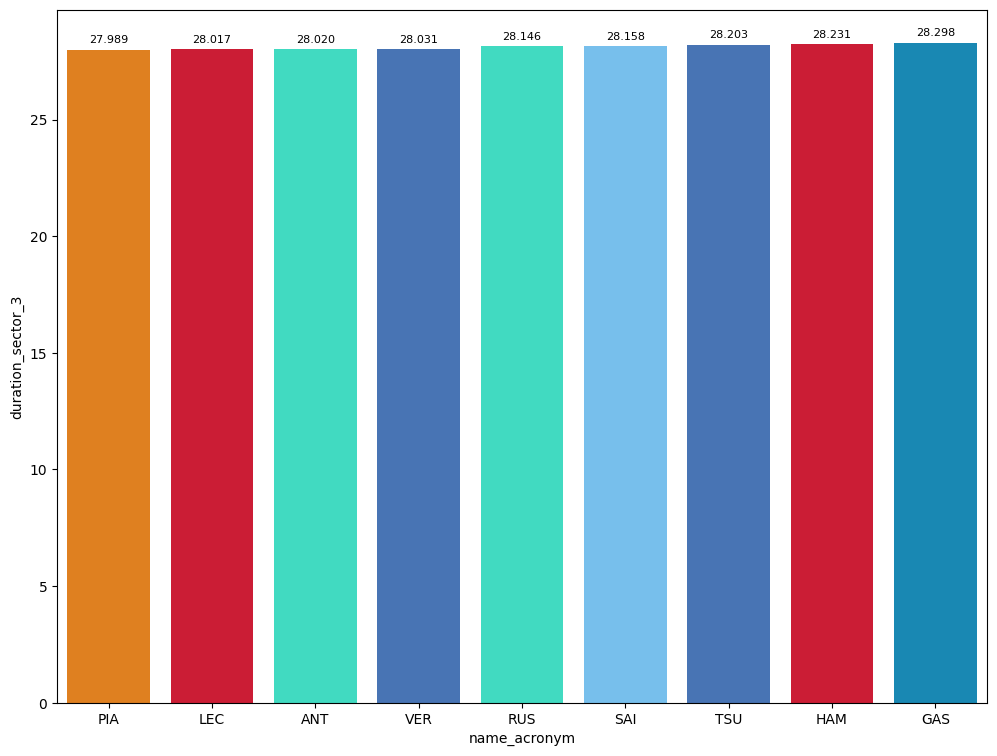

In [43]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

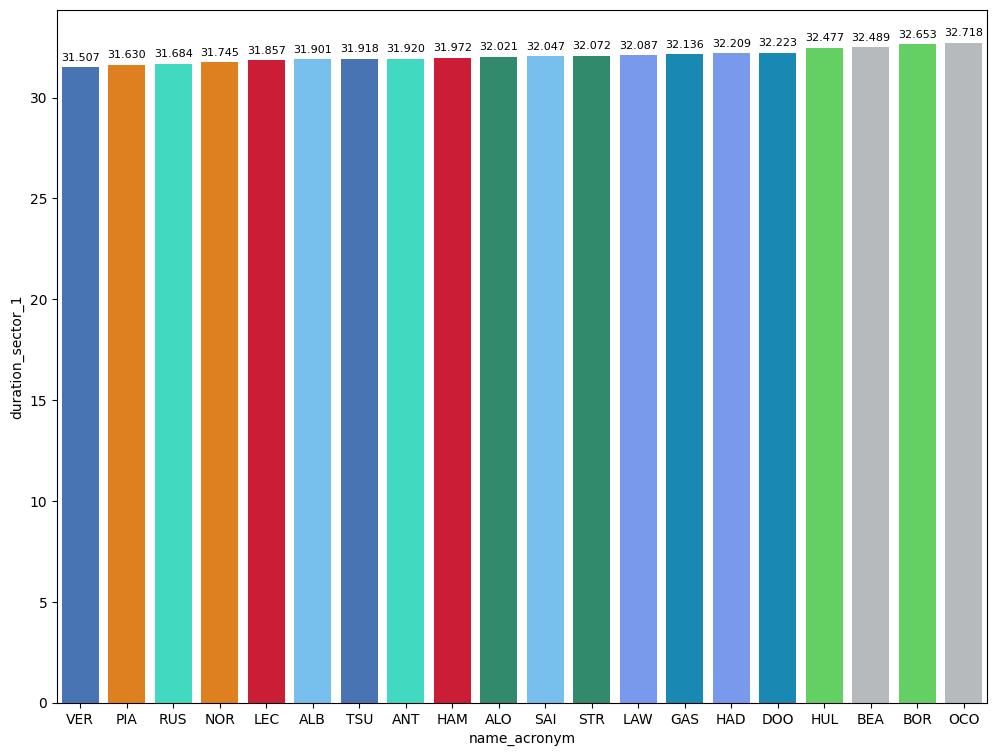

In [47]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

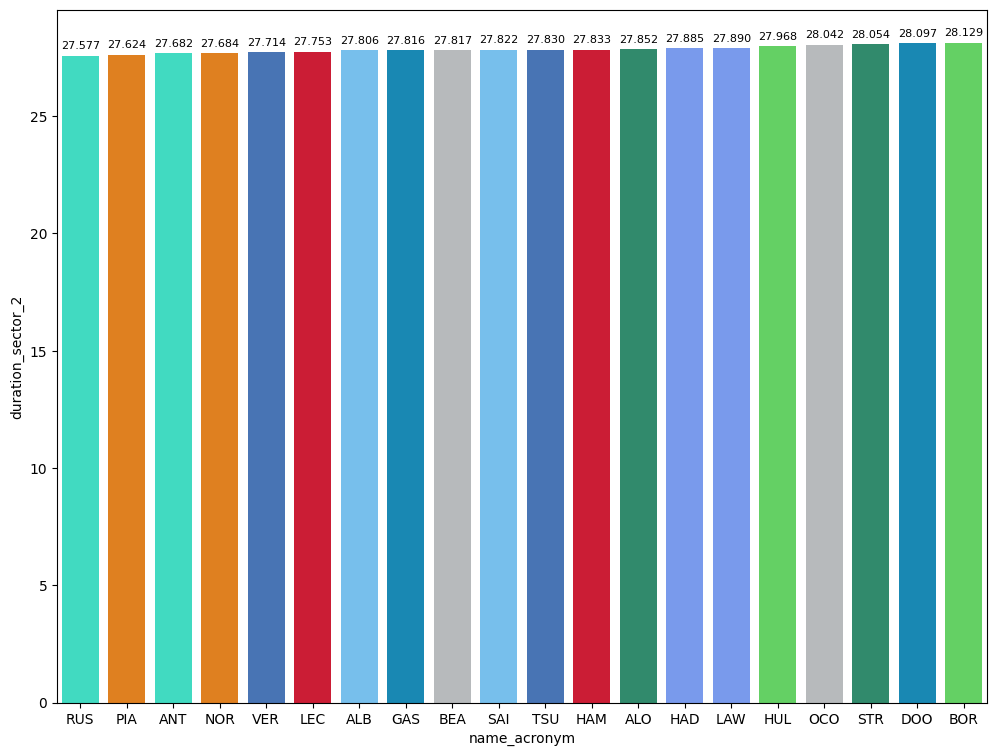

In [48]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

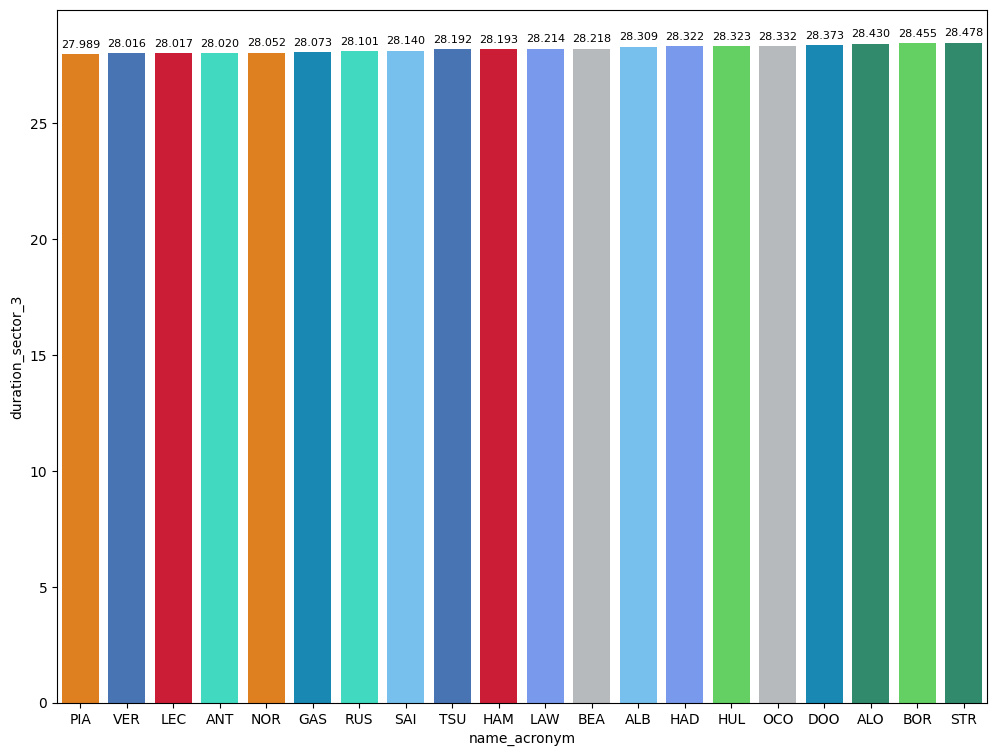

In [49]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Gear shifts of the poleman

core        WARNING 	Failed to preserve data type for column 'X' while merging telemetry.
core        WARNING 	Failed to preserve data type for column 'Y' while merging telemetry.
core        WARNING 	Failed to preserve data type for column 'Z' while merging telemetry.


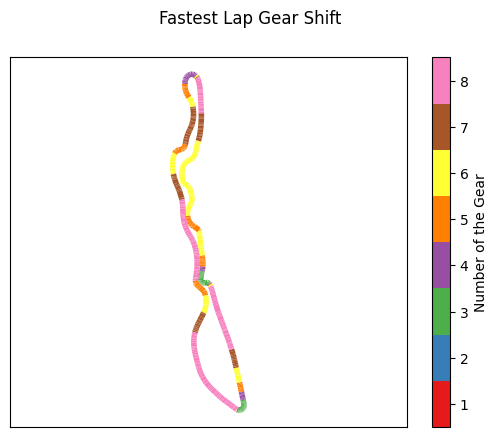

In [50]:
libraryDataF1.show_shifts_poleman(session)

### Comparaison between the poleman and the second

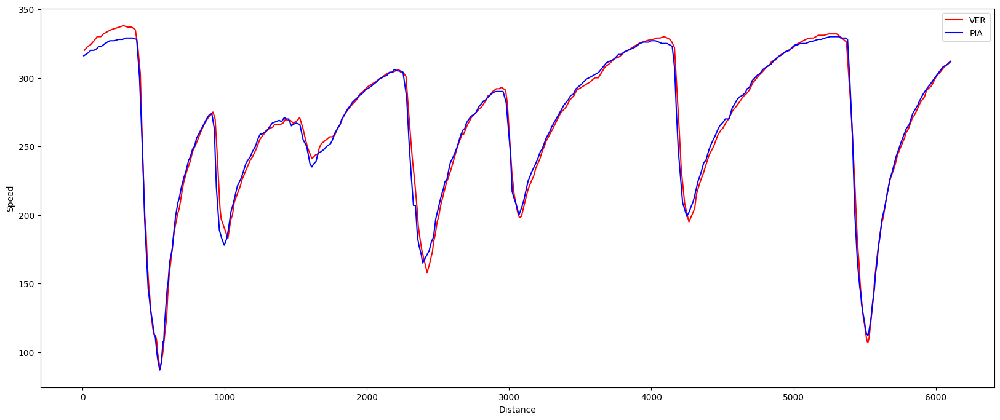

In [51]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

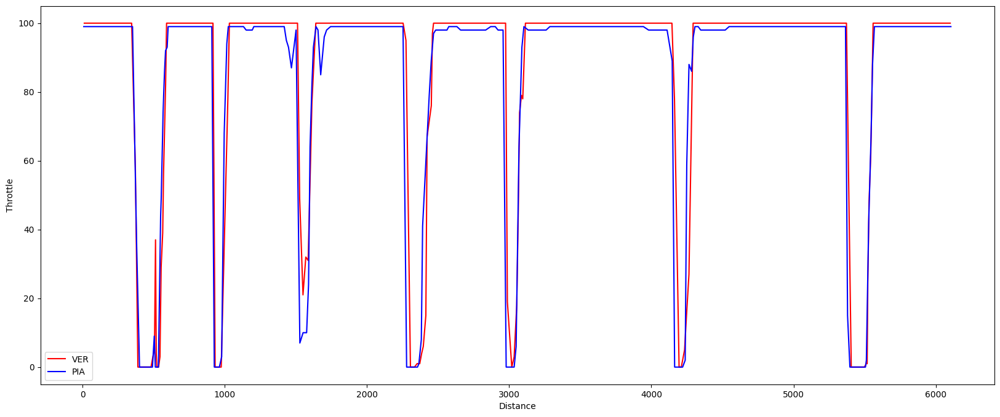

In [52]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

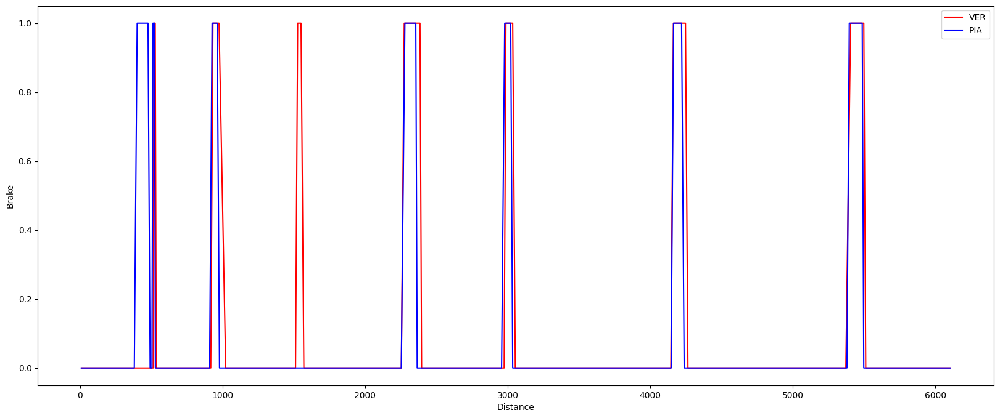

In [53]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

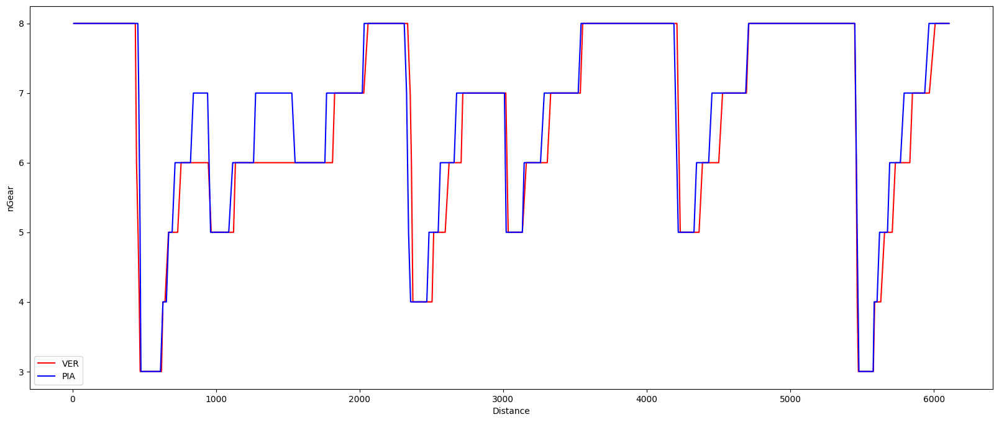

In [54]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [67]:
race = libraryDataF1.obtain_information('laps',session_key=10022)
stintInformation = libraryDataF1.obtain_information('stints',session_key=10022)
drivers = libraryDataF1.obtain_information('drivers',session_key=10022)
libraryDataF1.obtain_drivers_colours(drivers)

In [68]:
stintInformation.loc[(stintInformation['driver_number']==63) &(stintInformation['lap_start']==21),'compound'] = 'HARD'
stintInformation.loc[(stintInformation['driver_number']==30) &(stintInformation['lap_start']==21),'compound'] = 'HARD'
stintInformation.loc[(stintInformation['driver_number']==7) &(stintInformation['lap_start']==2),'compound'] = 'HARD'
stintInformation.loc[(stintInformation['driver_number']==7) &(stintInformation['lap_start']==32),'compound'] = 'HARD'

In [70]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [71]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Mean pace with the different compound used on the session

In [72]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 108").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
HARD,94.716627
MEDIUM,94.821824


### Tyre Strategies

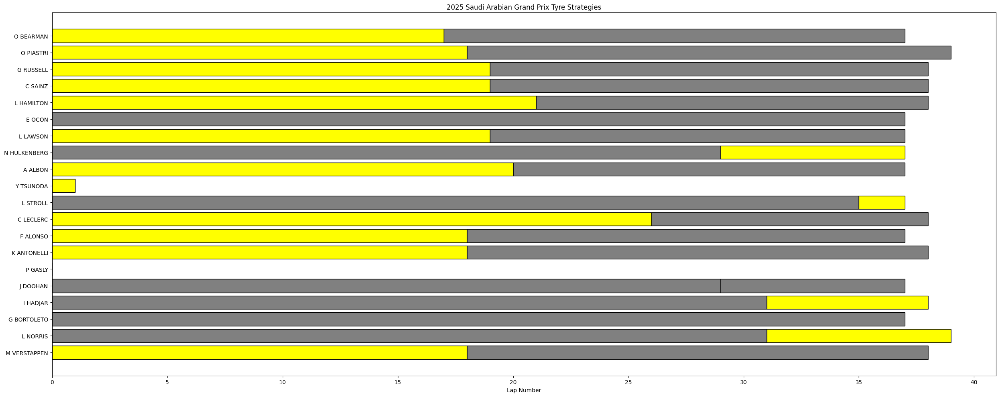

In [73]:
libraryDataF1.race_strategies("2025 Saudi Arabian Grand Prix Tyre Strategies",drivers,stintInformation)

### Lap Time Distributions

/home/frank/Escritorio/F1_backup/F1_notebooks/F1_25/F1_library/libraryF1dataNotebook.py:576: UserWarning: The palette list has more values (20) than needed (18), which may not be intended.
  sns.violinplot(data=datasetX,


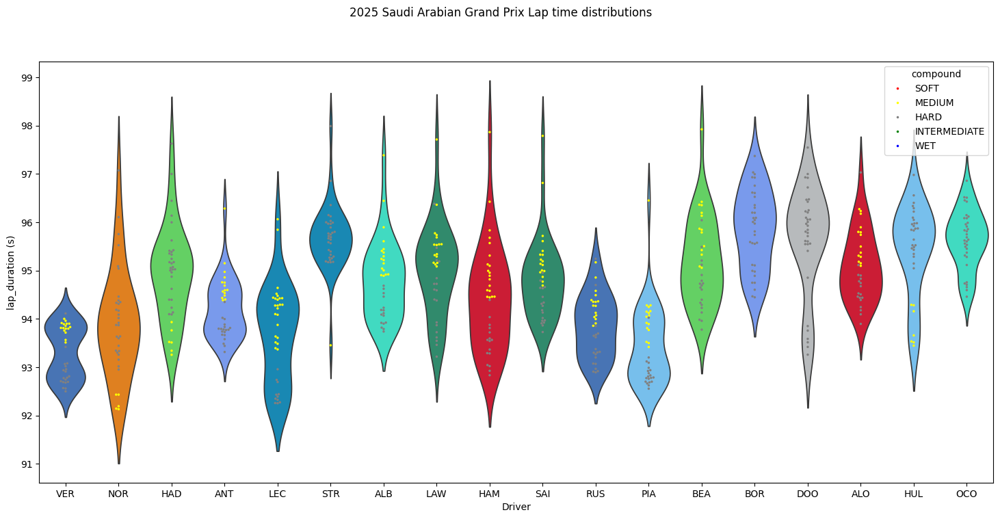

In [74]:
libraryDataF1.lap_time_distributions("2025 Saudi Arabian Grand Prix Lap time distributions",drivers,jointables.query("lap_duration<98 and lap_duration>92"))

### Speed trap

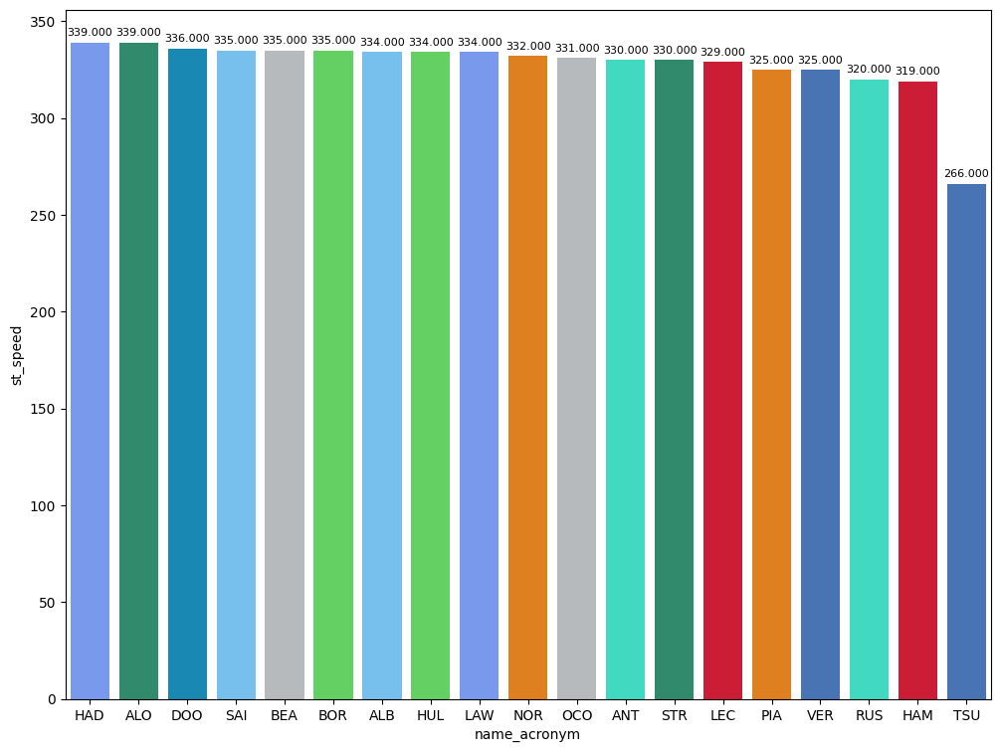

In [80]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax().dropna()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

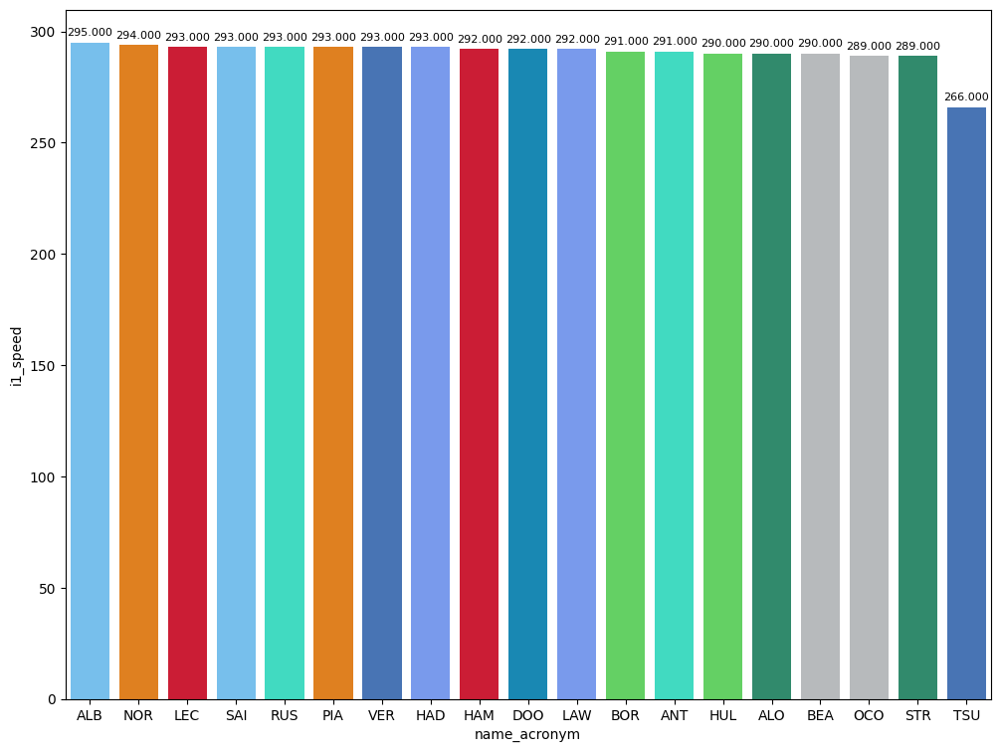

In [76]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax().dropna()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

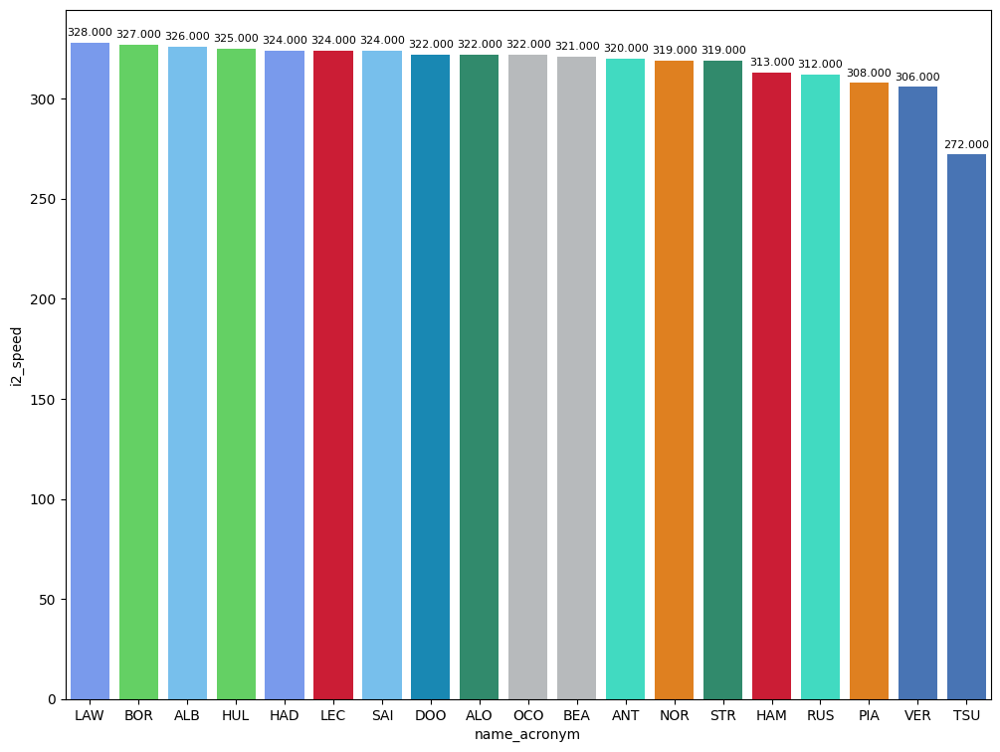

In [81]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax().dropna()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Race pace
General explanation
Explanation per teams

In [164]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 98").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
Red Bull Racing,93.415261
McLaren,93.626667
Mercedes,93.987171
Ferrari,94.099040
Williams,94.740596
Racing Bulls,94.932414
Aston Martin,95.402660
Haas F1 Team,95.534370
Kick Sauber,95.588304


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1
General explanation

In [165]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 98").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
Red Bull Racing,34.239087
McLaren,34.509200
Ferrari,34.717600
Mercedes,34.832244
Racing Bulls,35.274948
Williams,35.347246
Aston Martin,35.391745
Kick Sauber,35.535321
Alpine,35.654370


#### Sector 2
General explanation

In [168]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 98").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
Mercedes,29.401415
McLaren,29.409289
Red Bull Racing,29.432435
Ferrari,29.529800
Williams,29.625263
Racing Bulls,29.728483
Aston Martin,29.824745
Alpine,29.946074
Kick Sauber,29.985607


#### Sector 3
General explanation

In [169]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 98").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
McLaren,29.708178
Red Bull Racing,29.743739
Mercedes,29.753512
Williams,29.768088
Ferrari,29.851640
Haas F1 Team,29.884848
Racing Bulls,29.928983
Alpine,30.038185
Kick Sauber,30.063143


### Long runs

In [93]:
MINIMUN_SECONDS = 92
MAXIMUM_SECONDS = 98

#### Red Bull Racing

In [94]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1258,10022,1,22,1,2,MEDIUM,0
6,1258,10022,1,1,1,19,MEDIUM,0
25,1258,10022,2,1,20,40,HARD,0


In [95]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
52,Max VERSTAPPEN,MEDIUM,2025-04-20T17:11:39.665000+00:00,4,34.345,29.659,29.827,93.831
70,Max VERSTAPPEN,MEDIUM,2025-04-20T17:13:13.310000+00:00,5,34.376,29.547,29.793,93.716
88,Max VERSTAPPEN,MEDIUM,2025-04-20T17:14:47.168000+00:00,6,34.330,29.438,29.796,93.564
106,Max VERSTAPPEN,MEDIUM,2025-04-20T17:16:20.706000+00:00,7,34.250,29.473,29.788,93.511
124,Max VERSTAPPEN,MEDIUM,2025-04-20T17:17:54.278000+00:00,8,34.507,29.479,29.905,93.891
142,Max VERSTAPPEN,MEDIUM,2025-04-20T17:19:28.108000+00:00,9,34.349,29.492,29.957,93.798
160,Max VERSTAPPEN,MEDIUM,2025-04-20T17:21:01.873000+00:00,10,34.306,29.503,30.004,93.813
178,Max VERSTAPPEN,MEDIUM,2025-04-20T17:22:35.763000+00:00,11,34.321,29.671,30.009,94.001
196,Max VERSTAPPEN,MEDIUM,2025-04-20T17:24:09.780000+00:00,12,34.347,29.630,29.983,93.960
214,Max VERSTAPPEN,MEDIUM,2025-04-20T17:25:43.715000+00:00,13,34.361,29.563,29.932,93.856


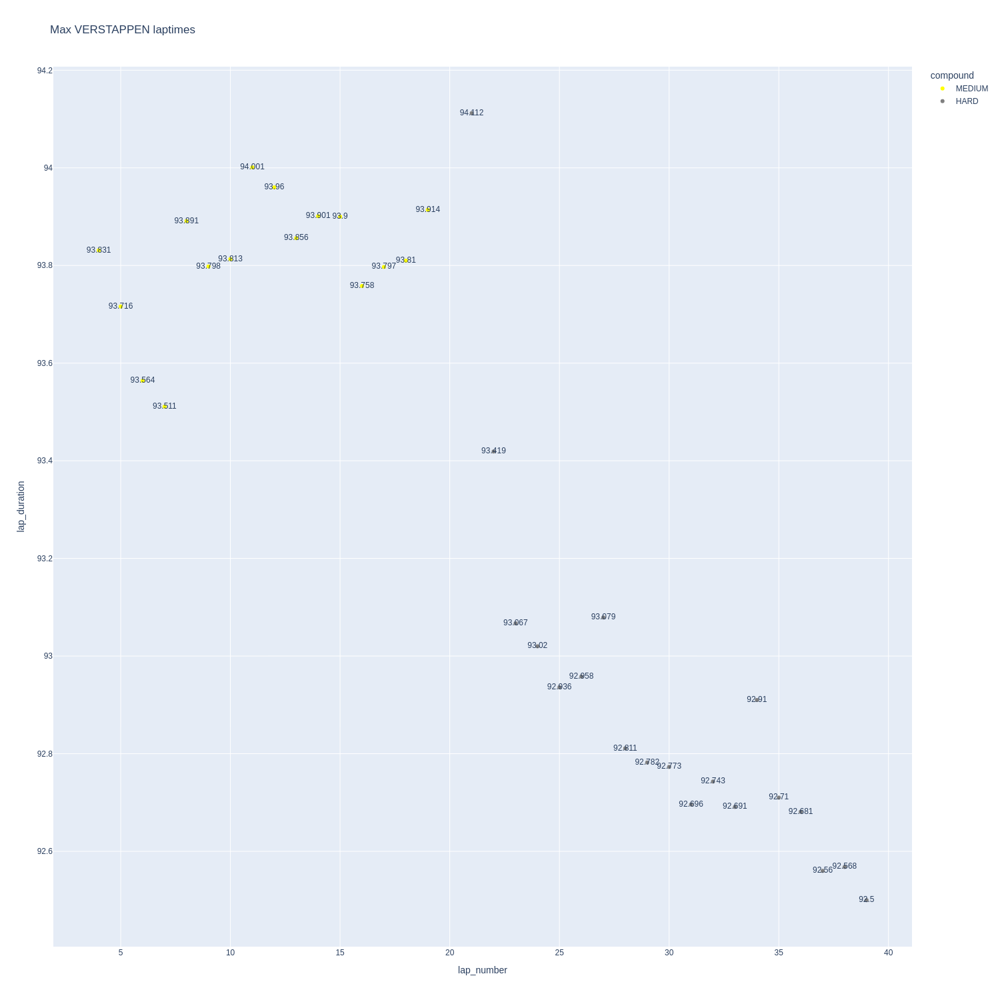

In [96]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

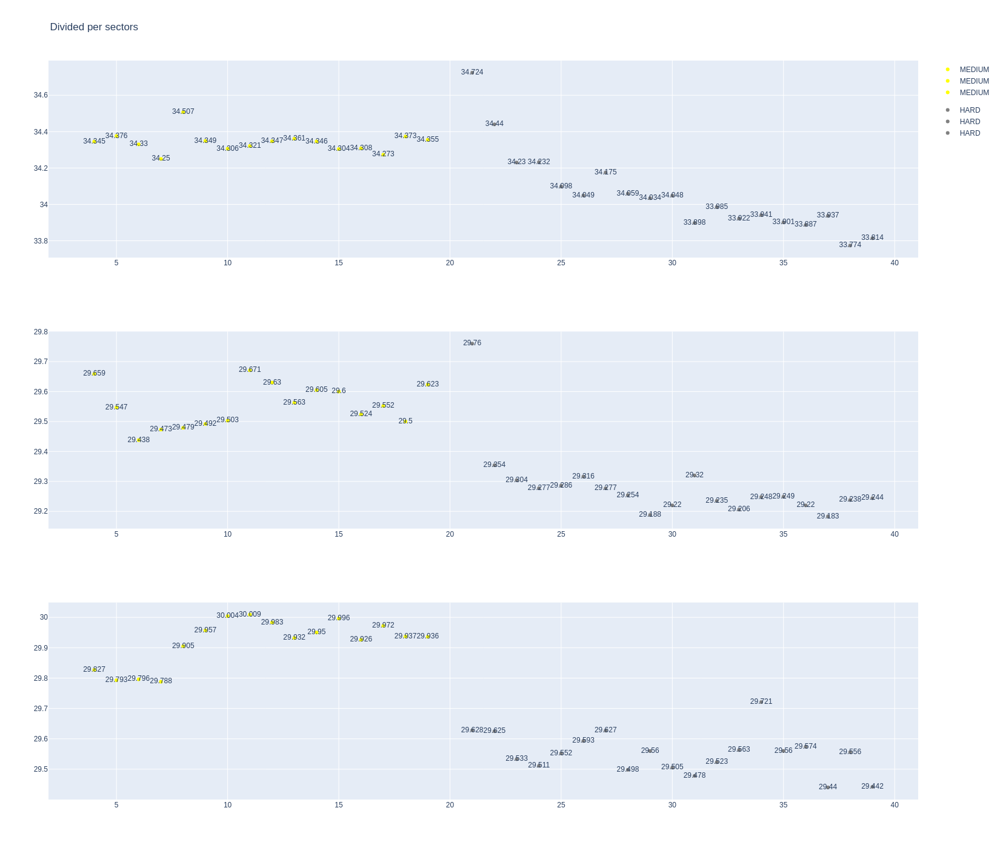

In [97]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [98]:
data = libraryDataF1.getinfolongruns(jointables,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [99]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [100]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [101]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
14,1258,10022,1,44,1,22,MEDIUM,0
15,1258,10022,1,16,1,27,MEDIUM,0
32,1258,10022,2,44,23,40,HARD,0
33,1258,10022,2,16,28,40,HARD,0


In [102]:
data = libraryDataF1.getinfolongruns(jointables,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
65,Lewis HAMILTON,MEDIUM,2025-04-20T17:11:41.114000+00:00,4,36.411,29.833,30.181,96.425
83,Lewis HAMILTON,MEDIUM,2025-04-20T17:13:17.547000+00:00,5,35.575,29.694,29.830,95.099
101,Lewis HAMILTON,MEDIUM,2025-04-20T17:14:52.707000+00:00,6,34.999,29.648,29.812,94.459
119,Lewis HAMILTON,MEDIUM,2025-04-20T17:16:27.203000+00:00,7,35.134,29.714,30.146,94.994
137,Lewis HAMILTON,MEDIUM,2025-04-20T17:18:02.075000+00:00,8,34.878,29.545,30.021,94.444
155,Lewis HAMILTON,MEDIUM,2025-04-20T17:19:36.523000+00:00,9,34.882,29.656,29.922,94.460
173,Lewis HAMILTON,MEDIUM,2025-04-20T17:21:11.050000+00:00,10,34.893,29.645,30.042,94.580
191,Lewis HAMILTON,MEDIUM,2025-04-20T17:22:45.591000+00:00,11,34.828,29.649,29.979,94.456
209,Lewis HAMILTON,MEDIUM,2025-04-20T17:24:20.072000+00:00,12,34.871,29.816,30.623,95.310
227,Lewis HAMILTON,MEDIUM,2025-04-20T17:25:55.404000+00:00,13,35.138,29.701,30.840,95.679


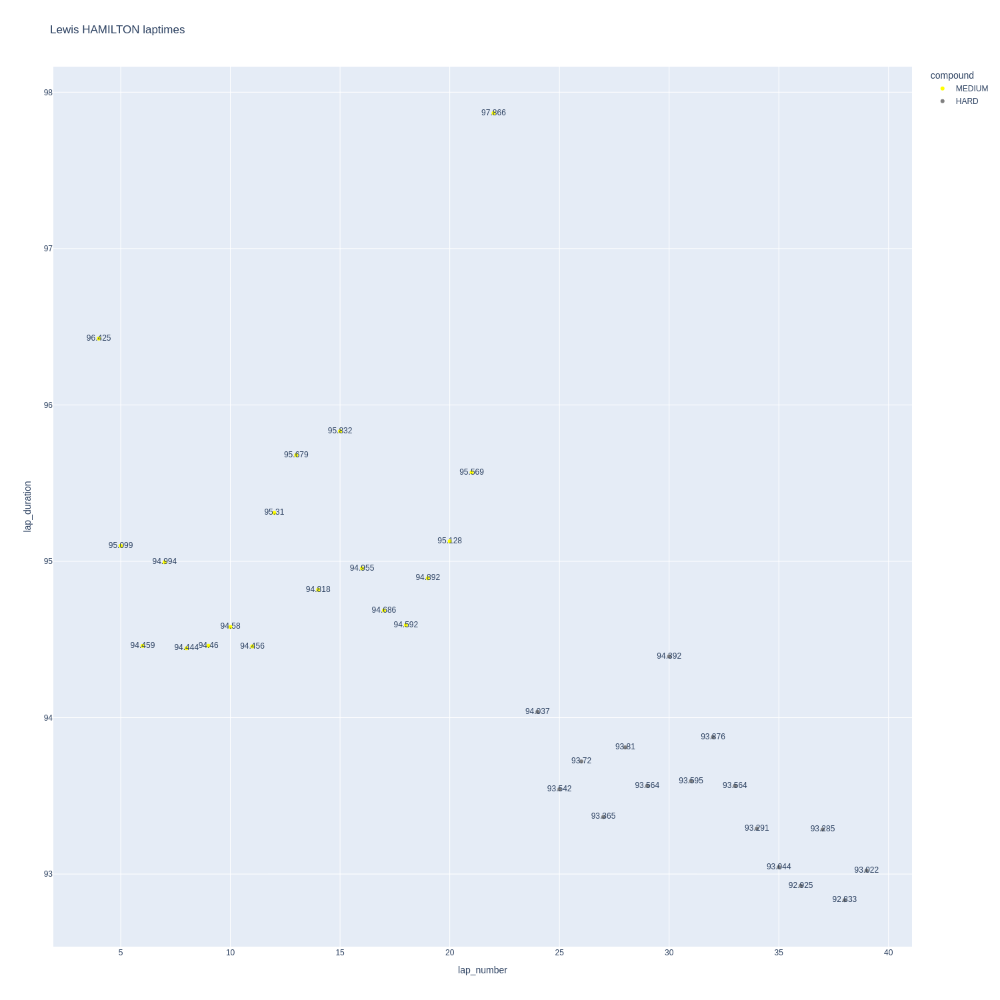

In [103]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

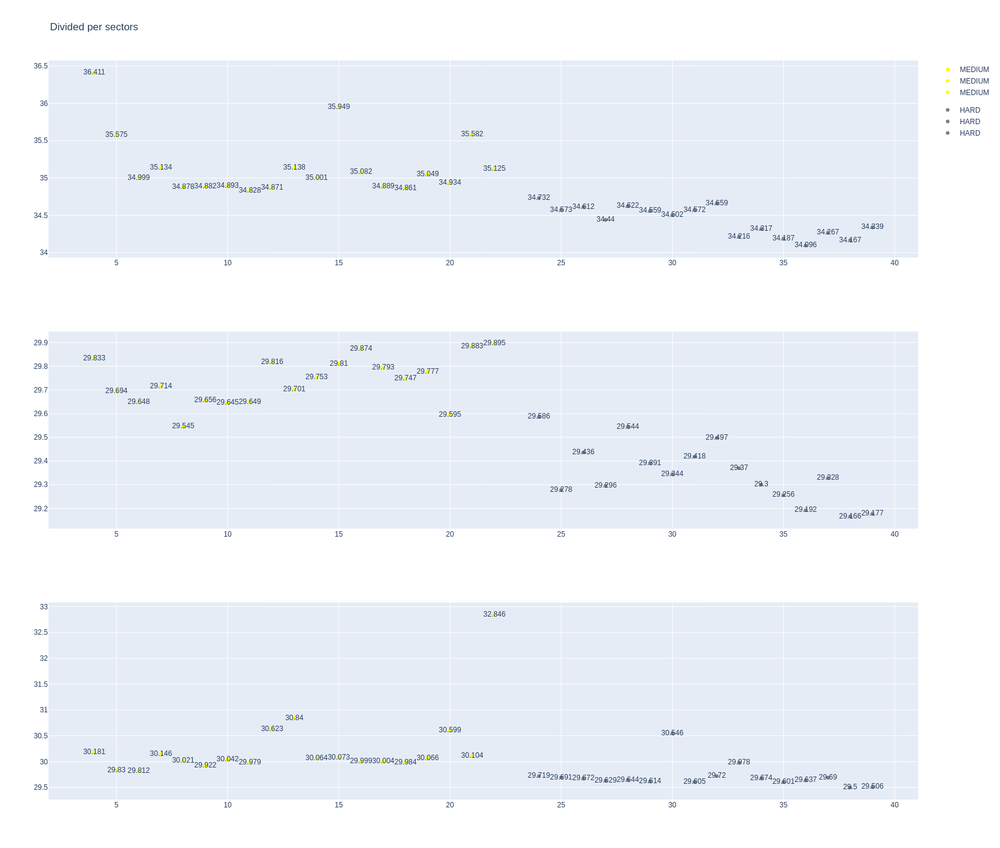

In [104]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [105]:
data = libraryDataF1.getinfolongruns(jointables,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [106]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [107]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [108]:
stintInformation.query('driver_number == 12 or driver_number == 63')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1258,10022,1,12,1,19,MEDIUM,0
12,1258,10022,1,63,1,20,MEDIUM,0
26,1258,10022,2,12,20,40,HARD,0
30,1258,10022,2,63,21,40,HARD,1


In [109]:
data = libraryDataF1.getinfolongruns(jointables,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
57,Kimi ANTONELLI,MEDIUM,2025-04-20T17:11:40.568000+00:00,4,36.531,29.718,30.035,96.284
75,Kimi ANTONELLI,MEDIUM,2025-04-20T17:13:17.035000+00:00,5,35.367,29.400,29.715,94.482
93,Kimi ANTONELLI,MEDIUM,2025-04-20T17:14:51.268000+00:00,6,35.128,29.477,29.781,94.386
111,Kimi ANTONELLI,MEDIUM,2025-04-20T17:16:25.687000+00:00,7,35.159,29.555,29.688,94.402
129,Kimi ANTONELLI,MEDIUM,2025-04-20T17:18:00.169000+00:00,8,35.086,29.619,29.893,94.598
147,Kimi ANTONELLI,MEDIUM,2025-04-20T17:19:34.773000+00:00,9,35.000,29.644,29.923,94.567
165,Kimi ANTONELLI,MEDIUM,2025-04-20T17:21:09.265000+00:00,10,34.954,29.605,29.975,94.534
183,Kimi ANTONELLI,MEDIUM,2025-04-20T17:22:43.805000+00:00,11,34.902,29.751,29.940,94.593
201,Kimi ANTONELLI,MEDIUM,2025-04-20T17:24:18.525000+00:00,12,34.847,29.683,29.903,94.433
219,Kimi ANTONELLI,MEDIUM,2025-04-20T17:25:52.936000+00:00,13,34.929,29.832,29.996,94.757


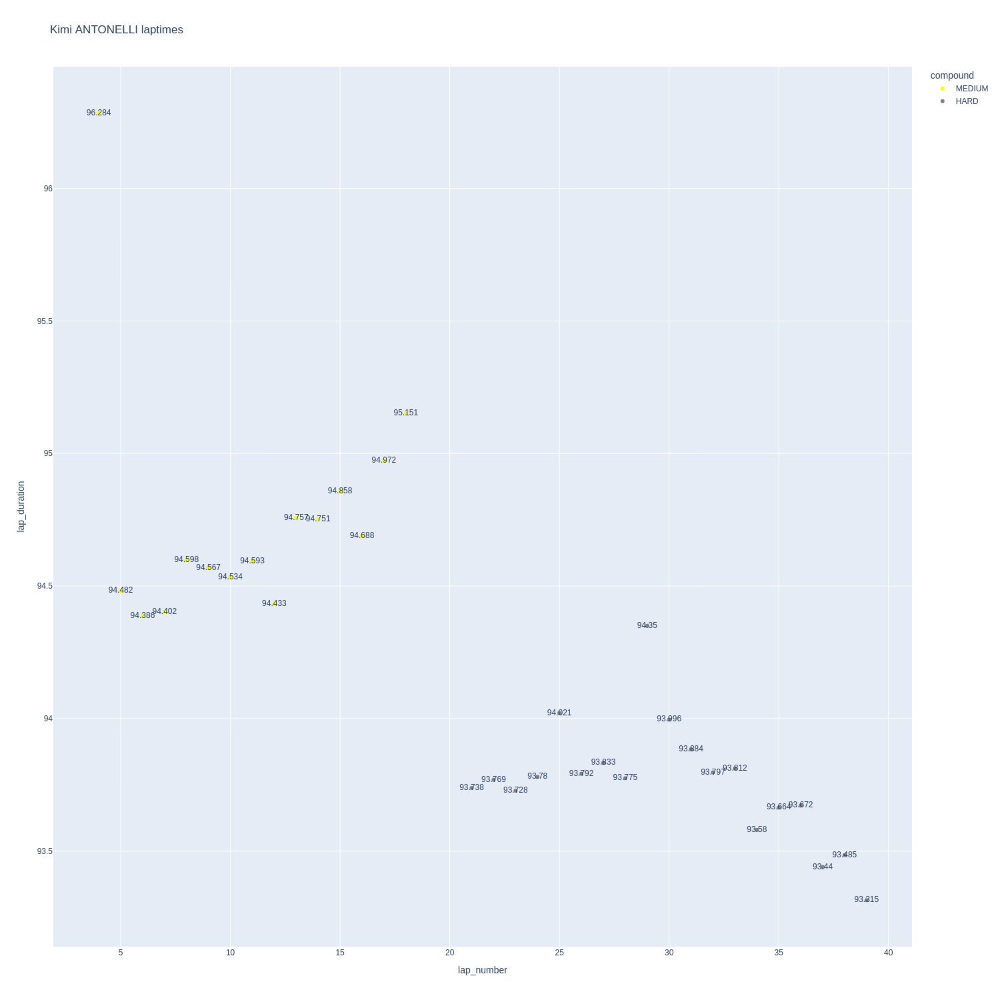

In [110]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

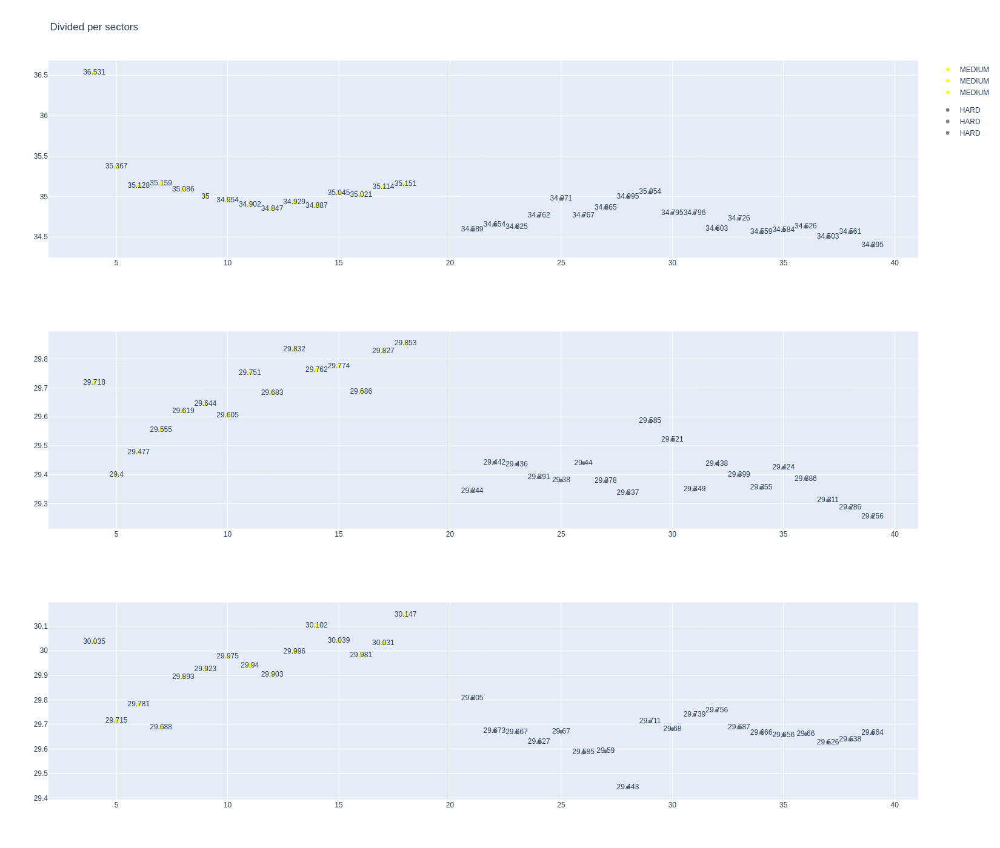

In [111]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [112]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
67,George RUSSELL,MEDIUM,2025-04-20T17:11:40.290000+00:00,4,35.754,29.477,29.939,95.170
85,George RUSSELL,MEDIUM,2025-04-20T17:13:15.426000+00:00,5,34.781,29.406,29.809,93.996
103,George RUSSELL,MEDIUM,2025-04-20T17:14:49.330000+00:00,6,34.730,29.526,29.817,94.073
121,George RUSSELL,MEDIUM,2025-04-20T17:16:23.531000+00:00,7,34.794,29.572,29.672,94.038
139,George RUSSELL,MEDIUM,2025-04-20T17:17:57.575000+00:00,8,34.672,29.477,29.708,93.857
157,George RUSSELL,MEDIUM,2025-04-20T17:19:31.351000+00:00,9,34.741,29.410,29.756,93.907
175,George RUSSELL,MEDIUM,2025-04-20T17:21:05.389000+00:00,10,34.711,29.500,29.915,94.126
193,George RUSSELL,MEDIUM,2025-04-20T17:22:39.450000+00:00,11,34.910,29.560,29.799,94.269
211,George RUSSELL,MEDIUM,2025-04-20T17:24:13.681000+00:00,12,34.825,29.591,29.858,94.274
229,George RUSSELL,MEDIUM,2025-04-20T17:25:47.942000+00:00,13,34.862,29.505,29.986,94.353


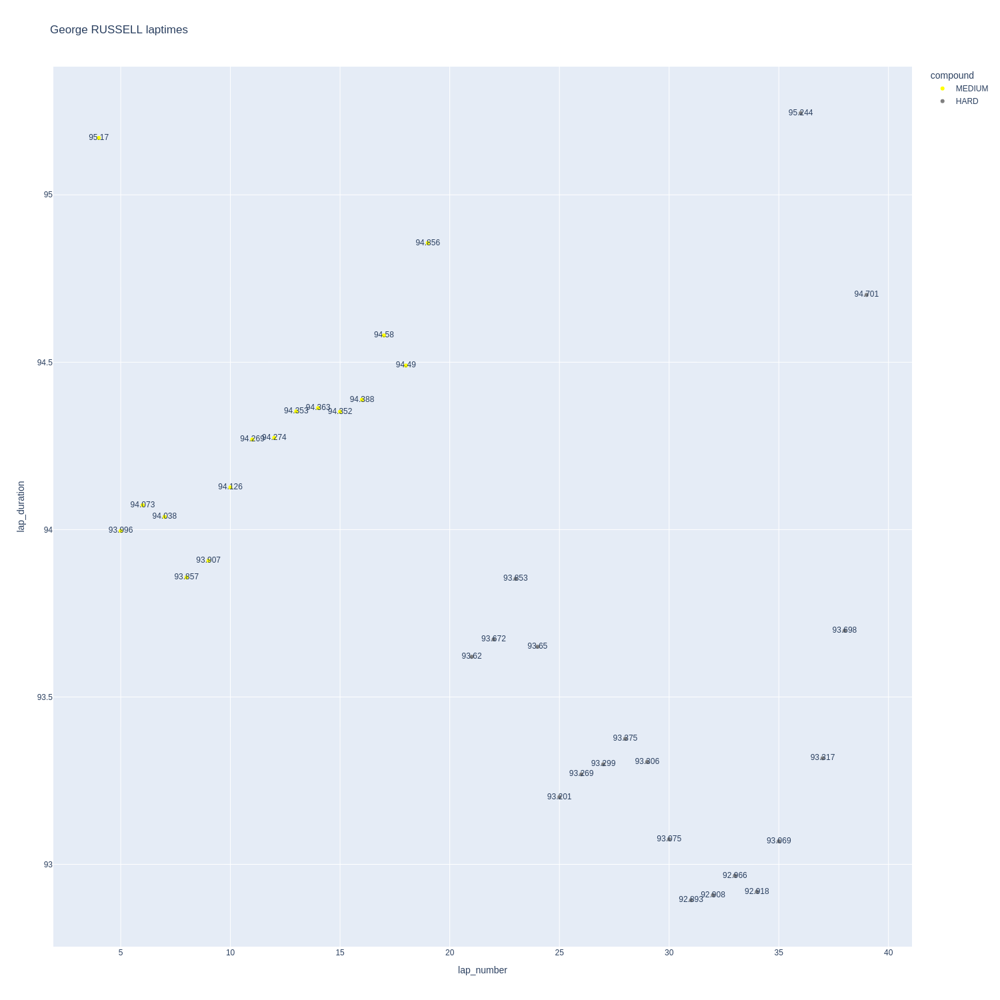

In [113]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

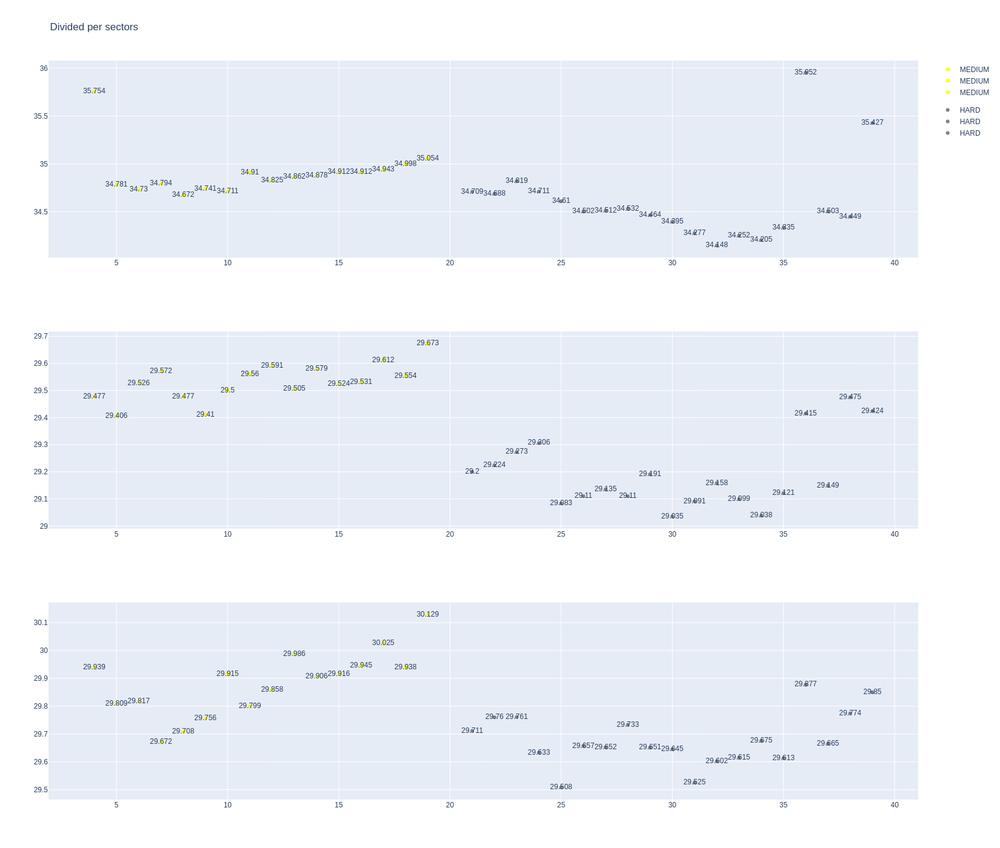

In [114]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [115]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1258,10022,1,81,1,19,MEDIUM,0
17,1258,10022,1,4,1,32,HARD,0
27,1258,10022,2,81,20,41,HARD,0
37,1258,10022,2,4,33,41,MEDIUM,0


In [116]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
53,Lando NORRIS,HARD,2025-04-20T17:11:41.614000+00:00,4,36.959,30.137,29.977,97.073
71,Lando NORRIS,HARD,2025-04-20T17:13:18.711000+00:00,5,35.897,30.011,29.617,95.525
89,Lando NORRIS,HARD,2025-04-20T17:14:54.199000+00:00,6,35.653,29.720,29.669,95.042
107,Lando NORRIS,HARD,2025-04-20T17:16:29.266000+00:00,7,34.953,29.708,29.720,94.381
125,Lando NORRIS,HARD,2025-04-20T17:18:03.685000+00:00,8,35.014,29.731,29.716,94.461
143,Lando NORRIS,HARD,2025-04-20T17:19:38.004000+00:00,9,34.861,29.644,29.842,94.347
161,Lando NORRIS,HARD,2025-04-20T17:21:12.411000+00:00,10,34.810,29.707,29.814,94.331
179,Lando NORRIS,HARD,2025-04-20T17:22:46.826000+00:00,11,34.799,29.494,29.795,94.088
197,Lando NORRIS,HARD,2025-04-20T17:24:20.822000+00:00,12,34.882,29.515,29.914,94.311
215,Lando NORRIS,HARD,2025-04-20T17:25:55.186000+00:00,13,35.878,29.550,30.326,95.754


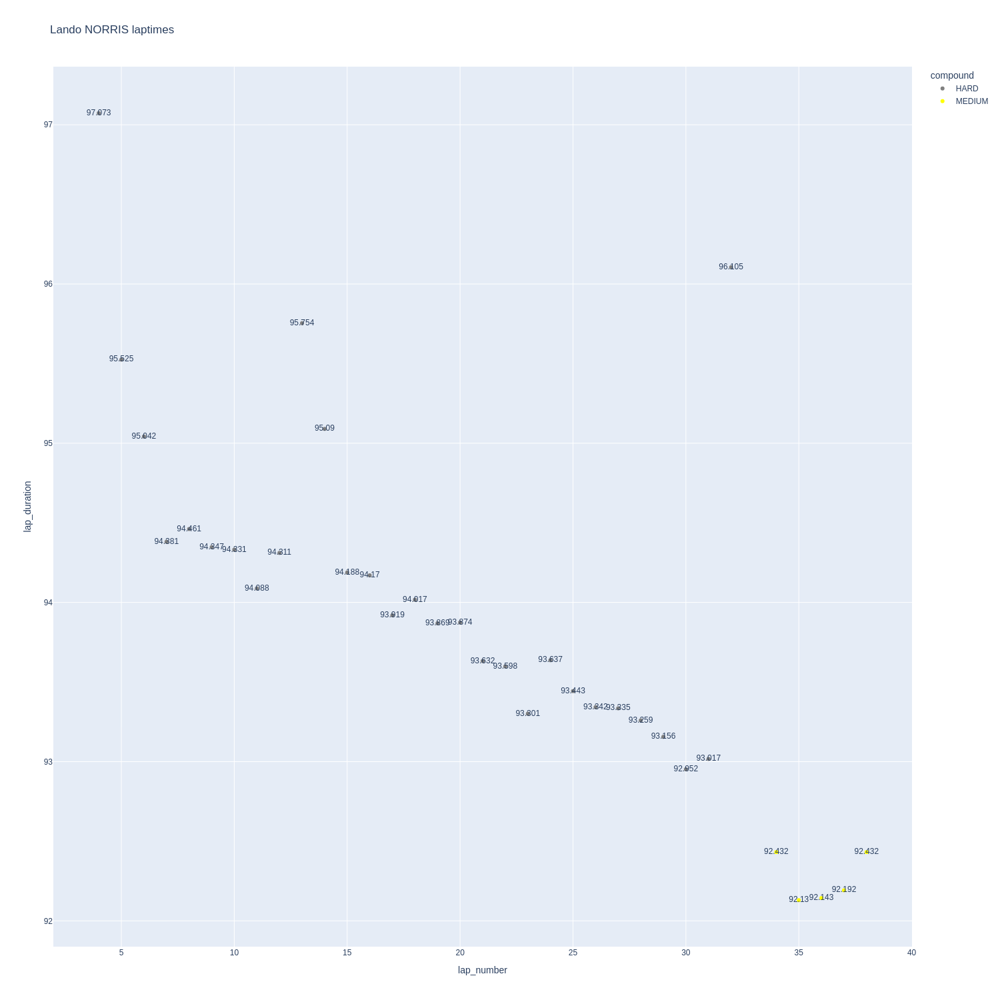

In [117]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

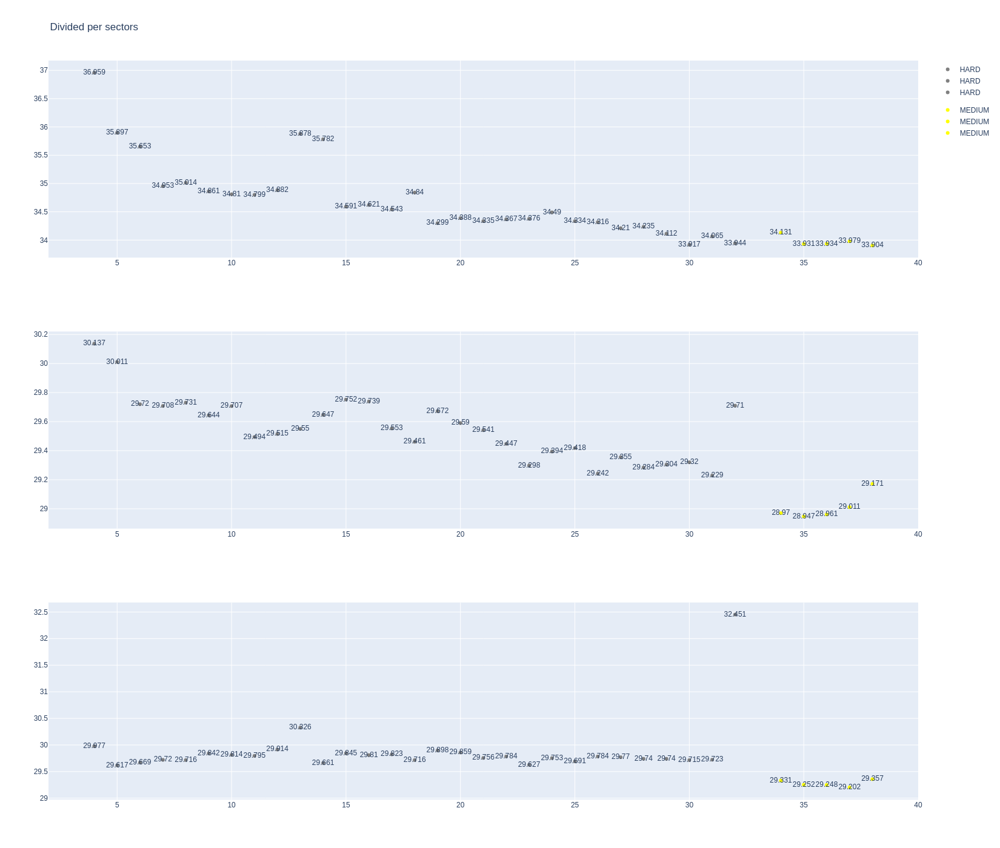

In [118]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [119]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
68,Oscar PIASTRI,MEDIUM,2025-04-20T17:11:40.227000+00:00,4,34.829,29.607,29.811,94.247
86,Oscar PIASTRI,MEDIUM,2025-04-20T17:13:14.461000+00:00,5,34.522,29.411,29.485,93.418
104,Oscar PIASTRI,MEDIUM,2025-04-20T17:14:47.751000+00:00,6,34.783,29.453,29.681,93.917
122,Oscar PIASTRI,MEDIUM,2025-04-20T17:16:21.737000+00:00,7,34.373,29.422,29.728,93.523
140,Oscar PIASTRI,MEDIUM,2025-04-20T17:17:55.185000+00:00,8,34.442,29.510,29.941,93.893
158,Oscar PIASTRI,MEDIUM,2025-04-20T17:19:29.164000+00:00,9,34.313,29.439,29.748,93.500
176,Oscar PIASTRI,MEDIUM,2025-04-20T17:21:02.686000+00:00,10,34.605,29.507,29.933,94.045
194,Oscar PIASTRI,MEDIUM,2025-04-20T17:22:36.653000+00:00,11,34.580,29.489,29.739,93.808
212,Oscar PIASTRI,MEDIUM,2025-04-20T17:24:10.609000+00:00,12,34.622,29.451,29.697,93.770
230,Oscar PIASTRI,MEDIUM,2025-04-20T17:25:44.247000+00:00,13,34.793,29.535,29.952,94.280


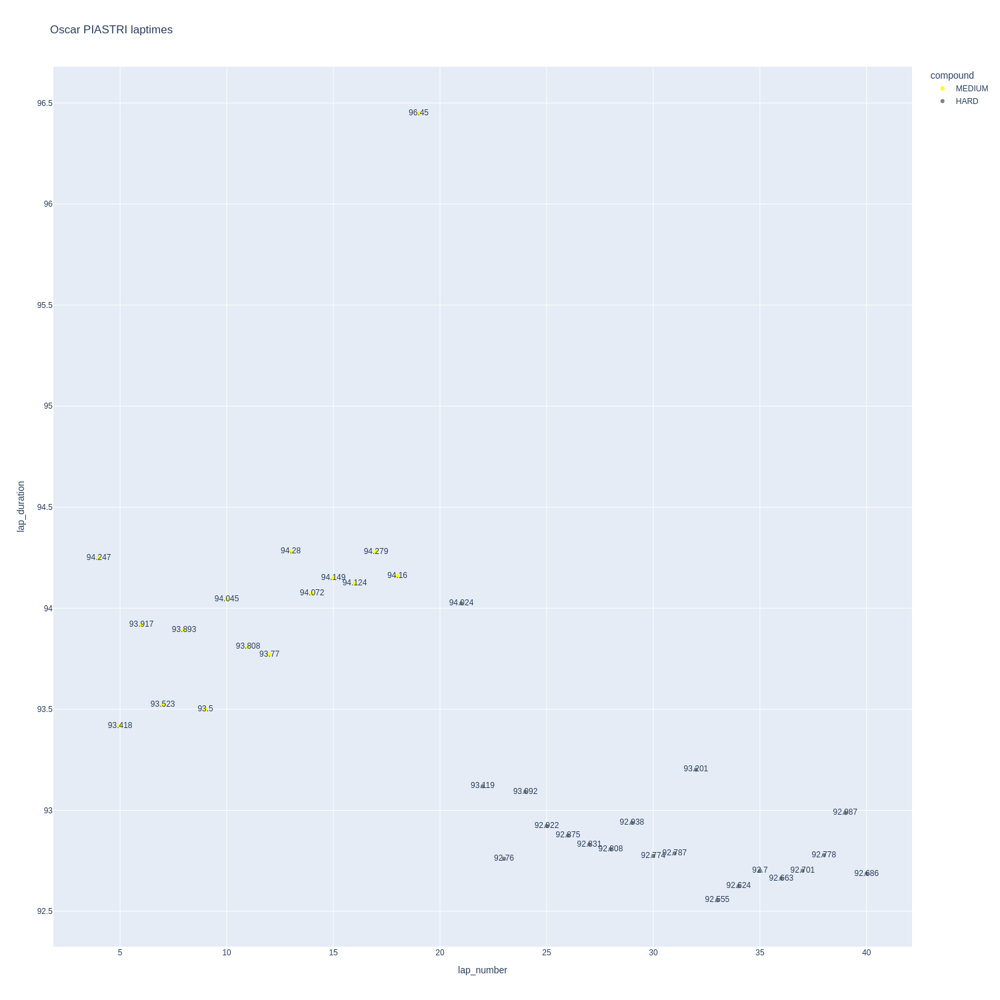

In [120]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

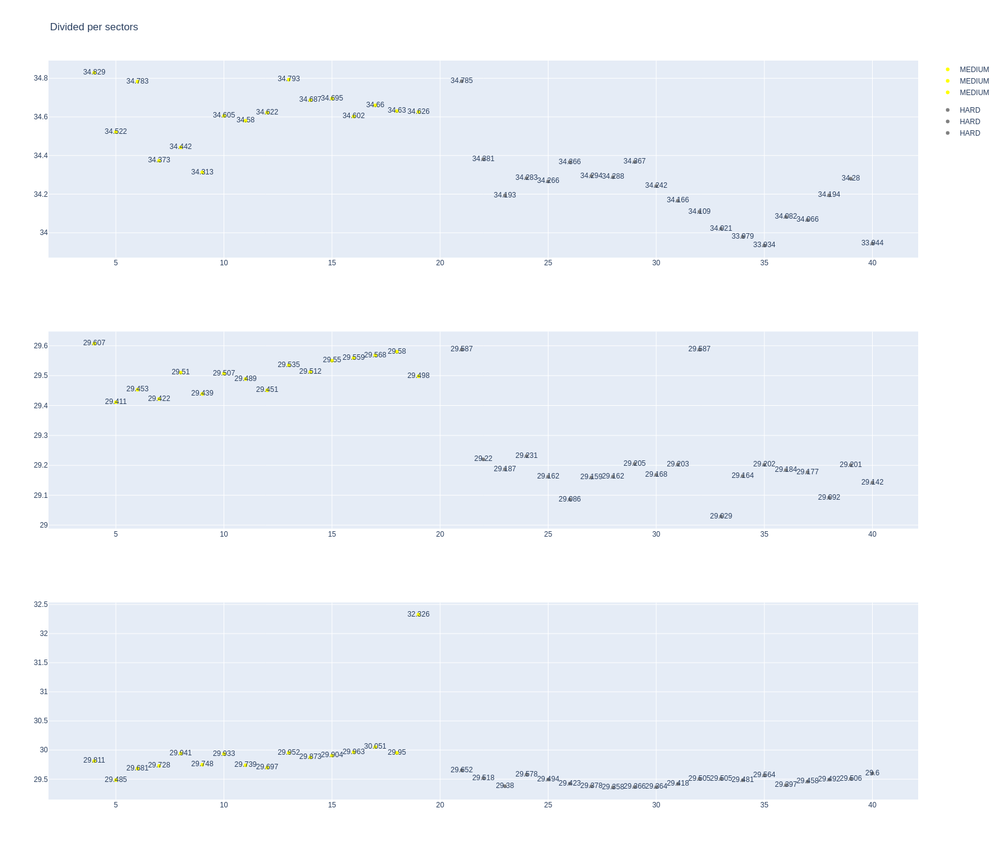

In [121]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [122]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1258,10022,1,14,1,19,MEDIUM,1
19,1258,10022,1,18,1,36,HARD,1
24,1258,10022,2,14,20,39,HARD,1
38,1258,10022,2,18,37,39,MEDIUM,1


In [123]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
76,Fernando ALONSO,MEDIUM,2025-04-20T17:13:20.533000+00:00,5,36.197,29.951,30.028,96.176
94,Fernando ALONSO,MEDIUM,2025-04-20T17:14:56.684000+00:00,6,35.542,29.913,29.915,95.370
112,Fernando ALONSO,MEDIUM,2025-04-20T17:16:31.937000+00:00,7,35.282,29.877,29.993,95.152
130,Fernando ALONSO,MEDIUM,2025-04-20T17:18:07.109000+00:00,8,35.295,29.927,29.960,95.182
148,Fernando ALONSO,MEDIUM,2025-04-20T17:19:42.285000+00:00,9,35.407,29.948,29.953,95.308
166,Fernando ALONSO,MEDIUM,2025-04-20T17:21:17.531000+00:00,10,35.158,29.816,30.124,95.098
184,Fernando ALONSO,MEDIUM,2025-04-20T17:22:52.650000+00:00,11,35.569,29.748,30.422,95.739
202,Fernando ALONSO,MEDIUM,2025-04-20T17:24:28.520000+00:00,12,35.465,30.012,30.315,95.792
220,Fernando ALONSO,MEDIUM,2025-04-20T17:26:04.287000+00:00,13,35.543,29.944,30.409,95.896
238,Fernando ALONSO,MEDIUM,2025-04-20T17:27:40.188000+00:00,14,35.697,30.022,30.513,96.232


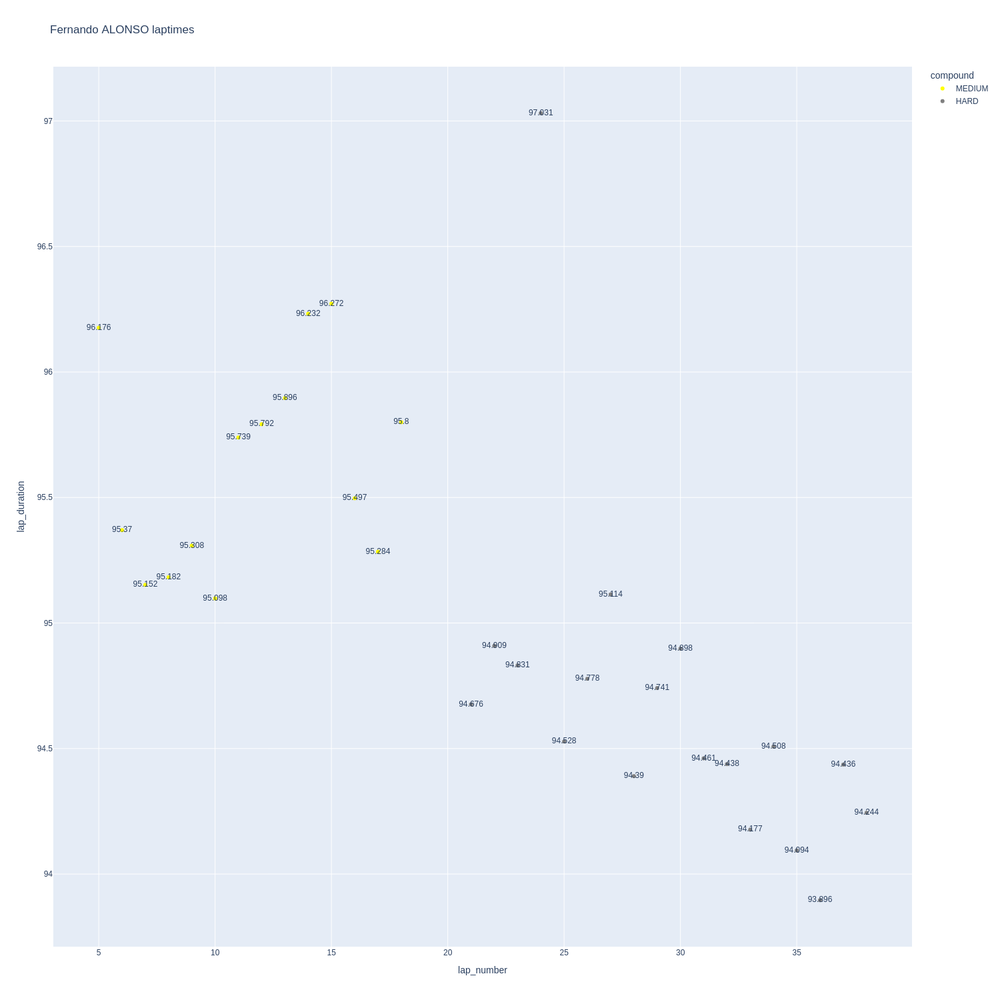

In [124]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

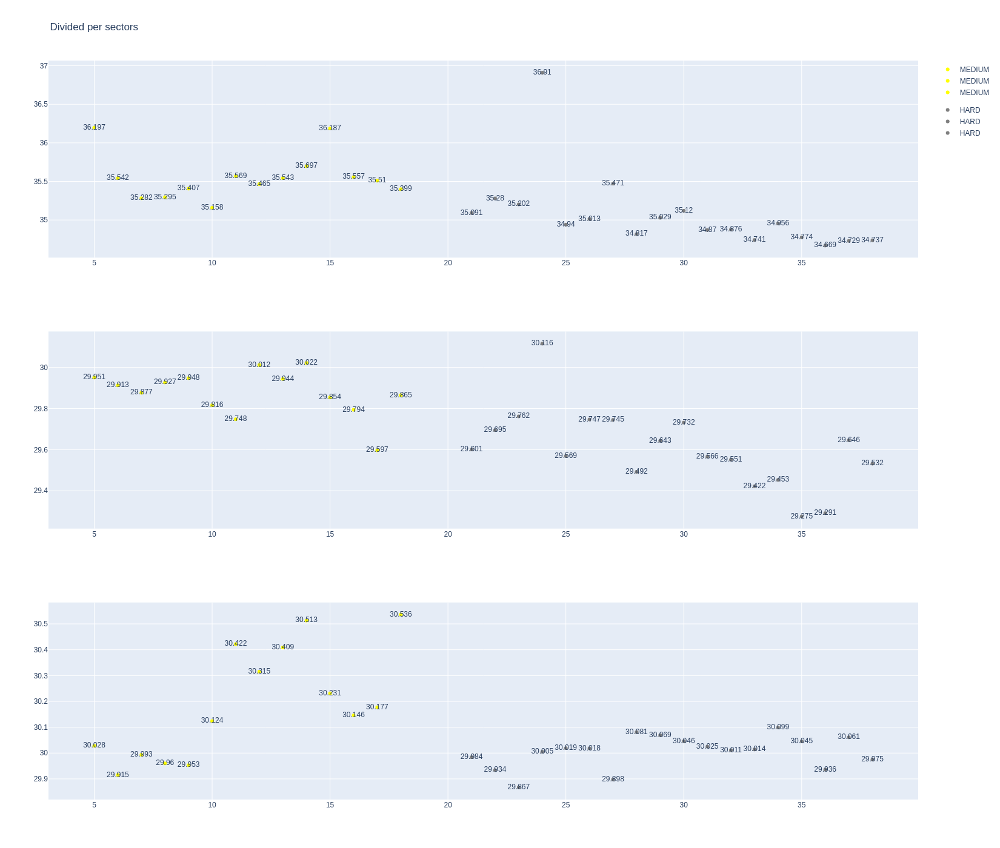

In [125]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [126]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
60,Lance STROLL,HARD,2025-04-20T17:11:44.117000+00:00,4,36.967,30.473,30.550,97.990
78,Lance STROLL,HARD,2025-04-20T17:13:22.143000+00:00,5,36.219,30.071,30.065,96.355
96,Lance STROLL,HARD,2025-04-20T17:14:58.364000+00:00,6,35.981,29.987,30.024,95.992
114,Lance STROLL,HARD,2025-04-20T17:16:34.453000+00:00,7,35.427,30.012,29.986,95.425
132,Lance STROLL,HARD,2025-04-20T17:18:09.841000+00:00,8,35.488,29.979,30.119,95.586
150,Lance STROLL,HARD,2025-04-20T17:19:45.514000+00:00,9,35.619,29.929,30.235,95.783
168,Lance STROLL,HARD,2025-04-20T17:21:21.210000+00:00,10,35.425,29.964,30.175,95.564
186,Lance STROLL,HARD,2025-04-20T17:22:56.681000+00:00,11,35.455,29.969,30.290,95.714
204,Lance STROLL,HARD,2025-04-20T17:24:32.474000+00:00,12,35.331,30.015,30.802,96.148
222,Lance STROLL,HARD,2025-04-20T17:26:08.595000+00:00,13,35.530,29.923,30.348,95.801


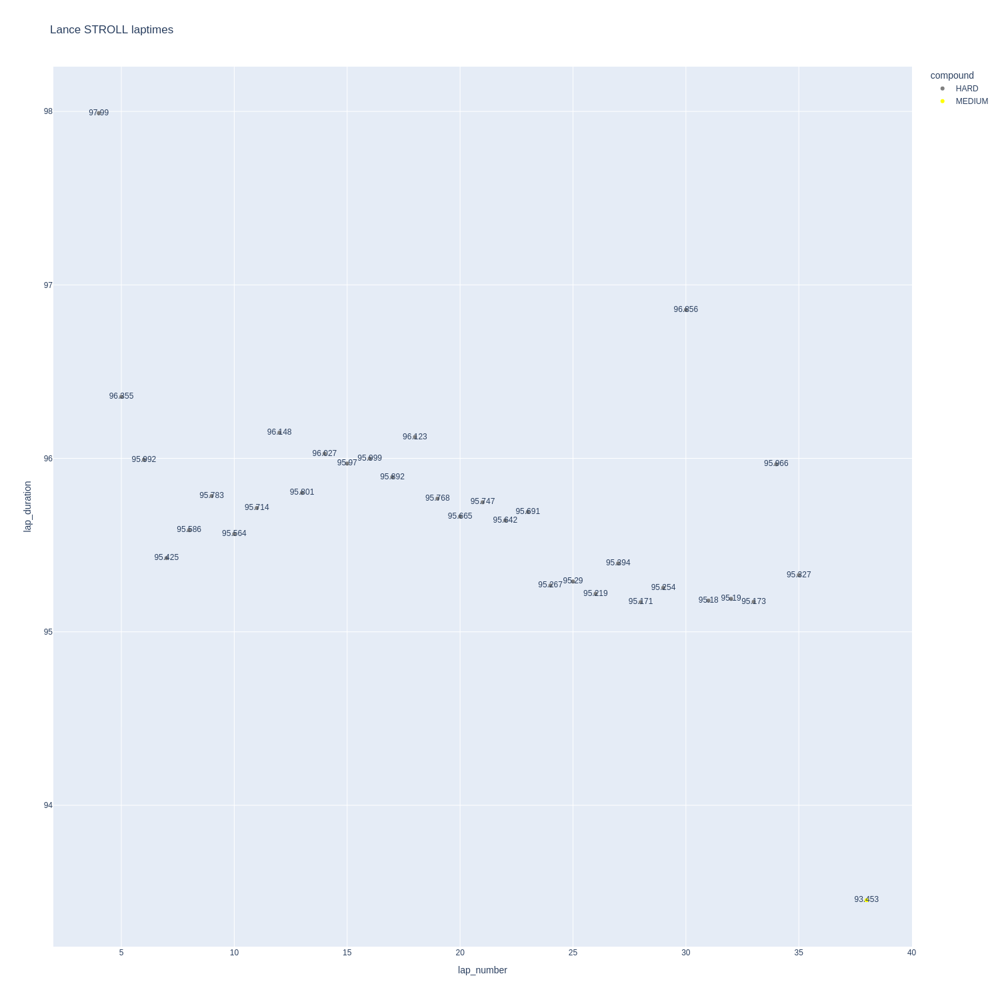

In [127]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

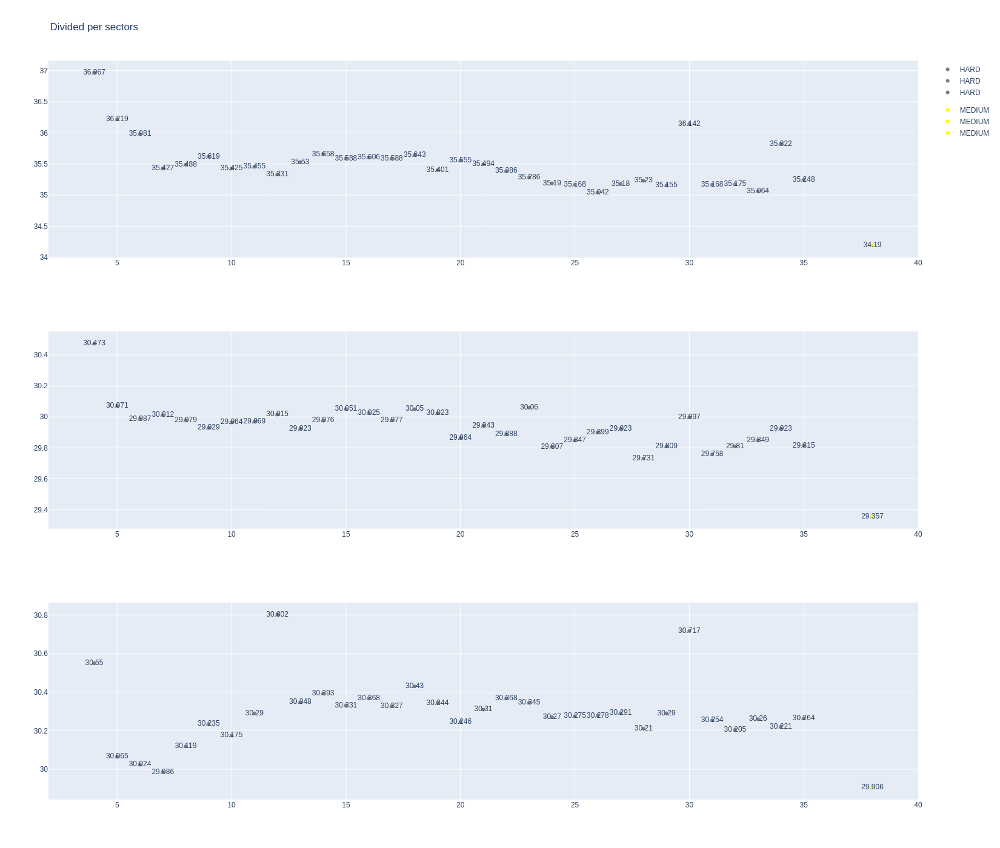

In [128]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [129]:
stintInformation.query('driver_number == 6 or driver_number == 30')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1258,10022,1,30,1,20,MEDIUM,0
18,1258,10022,1,6,1,32,HARD,0
28,1258,10022,2,30,21,39,HARD,2
36,1258,10022,2,6,33,40,MEDIUM,0


In [130]:
data = libraryDataF1.getinfolongruns(jointables,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
63,Liam LAWSON,MEDIUM,2025-04-20T17:11:43.067000+00:00,4,37.011,30.519,30.183,97.713
81,Liam LAWSON,MEDIUM,2025-04-20T17:13:20.830000+00:00,5,36.342,29.992,30.028,96.362
99,Liam LAWSON,MEDIUM,2025-04-20T17:14:57.137000+00:00,6,35.761,29.957,29.827,95.545
117,Liam LAWSON,MEDIUM,2025-04-20T17:16:32.750000+00:00,7,35.516,29.993,29.618,95.127
135,Liam LAWSON,MEDIUM,2025-04-20T17:18:07.870000+00:00,8,35.290,29.939,29.856,95.085
153,Liam LAWSON,MEDIUM,2025-04-20T17:19:42.973000+00:00,9,35.486,29.990,29.843,95.319
171,Liam LAWSON,MEDIUM,2025-04-20T17:21:18.266000+00:00,10,35.480,29.970,30.086,95.536
189,Liam LAWSON,MEDIUM,2025-04-20T17:22:53.713000+00:00,11,35.557,30.066,30.113,95.736
207,Liam LAWSON,MEDIUM,2025-04-20T17:24:29.459000+00:00,12,35.412,30.075,30.055,95.542
225,Liam LAWSON,MEDIUM,2025-04-20T17:26:05.072000+00:00,13,35.697,30.002,29.987,95.686


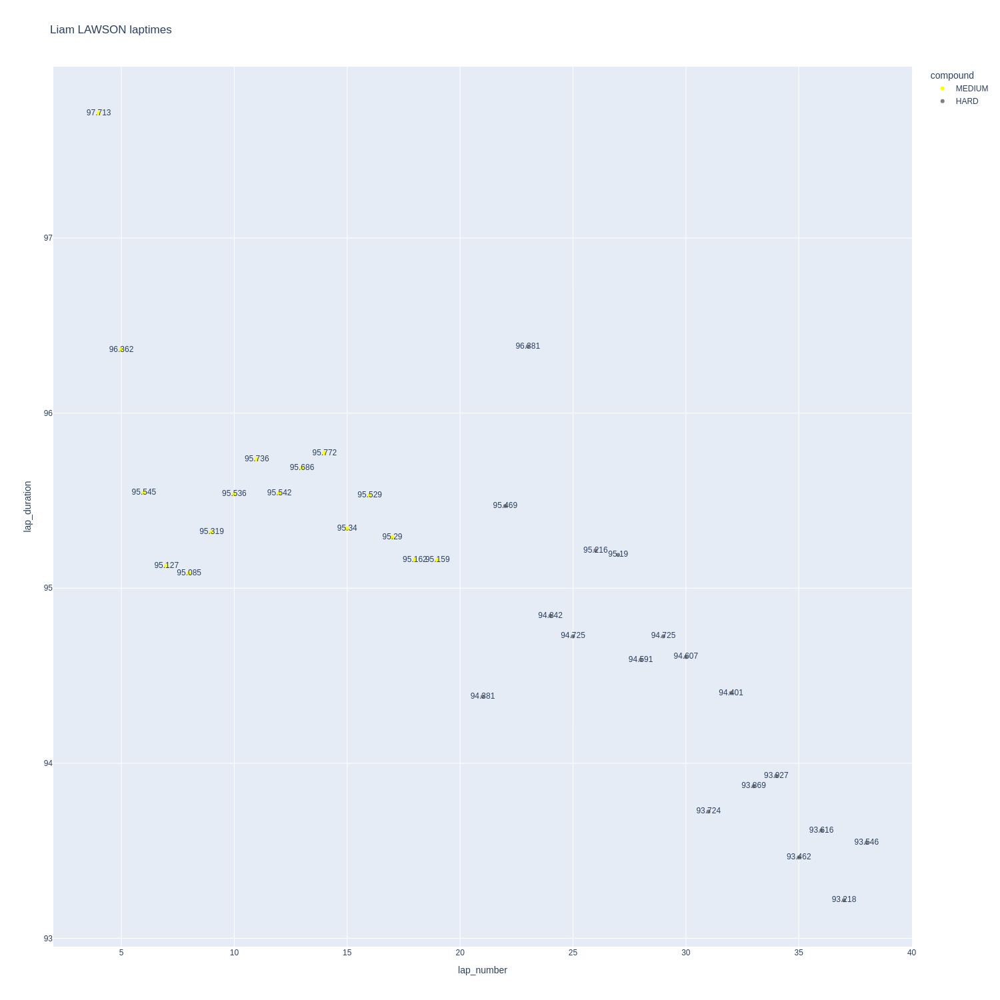

In [131]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

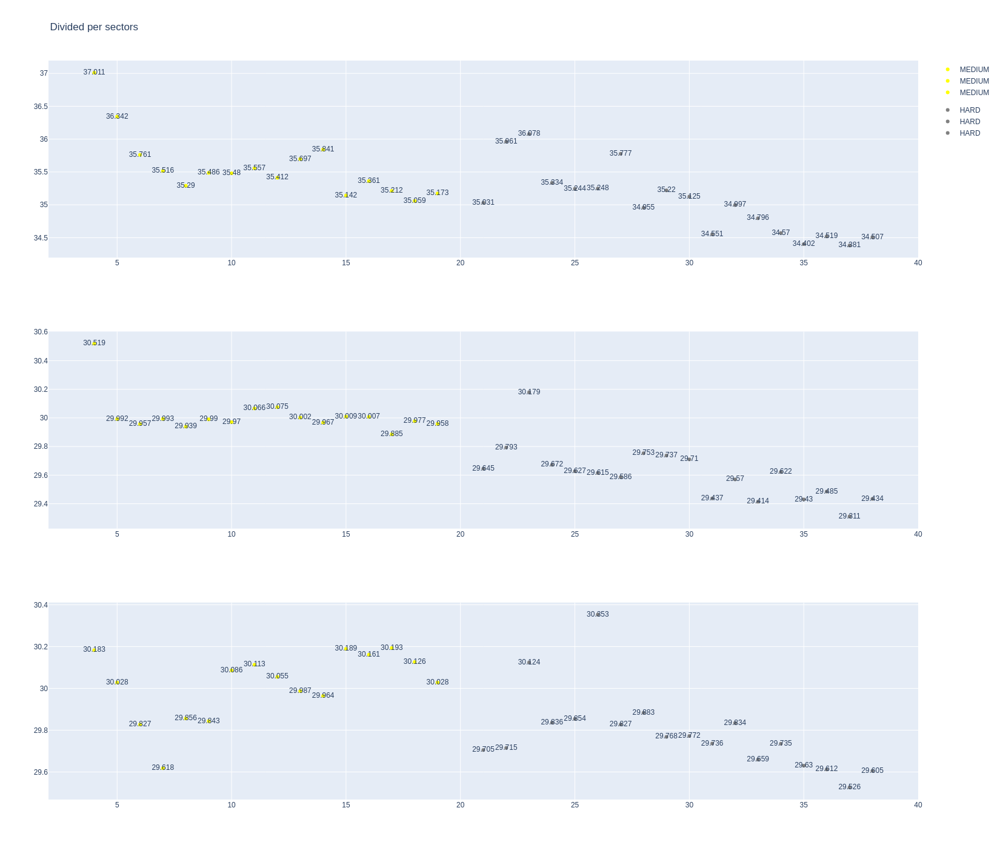

In [132]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [133]:
data = libraryDataF1.getinfolongruns(jointables,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
55,Isack HADJAR,HARD,2025-04-20T17:11:42.655000+00:00,4,36.861,30.452,30.314,97.627
73,Isack HADJAR,HARD,2025-04-20T17:13:20.268000+00:00,5,35.743,29.918,29.963,95.624
91,Isack HADJAR,HARD,2025-04-20T17:14:56.012000+00:00,6,35.475,29.828,29.700,95.003
109,Isack HADJAR,HARD,2025-04-20T17:16:30.953000+00:00,7,35.495,29.918,29.940,95.353
127,Isack HADJAR,HARD,2025-04-20T17:18:06.232000+00:00,8,35.423,29.857,29.963,95.243
145,Isack HADJAR,HARD,2025-04-20T17:19:41.598000+00:00,9,35.333,29.812,29.817,94.962
163,Isack HADJAR,HARD,2025-04-20T17:21:16.484000+00:00,10,35.318,29.939,30.129,95.386
181,Isack HADJAR,HARD,2025-04-20T17:22:51.916000+00:00,11,35.283,29.845,30.021,95.149
199,Isack HADJAR,HARD,2025-04-20T17:24:27.147000+00:00,12,35.238,29.893,30.199,95.330
217,Isack HADJAR,HARD,2025-04-20T17:26:02.343000+00:00,13,35.139,29.878,30.055,95.072


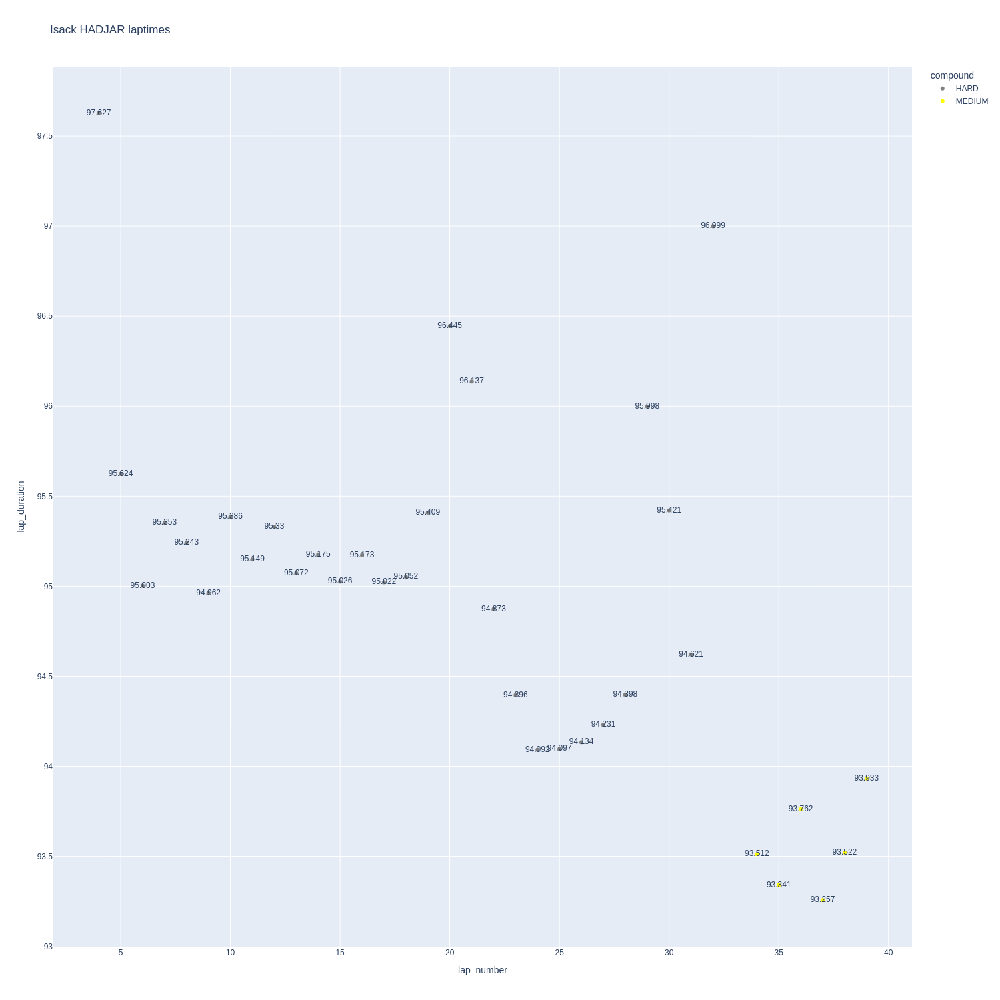

In [134]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

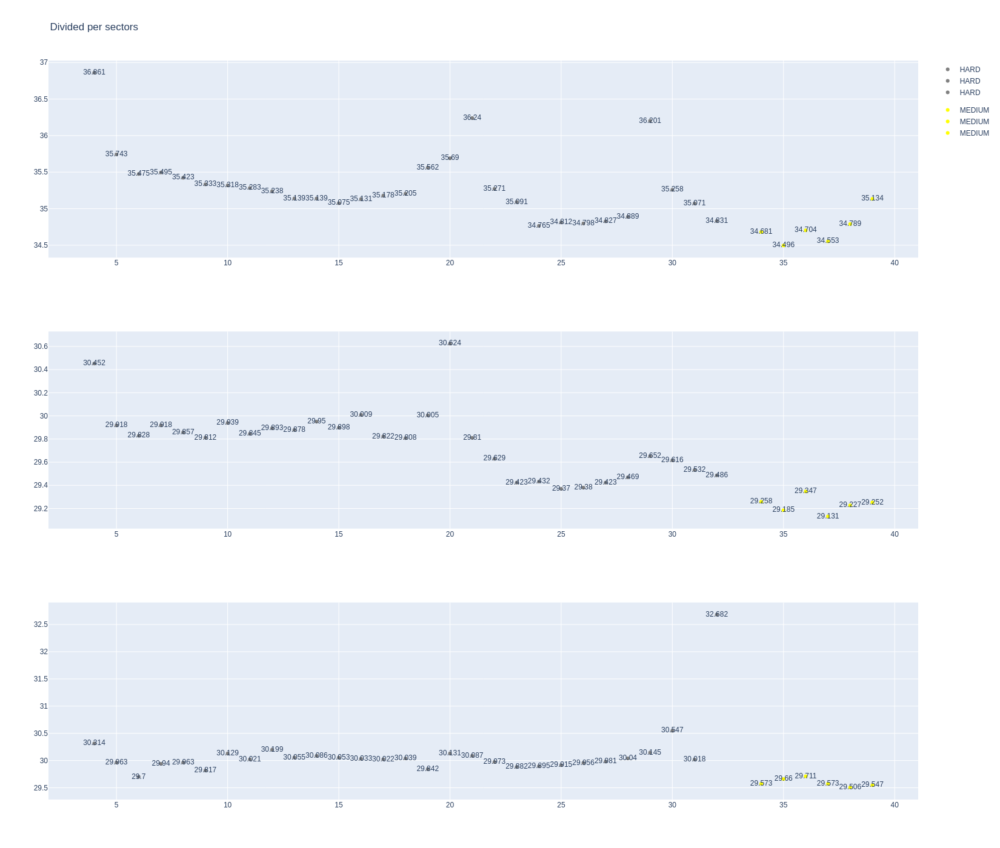

In [135]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [136]:
stintInformation.query('driver_number == 31 or driver_number == 87')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1258,10022,1,31,1,1,MEDIUM,0
5,1258,10022,1,87,1,18,MEDIUM,0
22,1258,10022,2,31,2,39,HARD,0
23,1258,10022,2,87,19,39,HARD,0


In [137]:
data = libraryDataF1.getinfolongruns(jointables,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
82,Esteban OCON,HARD,2025-04-20T17:13:23.611000+00:00,5,36.475,30.406,29.978,96.859
100,Esteban OCON,HARD,2025-04-20T17:15:00.428000+00:00,6,36.068,30.000,29.889,95.957
118,Esteban OCON,HARD,2025-04-20T17:16:36.342000+00:00,7,35.937,29.947,29.718,95.602
136,Esteban OCON,HARD,2025-04-20T17:18:11.872000+00:00,8,35.738,29.973,29.741,95.452
154,Esteban OCON,HARD,2025-04-20T17:19:47.442000+00:00,9,35.826,29.999,29.734,95.559
172,Esteban OCON,HARD,2025-04-20T17:21:22.990000+00:00,10,35.936,30.187,29.962,96.085
190,Esteban OCON,HARD,2025-04-20T17:22:59.033000+00:00,11,36.131,30.186,29.830,96.147
208,Esteban OCON,HARD,2025-04-20T17:24:35.266000+00:00,12,35.746,30.092,29.850,95.688
226,Esteban OCON,HARD,2025-04-20T17:26:10.906000+00:00,13,36.203,30.089,29.826,96.118
244,Esteban OCON,HARD,2025-04-20T17:27:47.033000+00:00,14,35.866,29.995,29.972,95.833


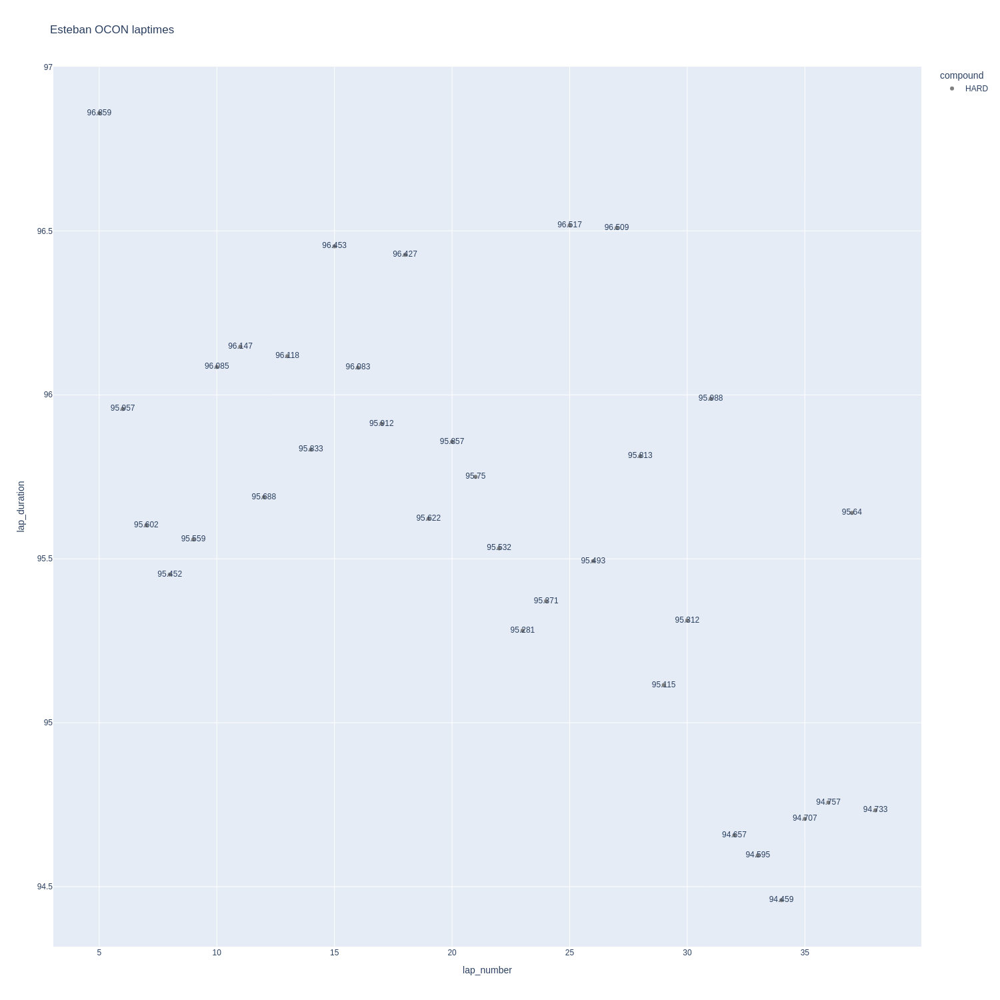

In [138]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

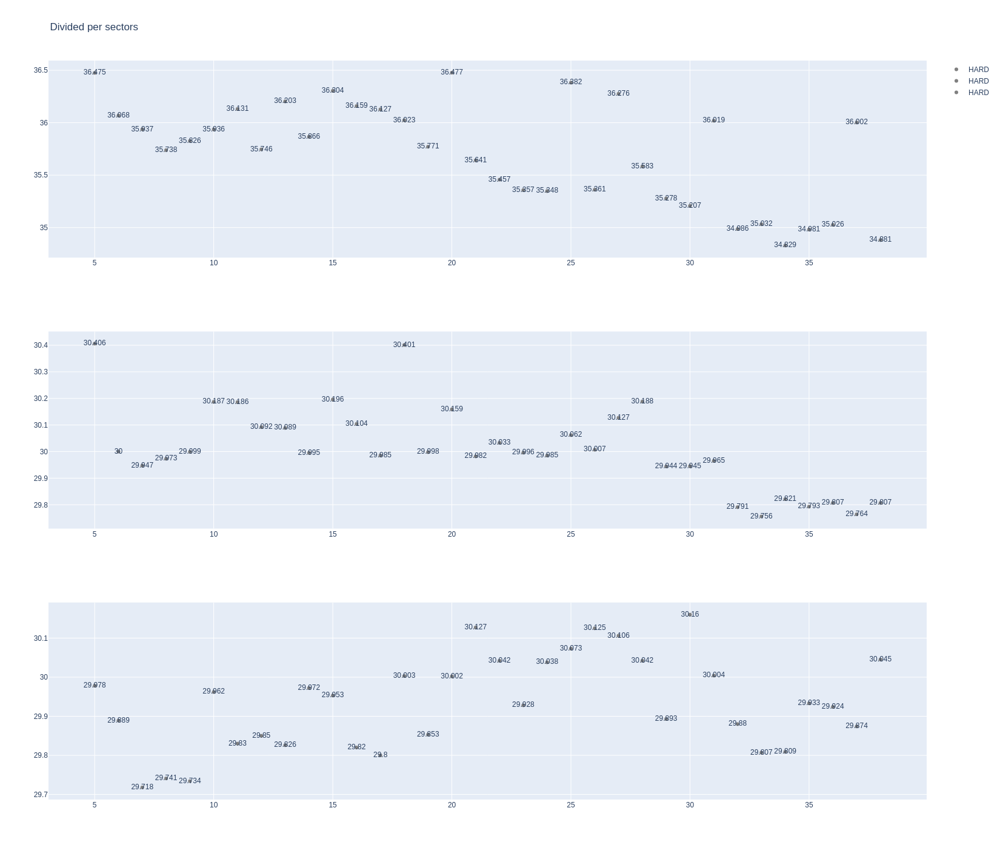

In [139]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [140]:
data = libraryDataF1.getinfolongruns(jointables,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
69,Oliver BEARMAN,MEDIUM,2025-04-20T17:11:43.367000+00:00,4,37.144,30.563,30.216,97.923
87,Oliver BEARMAN,MEDIUM,2025-04-20T17:13:21.236000+00:00,5,36.453,30.177,29.793,96.423
105,Oliver BEARMAN,MEDIUM,2025-04-20T17:14:57.699000+00:00,6,36.011,30.135,29.698,95.844
123,Oliver BEARMAN,MEDIUM,2025-04-20T17:16:33.547000+00:00,7,35.447,29.934,29.676,95.057
141,Oliver BEARMAN,MEDIUM,2025-04-20T17:18:08.560000+00:00,8,35.367,29.954,29.764,95.085
159,Oliver BEARMAN,MEDIUM,2025-04-20T17:19:43.660000+00:00,9,35.571,29.909,29.849,95.329
177,Oliver BEARMAN,MEDIUM,2025-04-20T17:21:19.141000+00:00,10,35.586,29.961,29.958,95.505
195,Oliver BEARMAN,MEDIUM,2025-04-20T17:22:54.478000+00:00,11,35.655,29.969,29.799,95.423
213,Oliver BEARMAN,MEDIUM,2025-04-20T17:24:29.943000+00:00,12,35.831,30.006,29.951,95.788
231,Oliver BEARMAN,MEDIUM,2025-04-20T17:26:05.772000+00:00,13,35.816,30.210,29.840,95.866


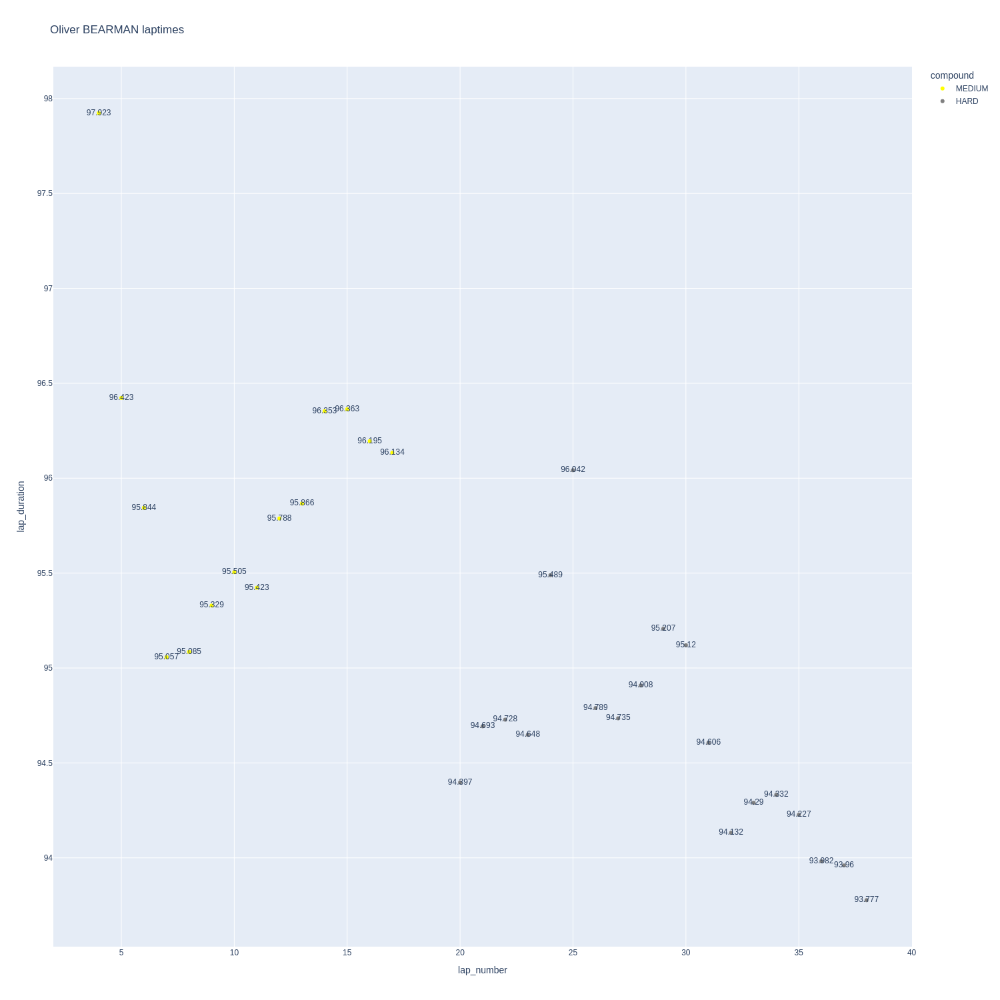

In [141]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

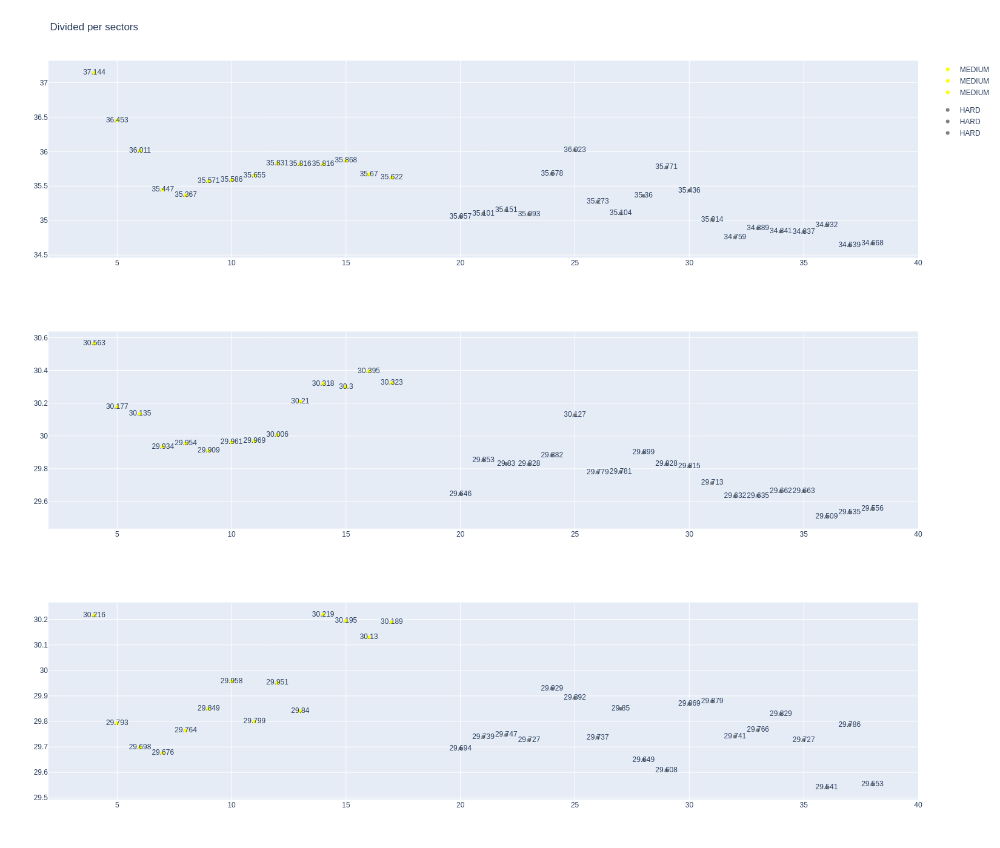

In [142]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [143]:
stintInformation.query('driver_number == 10 or driver_number == 7')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1258,10022,1,7,1,1,MEDIUM,0
2,1258,10022,1,10,1,1,MEDIUM,0
20,1258,10022,2,7,2,31,HARD,0
35,1258,10022,3,7,32,40,HARD,1


In [144]:
data =libraryDataF1.getinfolongruns(jointables,7,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
74,Jack DOOHAN,HARD,2025-04-20T17:13:23.018000+00:00,5,36.451,30.270,29.999,96.720
92,Jack DOOHAN,HARD,2025-04-20T17:14:59.765000+00:00,6,35.931,30.158,29.839,95.928
110,Jack DOOHAN,HARD,2025-04-20T17:16:35.719000+00:00,7,35.881,29.946,29.731,95.558
128,Jack DOOHAN,HARD,2025-04-20T17:18:11.185000+00:00,8,35.590,29.979,29.838,95.407
146,Jack DOOHAN,HARD,2025-04-20T17:19:46.628000+00:00,9,35.700,29.904,30.008,95.612
164,Jack DOOHAN,HARD,2025-04-20T17:21:22.146000+00:00,10,35.803,30.165,30.234,96.202
182,Jack DOOHAN,HARD,2025-04-20T17:22:58.419000+00:00,11,36.009,30.015,29.943,95.967
200,Jack DOOHAN,HARD,2025-04-20T17:24:34.369000+00:00,12,35.703,30.071,30.031,95.805
218,Jack DOOHAN,HARD,2025-04-20T17:26:10.156000+00:00,13,35.977,30.021,30.008,96.006
236,Jack DOOHAN,HARD,2025-04-20T17:27:46.191000+00:00,14,35.724,30.015,29.974,95.713


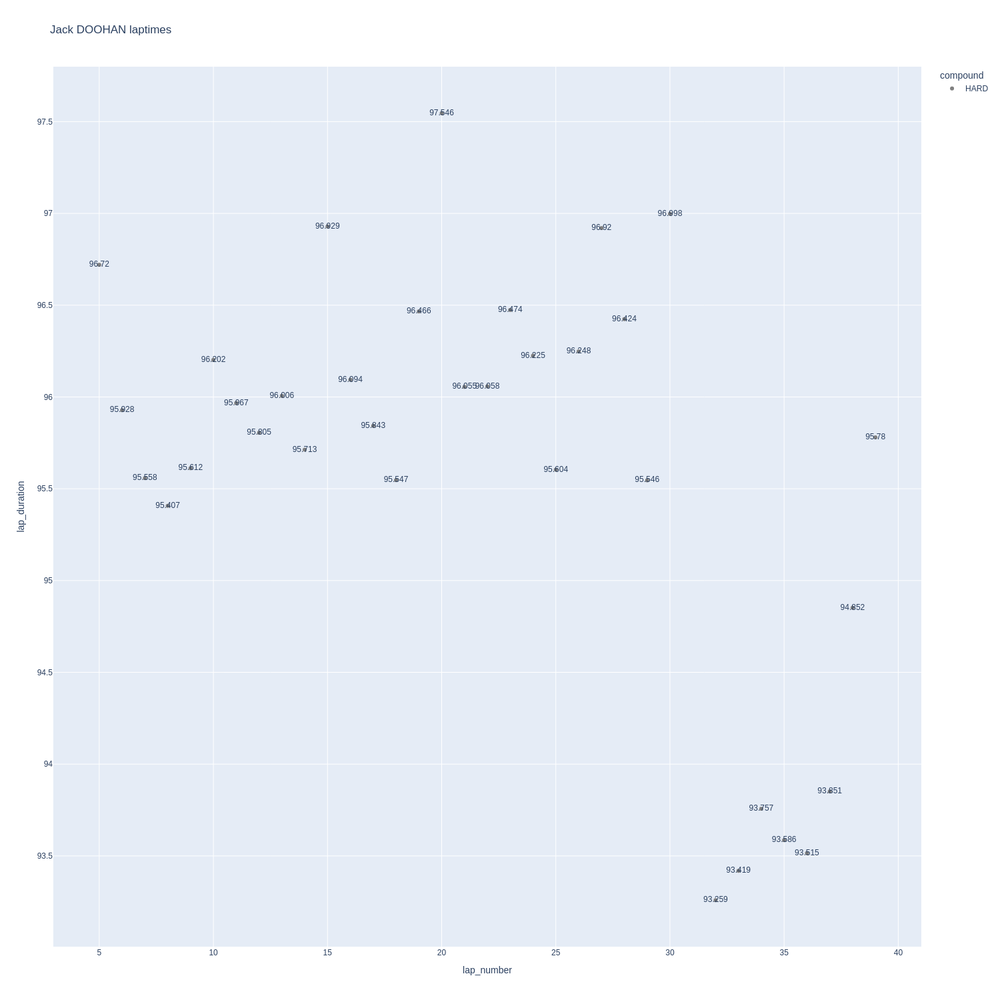

In [145]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

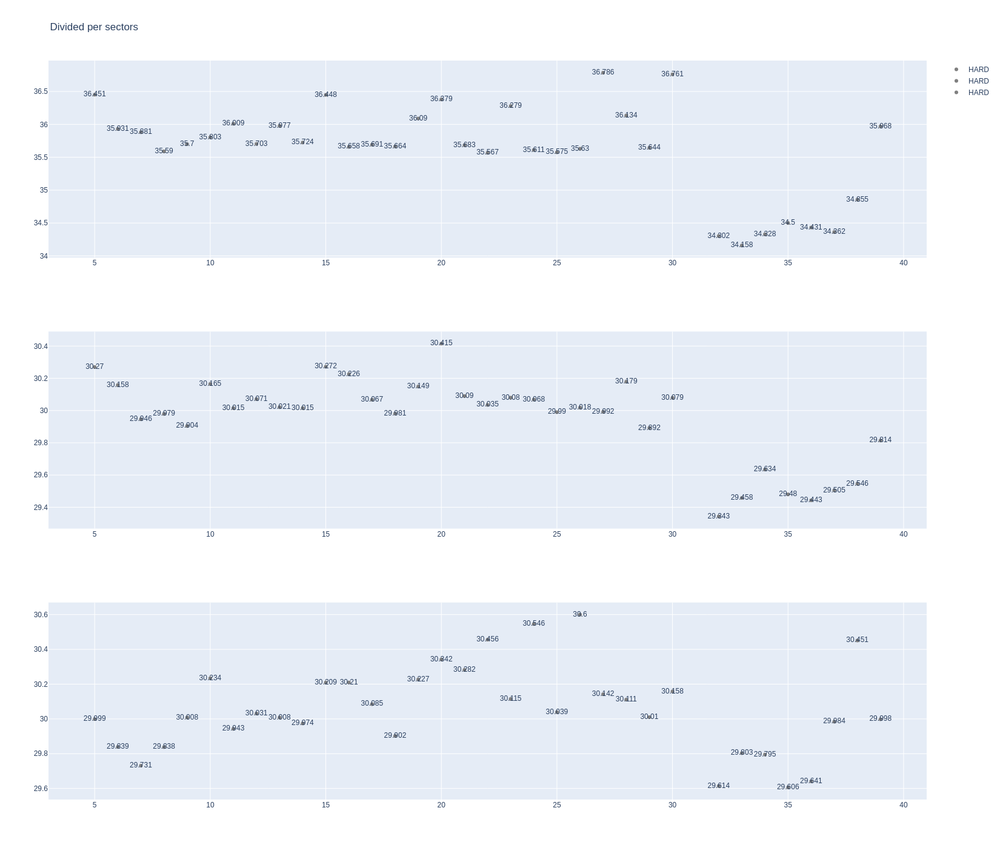

In [146]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [147]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [148]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [149]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [150]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
11,1258,10022,1,55,1,20,MEDIUM,0
13,1258,10022,1,23,1,21,MEDIUM,0
29,1258,10022,2,55,21,40,HARD,0
31,1258,10022,2,23,22,39,HARD,0


In [151]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
61,Alexander ALBON,MEDIUM,2025-04-20T17:11:42.098000+00:00,4,36.965,30.153,30.268,97.386
79,Alexander ALBON,MEDIUM,2025-04-20T17:13:19.299000+00:00,5,36.057,29.838,29.711,95.606
97,Alexander ALBON,MEDIUM,2025-04-20T17:14:54.949000+00:00,6,35.834,29.637,29.677,95.148
115,Alexander ALBON,MEDIUM,2025-04-20T17:16:30.109000+00:00,7,35.779,29.798,29.796,95.373
133,Alexander ALBON,MEDIUM,2025-04-20T17:18:05.466000+00:00,8,35.612,29.846,29.759,95.217
151,Alexander ALBON,MEDIUM,2025-04-20T17:19:40.692000+00:00,9,35.297,29.763,29.861,94.921
169,Alexander ALBON,MEDIUM,2025-04-20T17:21:15.656000+00:00,10,35.289,29.728,29.875,94.892
187,Alexander ALBON,MEDIUM,2025-04-20T17:22:50.496000+00:00,11,35.478,29.691,29.835,95.004
205,Alexander ALBON,MEDIUM,2025-04-20T17:24:25.585000+00:00,12,35.375,29.693,29.836,94.904
223,Alexander ALBON,MEDIUM,2025-04-20T17:26:00.393000+00:00,13,35.312,29.769,29.836,94.917


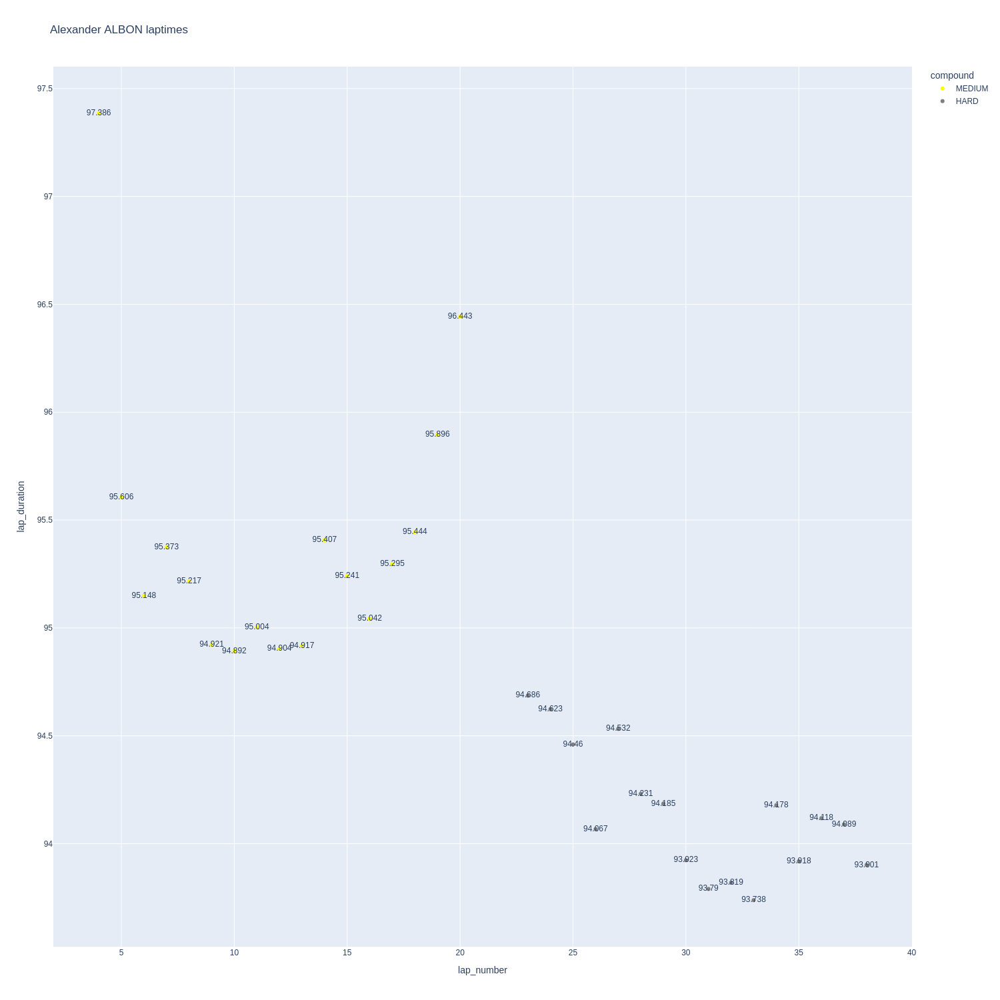

In [152]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

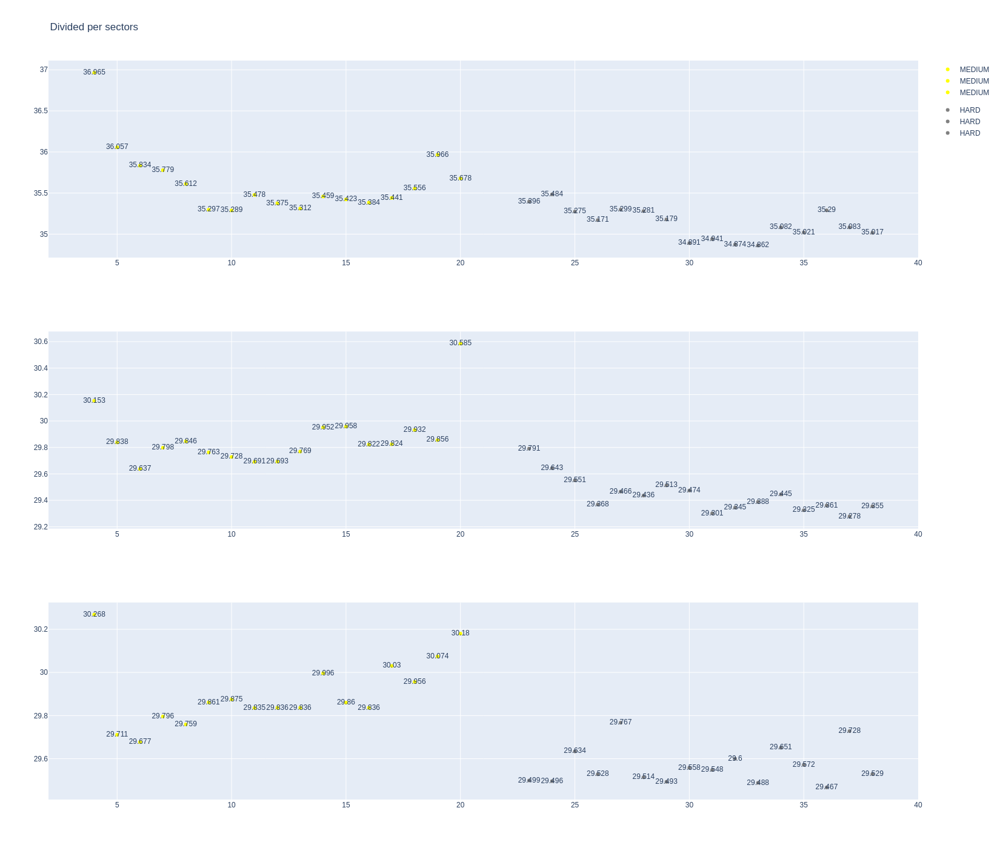

In [153]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [154]:
data= libraryDataF1.getinfolongruns(jointables,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
66,Carlos SAINZ,MEDIUM,2025-04-20T17:11:41.255000+00:00,4,36.831,29.882,30.101,96.814
84,Carlos SAINZ,MEDIUM,2025-04-20T17:13:18.119000+00:00,5,35.964,29.945,29.808,95.717
102,Carlos SAINZ,MEDIUM,2025-04-20T17:14:53.777000+00:00,6,35.444,29.802,29.869,95.115
120,Carlos SAINZ,MEDIUM,2025-04-20T17:16:28.937000+00:00,7,36.229,29.438,29.739,95.406
138,Carlos SAINZ,MEDIUM,2025-04-20T17:18:04.247000+00:00,8,35.662,29.774,29.703,95.139
156,Carlos SAINZ,MEDIUM,2025-04-20T17:19:39.520000+00:00,9,35.196,29.650,29.844,94.690
174,Carlos SAINZ,MEDIUM,2025-04-20T17:21:14.094000+00:00,10,35.261,29.730,29.878,94.869
192,Carlos SAINZ,MEDIUM,2025-04-20T17:22:49.058000+00:00,11,35.207,29.723,29.841,94.771
210,Carlos SAINZ,MEDIUM,2025-04-20T17:24:23.832000+00:00,12,35.245,29.802,29.917,94.964
228,Carlos SAINZ,MEDIUM,2025-04-20T17:25:58.733000+00:00,13,35.343,29.830,29.817,94.990


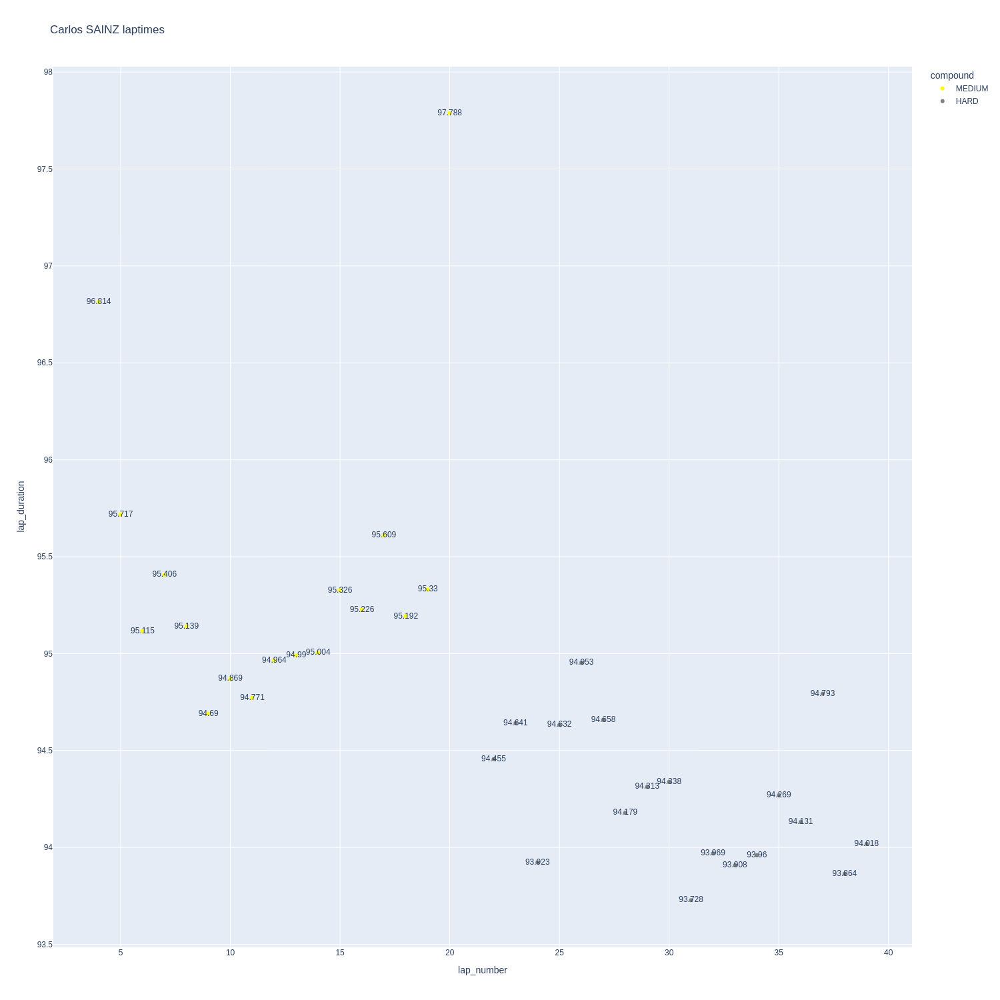

In [155]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

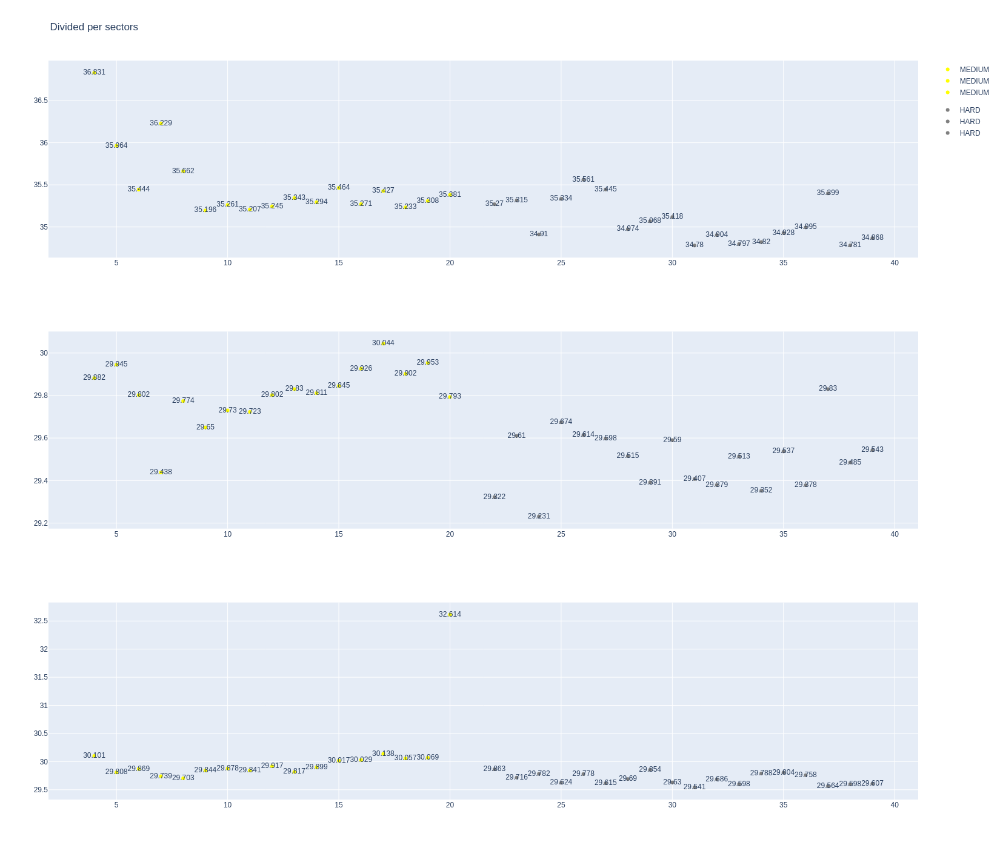

In [156]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [157]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1258,10022,1,5,1,1,MEDIUM,0
16,1258,10022,1,27,1,30,HARD,0
21,1258,10022,2,5,2,39,HARD,0
34,1258,10022,2,27,31,39,MEDIUM,0


In [158]:
data = libraryDataF1.getinfolongruns(jointables,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
80,Nico HULKENBERG,HARD,2025-04-20T17:13:22.393000+00:00,5,36.499,30.039,30.018,96.556
98,Nico HULKENBERG,HARD,2025-04-20T17:14:58.984000+00:00,6,36.142,29.997,29.836,95.975
116,Nico HULKENBERG,HARD,2025-04-20T17:16:34.953000+00:00,7,35.767,29.816,29.941,95.524
134,Nico HULKENBERG,HARD,2025-04-20T17:18:10.497000+00:00,8,35.739,29.881,29.904,95.524
152,Nico HULKENBERG,HARD,2025-04-20T17:19:46.078000+00:00,9,35.702,30.040,29.899,95.641
170,Nico HULKENBERG,HARD,2025-04-20T17:21:21.646000+00:00,10,35.966,30.112,30.212,96.290
188,Nico HULKENBERG,HARD,2025-04-20T17:22:57.924000+00:00,11,35.663,30.146,30.059,95.868
206,Nico HULKENBERG,HARD,2025-04-20T17:24:33.881000+00:00,12,35.621,30.104,30.118,95.843
224,Nico HULKENBERG,HARD,2025-04-20T17:26:09.656000+00:00,13,35.730,30.199,30.051,95.980
242,Nico HULKENBERG,HARD,2025-04-20T17:27:45.611000+00:00,14,35.676,30.139,30.108,95.923


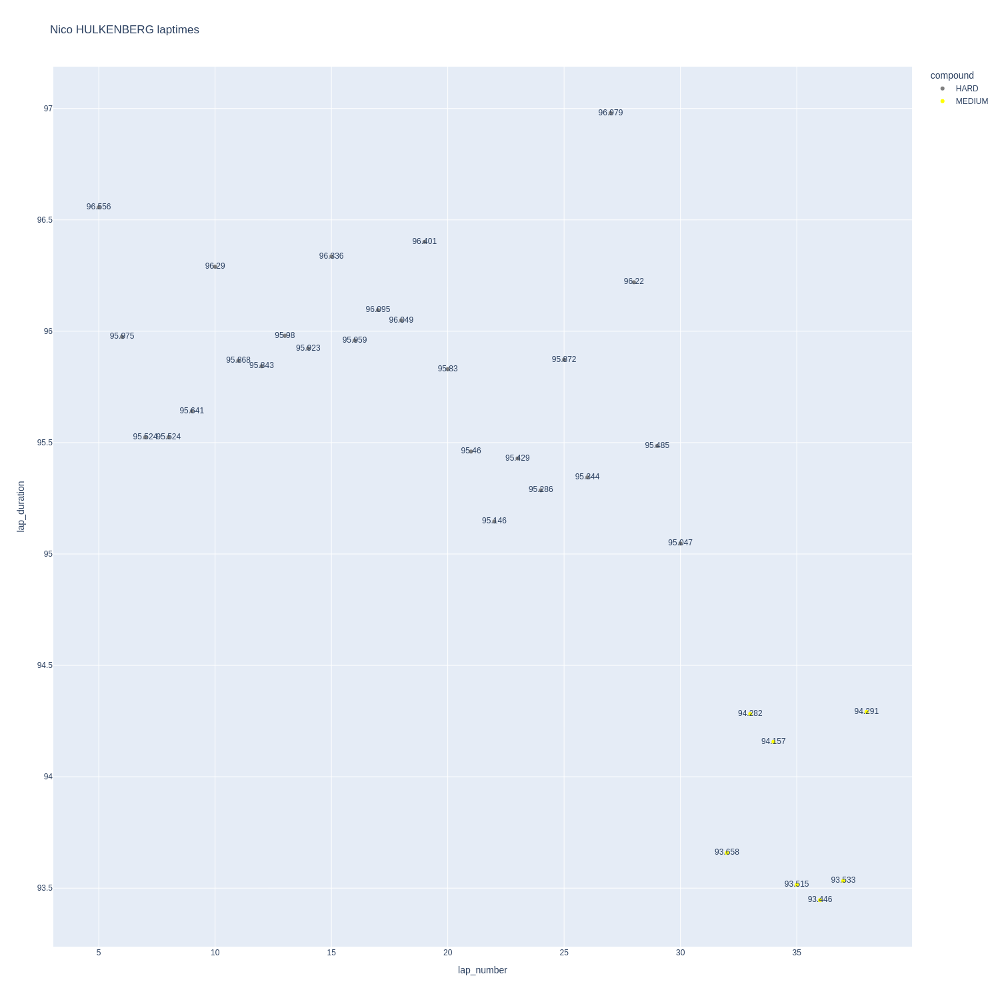

In [159]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

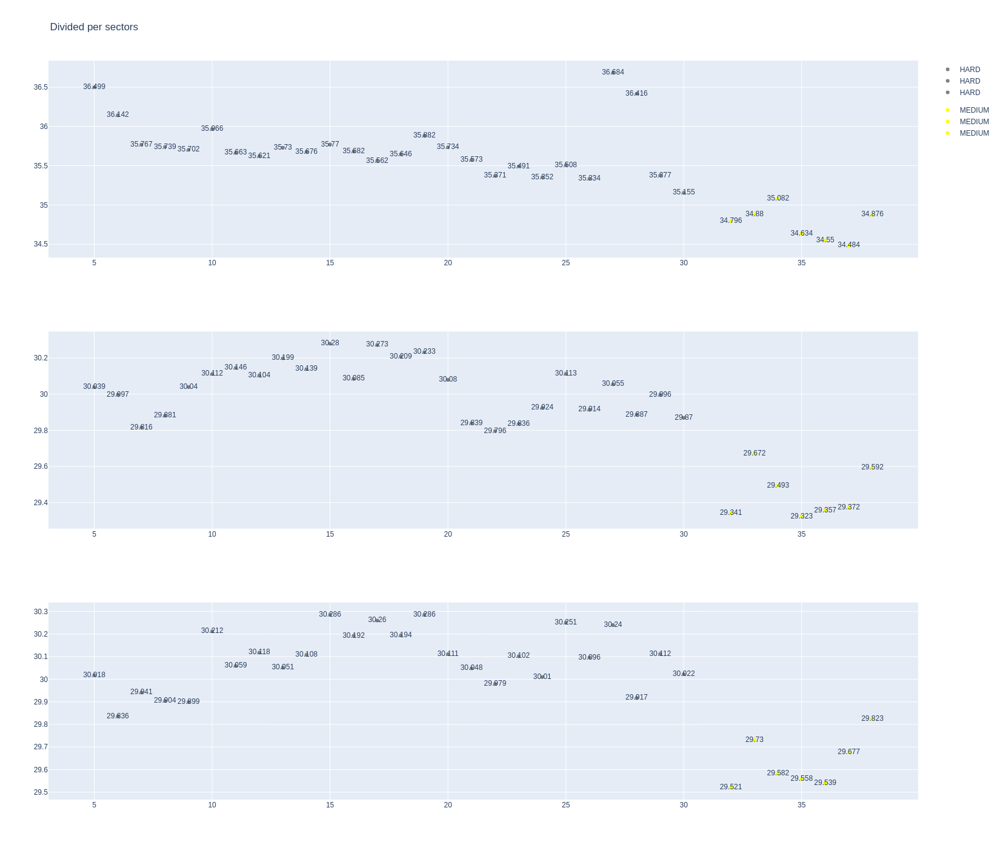

In [160]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [161]:
data = libraryDataF1.getinfolongruns(jointables,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
72,Gabriel BORTOLETO,HARD,2025-04-20T17:13:23.986000+00:00,5,36.579,30.257,30.095,96.931
90,Gabriel BORTOLETO,HARD,2025-04-20T17:15:00.889000+00:00,6,36.121,30.187,30.218,96.526
108,Gabriel BORTOLETO,HARD,2025-04-20T17:16:37.544000+00:00,7,35.912,30.275,30.113,96.300
126,Gabriel BORTOLETO,HARD,2025-04-20T17:18:13.810000+00:00,8,35.556,31.194,30.244,96.994
144,Gabriel BORTOLETO,HARD,2025-04-20T17:19:50.789000+00:00,9,35.398,29.981,30.196,95.575
162,Gabriel BORTOLETO,HARD,2025-04-20T17:21:26.288000+00:00,10,35.417,30.138,30.035,95.590
180,Gabriel BORTOLETO,HARD,2025-04-20T17:23:01.885000+00:00,11,35.435,30.156,30.147,95.738
198,Gabriel BORTOLETO,HARD,2025-04-20T17:24:37.628000+00:00,12,35.497,30.212,30.101,95.810
216,Gabriel BORTOLETO,HARD,2025-04-20T17:26:13.437000+00:00,13,35.566,30.246,30.160,95.972
234,Gabriel BORTOLETO,HARD,2025-04-20T17:27:49.513000+00:00,14,35.496,30.283,30.227,96.006


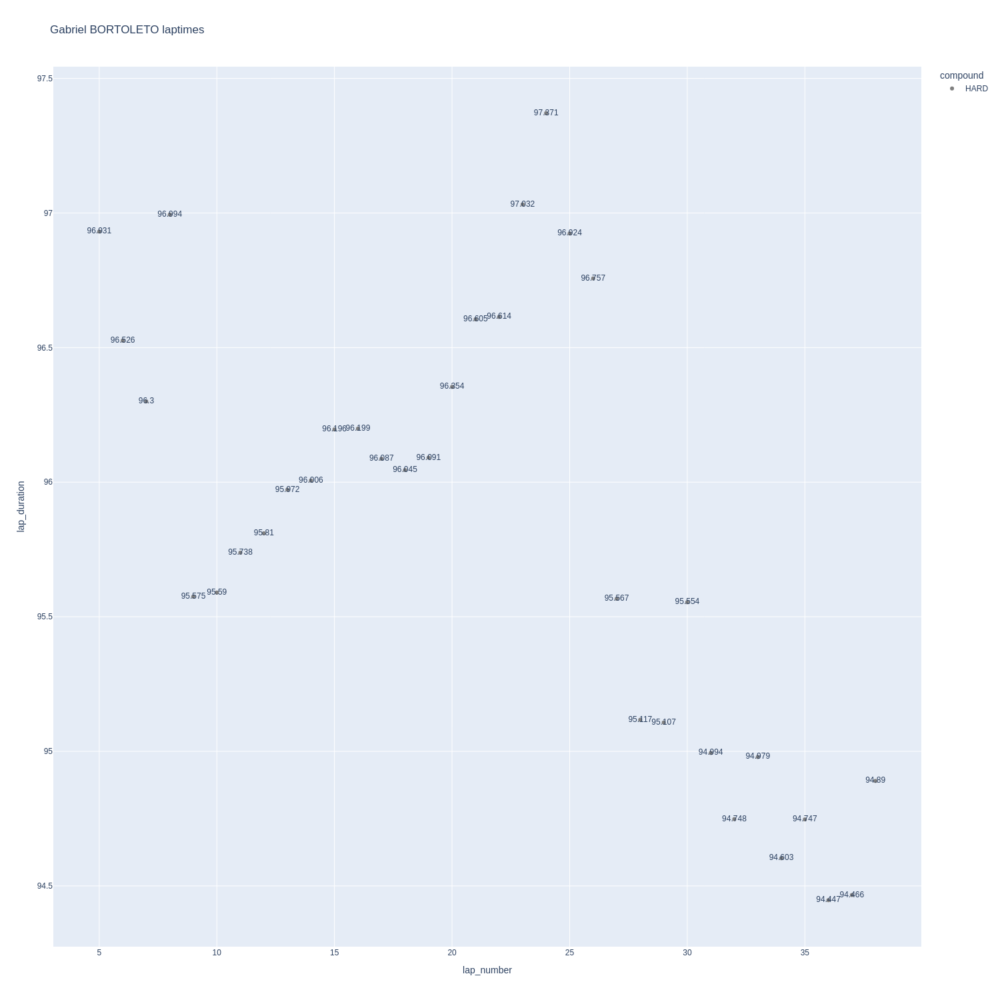

In [162]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

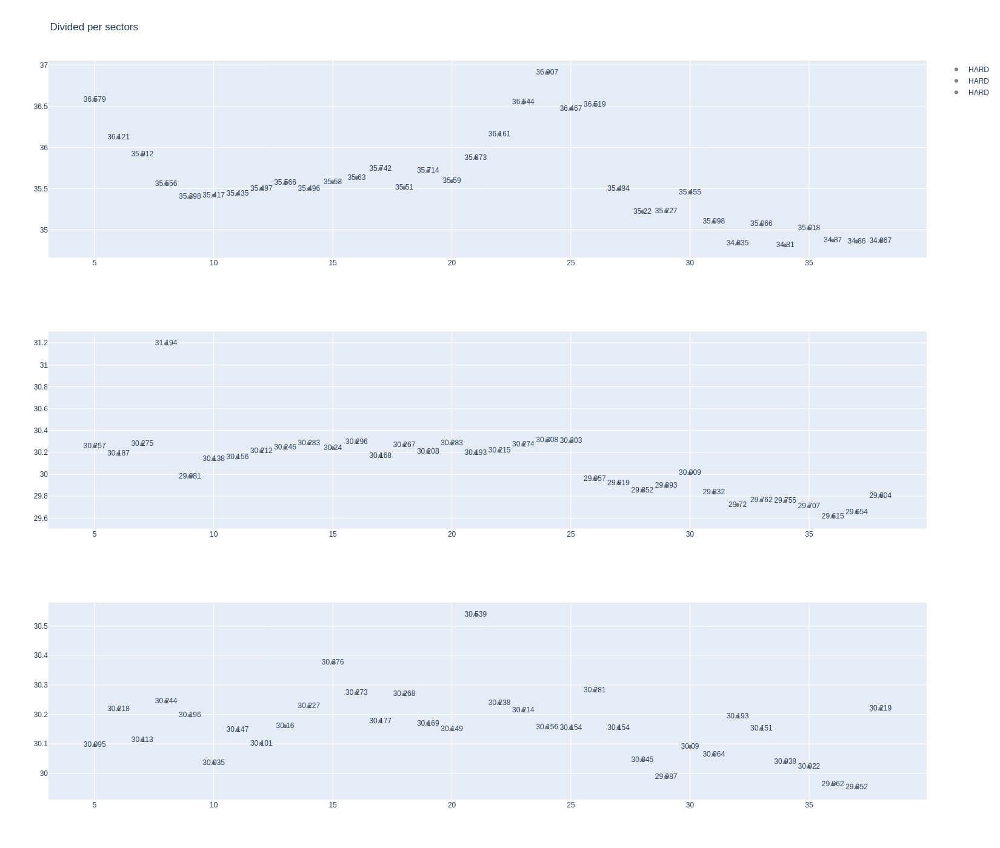

In [163]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [170]:
pit = libraryDataF1.obtain_information('pit',session_key=10022)

In [174]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<40")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Ferrari,20.10
Mercedes,20.30
Alpine,20.50
Racing Bulls,20.80
McLaren,20.85
Aston Martin,21.10
Kick Sauber,21.10
Haas F1 Team,21.75
Williams,23.10
